In [1]:
from daily_push.data_push import make_push_data
make_push_data()

0 0 days 00:00:45 45.0
1 0 days 00:00:53 53.0
2 0 days 00:01:07 67.0
3 0 days 00:01:09 69.0
4 0 days 00:01:14 74.0
5 0 days 00:01:20 80.0
6 0 days 00:01:44 104.0
7 0 days 00:01:51 111.0
8 0 days 00:02:01 121.0
9 0 days 00:02:42 162.0
10 0 days 00:03:17 197.0
11 0 days 00:03:25 205.0
12 0 days 00:04:02 242.0
13 0 days 00:04:42 282.0
14 0 days 00:05:04 304.0
15 0 days 00:05:59 359.0
16 0 days 00:06:34 394.0
17 0 days 00:06:45 405.0
18 0 days 00:07:37 457.0
19 0 days 00:09:31 571.0
20 0 days 00:10:05 605.0
21 0 days 00:10:17 617.0
22 0 days 00:12:06 726.0
23 0 days 00:12:07 727.0
24 0 days 00:12:26 746.0
25 0 days 00:13:17 797.0
26 0 days 00:14:41 881.0
27 0 days 00:15:14 914.0
28 0 days 00:15:46 946.0
29 0 days 00:17:33 1053.0
30 0 days 00:21:00 1260.0
31 0 days 00:26:13 1573.0
32 0 days 00:26:48 1608.0
33 0 days 00:27:59 1679.0
34 0 days 00:28:00 1680.0
35 0 days 00:29:29 1769.0
36 0 days 00:35:00 2100.0
37 0 days 00:40:04 2404.0
38 0 days 00:51:51 3111.0
39 0 days 00:55:58 3358.0
40 0 

2024-06-27 07:10:19.145 | WARNING  | fitter.fitter:_fit_single_distribution:337 - SKIPPED _fit distribution (taking more than 30 seconds)
2024-06-27 07:10:19.192 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted bradford distribution with error=0.0)
2024-06-27 07:10:19.284 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted argus distribution with error=0.0)
2024-06-27 07:10:19.294 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted dweibull distribution with error=0.0)
2024-06-27 07:10:19.300 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted cauchy distribution with error=0.0)
2024-06-27 07:10:19.301 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted expon distribution with error=0.0)
2024-06-27 07:10:19.349 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted dgamma distribution with error=0.0)
2024-06-27 07:10:19.353 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted alpha distribution wi

In [ ]:
db_info = {'host': '163.152.172.163',
          'port': '5432',
          'db_name': 'postgres',
          'user_name': 'tgsociety',
          'password': 'tgsociety'}

In [ ]:
학습 (클러스터 저장, 모델 저장), 실험, best모델 기록

In [1]:
import os
import sys
working_dir = os.getcwd()
sys.path.append(working_dir)

import time

import pandas as pd
import numpy as np
import geopandas as gpd
import datetime
import random
import matplotlib.pyplot as plt 

from model_train_deploy.lib.db_io import Engine
from model_train_deploy.lib.utils import 구분데이터붙이기, generate_polygon_random_points, 공휴일출력, 예약가능시간출력, 이웃시간판단, time_to_minutes, which_시간대

import pytz
import requests
import pickle

from scipy.stats import mannwhitneyu
from scipy.stats import ks_2samp

from ortools.sat.python import cp_model

며칠뒤 = 30
예약가능시간s = ['09_00', '09_30', '10_00', '10_30', '11_00', '11_30', '12_00', '12_30', '13_00', '13_30', '14_00', '14_30', '15_00', '15_30', '16_00', '16_30', '17_00', '17_30', '18_00', '18_30', '19_00', '19_30', '20_00', '20_30', '21_00']
시간_인덱스_딕셔너리 = {time: index for index, time in enumerate(예약가능시간s)}

class Simulator_01():
    
    def __init__(self, 위치데이터_path, simulation_start_dt, simulation_end_dt, db_info, is_first = False, data_start_date = pd.to_datetime('2022-01-01'), data_end_date = None, weight_학생숫자 = 1, 차량숫자 = 12):
        '''
        시뮬레이터에서 사용하는 point 좌표는 모두 위경도 -> 미터 단위로 바꾸기 
        df[''] = df[''].to_crs(epsg = 3857) (위경도좌표 -> 미터좌표)
        df[''] = df[''].to_crs(epsg=4326) (미터좌표 -> 위경도좌표)
        '''
        
        if is_first == True:
            self.db_handler = Engine(db_info)
            self._01_수요데이터불러오기(start_datetime = None, end_datetime = pd.to_datetime(data_end_date))
            self._02_구분데이터붙이기()
            self._03_클러스터링()
            self._클러스터링결과저장()

select "고객_접속일시", "예약희망일시", "예약희망_point" from datamart.고객수요_집계구_뷰 where "예약희망일시" <= '2023-05-01 12:00:00+0900' and ("시군구_id" = '11220' OR "시군구_id" = '11230' OR "시군구_id" = '11240') order by "예약희망일시" asc
                               고객_접속일시                    예약희망일시  \
0     2022-04-20 13:13:57.860071+00:00 2022-04-22 01:00:00+00:00   
1     2022-04-18 07:09:35.753180+00:00 2022-04-22 02:00:00+00:00   
2     2022-04-20 13:03:34.850384+00:00 2022-04-22 02:30:00+00:00   
3     2022-04-20 18:09:54.559020+00:00 2022-04-22 03:00:00+00:00   
4     2022-04-20 10:57:58.379582+00:00 2022-04-22 03:00:00+00:00   
...                                ...                       ...   
24507 2023-04-30 02:59:40.710080+00:00 2023-05-01 00:30:00+00:00   
24508 2023-04-29 14:25:35.428204+00:00 2023-05-01 01:00:00+00:00   
24509 2023-04-29 16:20:00.089990+00:00 2023-05-01 02:30:00+00:00   
24510 2023-04-28 05:56:21.869524+00:00 2023-05-01 03:00:00+00:00   
24511 2023-04-29 16:22:08.742136+00:00 2023-05-01 

/home/yspark/miniconda3/envs/test_make_data_3/lib/python3.9/site-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/yspark/miniconda3/envs/test_make_data_3/lib/python3.9/site-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


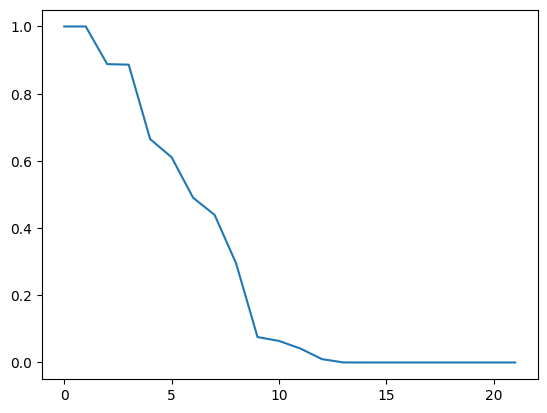

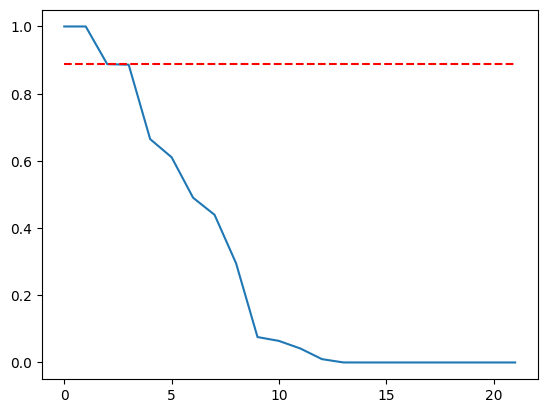

/home/yspark/driving-teacher-ai/dags/model_train_deploy/lib/simulator_03.py:1018: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.hierarchy_sample_data[key] = pd.concat([self.hierarchy_sample_data[key],
/home/yspark/driving-teacher-ai/dags/model_train_deploy/lib/simulator_03.py:1018: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  self.hierarchy_sample_data[key] = pd.concat([self.hierarchy_sample_data[key],
/home/yspark/driving-teacher-ai/dags/model_train_deploy/lib/simulator_03.py:1018: Future

In [1]:
from model_train_deploy.lib.simulator_03 import Simulator_01
import pandas as pd
db_info = {'host': '163.152.172.163',
          'port': '5432',
          'db_name': 'postgres',
          'user_name': 'tgsociety',
          'password': 'tgsociety'}

execution_date = '2023-05-01 12:00:00+09'


execution_date = pd.to_datetime(execution_date)
simulator = Simulator_01(
                             simulation_start_dt = execution_date, 
                             simulation_end_dt = execution_date + pd.Timedelta(value = 365, unit = 'day'),
                             data_end_date = execution_date,
                             db_info = db_info,
                             is_first = True,
                            시군구_ids = ['11220', '11230', '11240'], 차량숫자 = 15)
init_states = simulator.make_init_states(sample_num = 1000)

In [2]:
# 1차년도 최적화 x

20230406
20230407
하루 예약자 수       :   1    total 예약자 수    :   1   
하루 접속 고객 수     :   1    total 접속 고객 수  :   1   
하루 예약자 비율      : 100.0  total 예약자 비율   : 100.0 
하루 수업 횟수       :   0    total 수업 횟수    :   0   
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   0    total 강화학습 거절 횟수:   0   
하루 실행 시간       :  0.14  총 실행 시간        :  0.14 


20230408
하루 예약자 수       :   0    total 예약자 수    :   1   
하루 접속 고객 수     :   0    total 접속 고객 수  :   1   
하루 수업 횟수       :   0    total 수업 횟수    :   0   
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   0    total 강화학습 거절 횟수:   0   
하루 실행 시간       :  0.0   총 실행 시간        :  0.14 


20230409
하루 예약자 수       :   0    total 예약자 수    :   1   
하루 접속 고객 수     :   0    total 접속 고객 수  :   1   
하루 수업 횟수       :   0    total 수업 횟수    :   0   
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   0    total 강화학습 거절 횟수:   0   
하루 실행 시간       :  0.0   총 실행 시간        :  0.14 


20230410
하루 예약자 수       :   0    total 예

/home/yspark/driving-teacher-ai/dags/model_train_deploy/lib/sac_lstm.py:417: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:274.)
  actions2 = torch.tensor(actions, dtype=torch.float32).to(self.device).squeeze(1)


20230416
하루 예약자 수       :   1    total 예약자 수    :   2   
하루 접속 고객 수     :   1    total 접속 고객 수  :   4   
하루 예약자 비율      : 100.0  total 예약자 비율   :  50.0 
하루 수업 횟수       :   0    total 수업 횟수    :   0   
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   0    total 강화학습 거절 횟수:   2   
하루 실행 시간       :  0.39  총 실행 시간        :  0.95 


20230417
하루 예약자 수       :   0    total 예약자 수    :   2   
하루 접속 고객 수     :   0    total 접속 고객 수  :   4   
하루 수업 횟수       :   0    total 수업 횟수    :   0   
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   0    total 강화학습 거절 횟수:   2   
하루 실행 시간       :  0.0   총 실행 시간        :  0.95 


20230418
하루 예약자 수       :   0    total 예약자 수    :   2   
하루 접속 고객 수     :   0    total 접속 고객 수  :   4   
하루 수업 횟수       :   0    total 수업 횟수    :   0   
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   0    total 강화학습 거절 횟수:   2   
하루 실행 시간       :  0.0   총 실행 시간        :  0.95 


20230419
하루 예약자 수       :   0    total 예약자 수    :

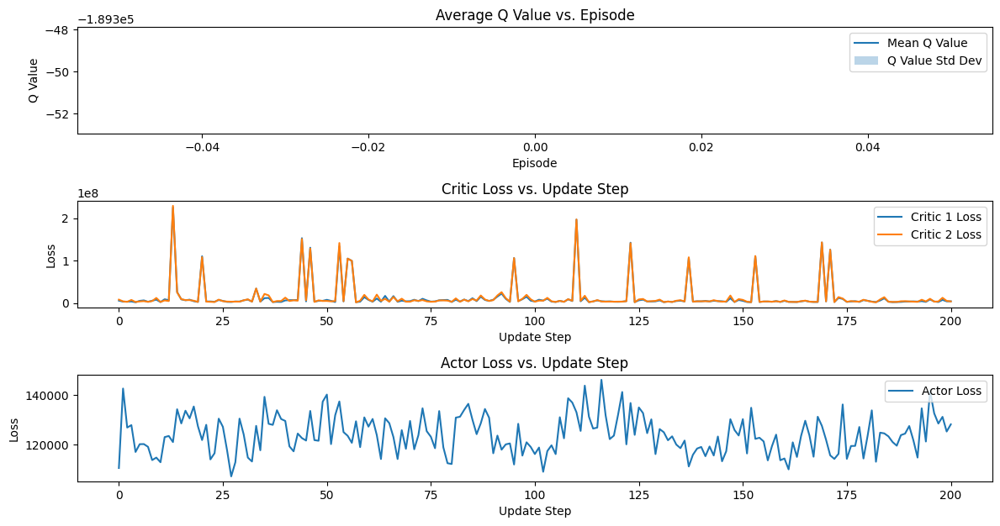

20230509
하루 예약자 수       :   39   total 예약자 수    :  342  
하루 접속 고객 수     :   47   total 접속 고객 수  :  452  
하루 예약자 비율      : 82.98  total 예약자 비율   : 75.66 
하루 수업 횟수       :   32   total 수업 횟수    :  312  
하루 차량당 수업횟수    :  2.67  total 차량당 수업횟수 :  2.97 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   77   total 강화학습 거절 횟수:  632  
하루 실행 시간       : 24.37  총 실행 시간        : 221.95


20230510
하루 예약자 수       :   31   total 예약자 수    :  373  
하루 접속 고객 수     :   49   total 접속 고객 수  :  501  
하루 예약자 비율      : 63.27  total 예약자 비율   : 74.45 
하루 수업 횟수       :   36   total 수업 횟수    :  348  
하루 차량당 수업횟수    :  3.0   total 차량당 수업횟수 :  2.97 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   41   total 강화학습 거절 횟수:  673  
하루 실행 시간       : 29.13  총 실행 시간        : 251.08


20230511
하루 예약자 수       :   41   total 예약자 수    :  414  
하루 접속 고객 수     :   51   total 접속 고객 수  :  552  
하루 예약자 비율      : 80.39  total 예약자 비율   :  75.0 
하루 수업 횟수       :   37   total 수업 횟수    :  385  
하루 차량

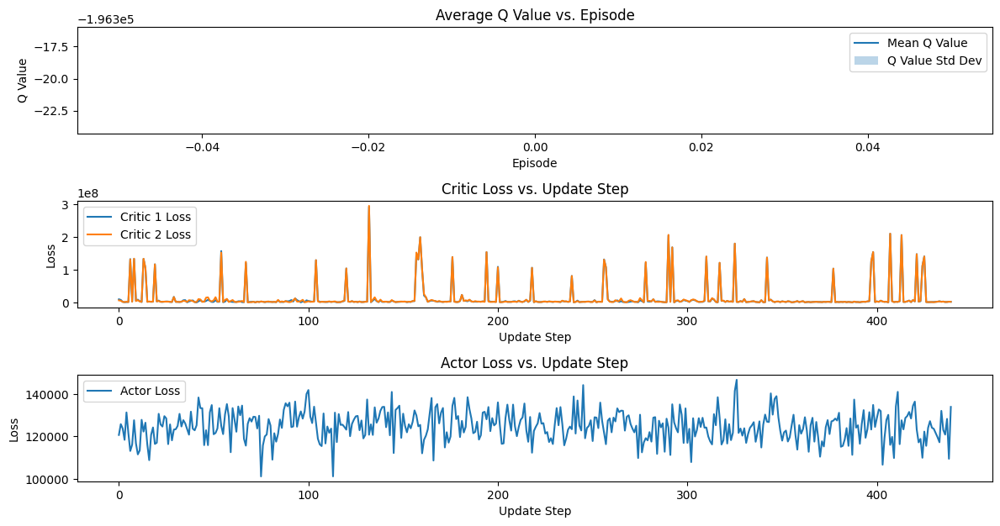

20230519
하루 예약자 수       :   32   total 예약자 수    :  710  
하루 접속 고객 수     :   48   total 접속 고객 수  :  932  
하루 예약자 비율      : 66.67  total 예약자 비율   : 76.18 
하루 수업 횟수       :   34   total 수업 횟수    :  664  
하루 차량당 수업횟수    :  2.83  total 차량당 수업횟수 :  3.0  
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   61   total 강화학습 거절 횟수:  1261 
하루 실행 시간       :  26.4  총 실행 시간        : 462.29


20230520
하루 예약자 수       :   49   total 예약자 수    :  759  
하루 접속 고객 수     :   58   total 접속 고객 수  :  990  
하루 예약자 비율      : 84.48  total 예약자 비율   : 76.67 
하루 수업 횟수       :   46   total 수업 횟수    :  710  
하루 차량당 수업횟수    :  3.83  total 차량당 수업횟수 :  3.05 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   85   total 강화학습 거절 횟수:  1346 
하루 실행 시간       : 36.56  총 실행 시간        : 498.85


20230521
하루 예약자 수       :   41   total 예약자 수    :  800  
하루 접속 고객 수     :   49   total 접속 고객 수  :  1039 
하루 예약자 비율      : 83.67  total 예약자 비율   :  77.0 
하루 수업 횟수       :   38   total 수업 횟수    :  748  
하루 차량

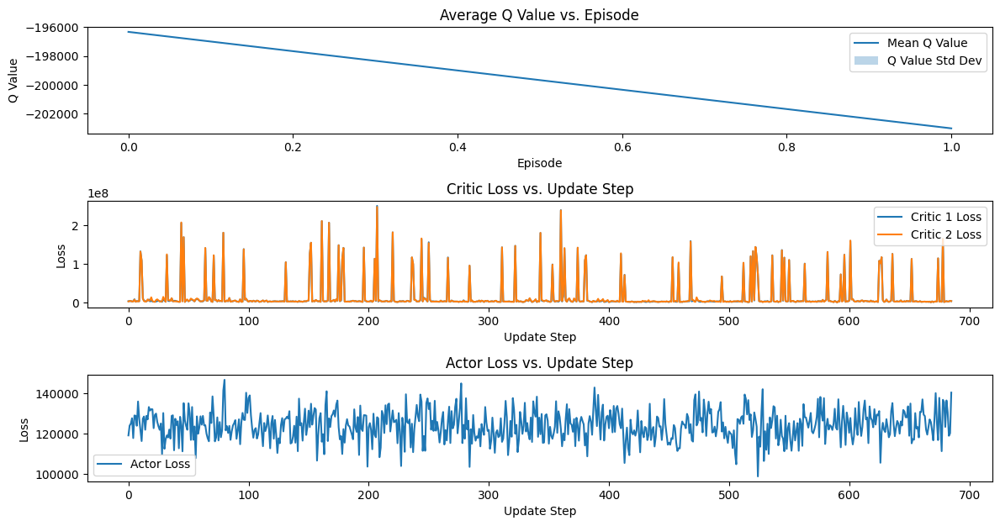

20230529
하루 예약자 수       :   44   total 예약자 수    :  1111 
하루 접속 고객 수     :   53   total 접속 고객 수  :  1429 
하루 예약자 비율      : 83.02  total 예약자 비율   : 77.75 
하루 수업 횟수       :   38   total 수업 횟수    :  1055 
하루 차량당 수업횟수    :  3.17  total 차량당 수업횟수 :  3.16 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   66   total 강화학습 거절 횟수:  1931 
하루 실행 시간       : 27.64  총 실행 시간        : 742.25


20230530
하루 예약자 수       :   29   total 예약자 수    :  1140 
하루 접속 고객 수     :   45   total 접속 고객 수  :  1474 
하루 예약자 비율      : 64.44  total 예약자 비율   : 77.34 
하루 수업 횟수       :   23   total 수업 횟수    :  1078 
하루 차량당 수업횟수    :  1.92  total 차량당 수업횟수 :  3.12 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   48   total 강화학습 거절 횟수:  1979 
하루 실행 시간       : 19.23  총 실행 시간        : 761.48


20230531
하루 예약자 수       :   46   total 예약자 수    :  1186 
하루 접속 고객 수     :   73   total 접속 고객 수  :  1547 
하루 예약자 비율      : 63.01  total 예약자 비율   : 76.66 
하루 수업 횟수       :   41   total 수업 횟수    :  1119 
하루 차량

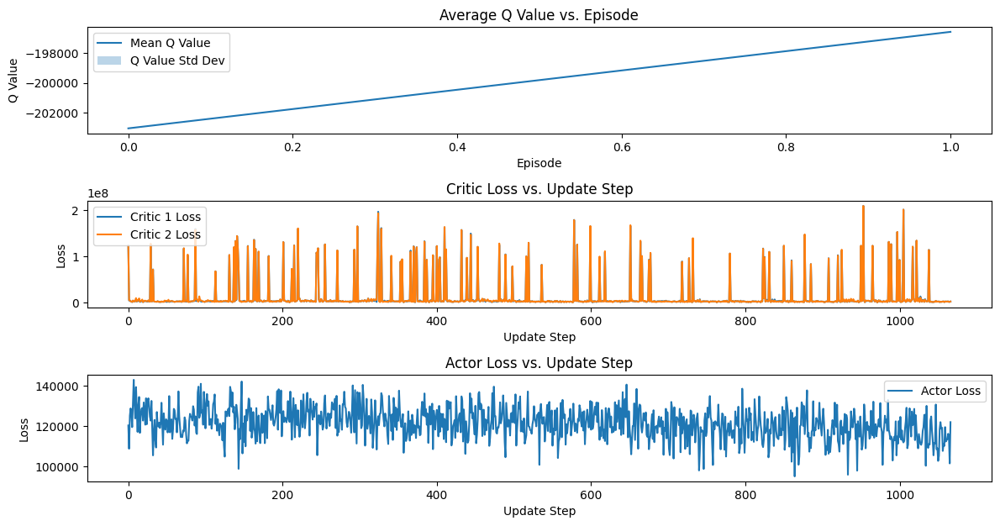

20230608
하루 예약자 수       :   47   total 예약자 수    :  1569 
하루 접속 고객 수     :   68   total 접속 고객 수  :  2206 
하루 예약자 비율      : 69.12  total 예약자 비율   : 71.12 
하루 수업 횟수       :   58   total 수업 횟수    :  1512 
하루 차량당 수업횟수    :  4.83  total 차량당 수업횟수 :  3.33 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   73   total 강화학습 거절 횟수:  2633 
하루 실행 시간       : 56.29  총 실행 시간        : 1284.52


20230609
하루 예약자 수       :   68   total 예약자 수    :  1637 
하루 접속 고객 수     :  101   total 접속 고객 수  :  2307 
하루 예약자 비율      : 67.33  total 예약자 비율   : 70.96 
하루 수업 횟수       :   52   total 수업 횟수    :  1564 
하루 차량당 수업횟수    :  4.33  total 차량당 수업횟수 :  3.36 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   93   total 강화학습 거절 횟수:  2726 
하루 실행 시간       : 64.43  총 실행 시간        : 1348.94


20230610
하루 예약자 수       :   66   total 예약자 수    :  1703 
하루 접속 고객 수     :  101   total 접속 고객 수  :  2408 
하루 예약자 비율      : 65.35  total 예약자 비율   : 70.72 
하루 수업 횟수       :   56   total 수업 횟수    :  1620 
하루 

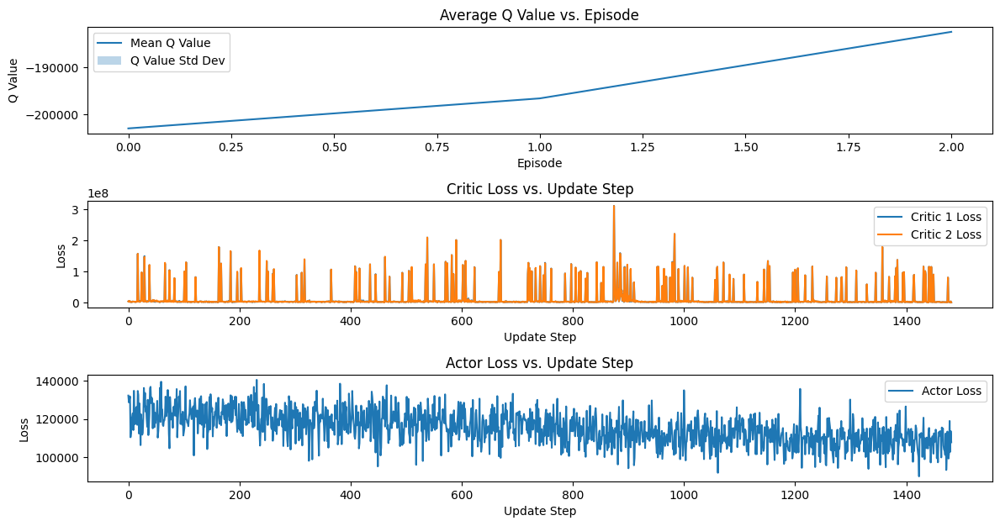

20230618
하루 예약자 수       :   45   total 예약자 수    :  2075 
하루 접속 고객 수     :   77   total 접속 고객 수  :  3045 
하루 예약자 비율      : 58.44  total 예약자 비율   : 68.14 
하루 수업 횟수       :   46   total 수업 횟수    :  2007 
하루 차량당 수업횟수    :  3.83  total 차량당 수업횟수 :  3.5  
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   73   total 강화학습 거절 횟수:  3325 
하루 실행 시간       : 49.33  총 실행 시간        : 1905.9


saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved be

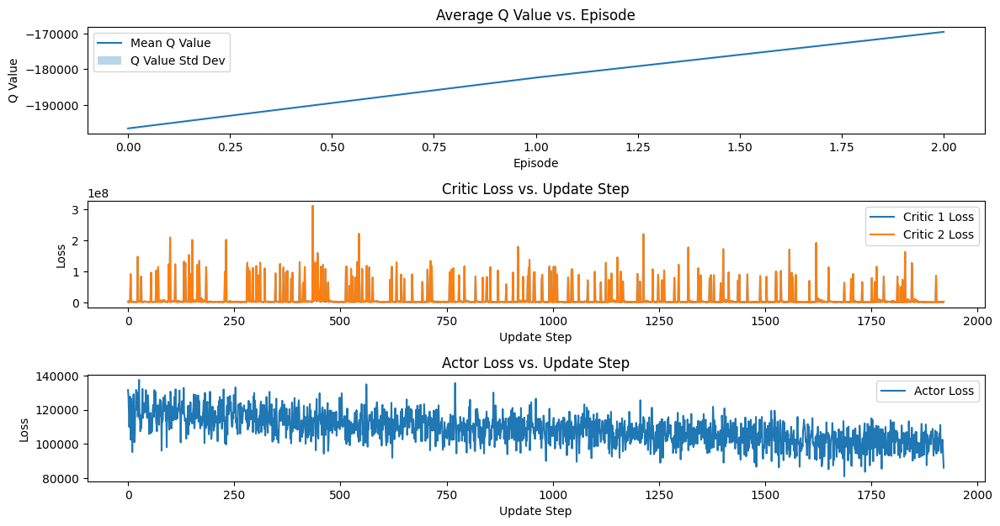

saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best mod

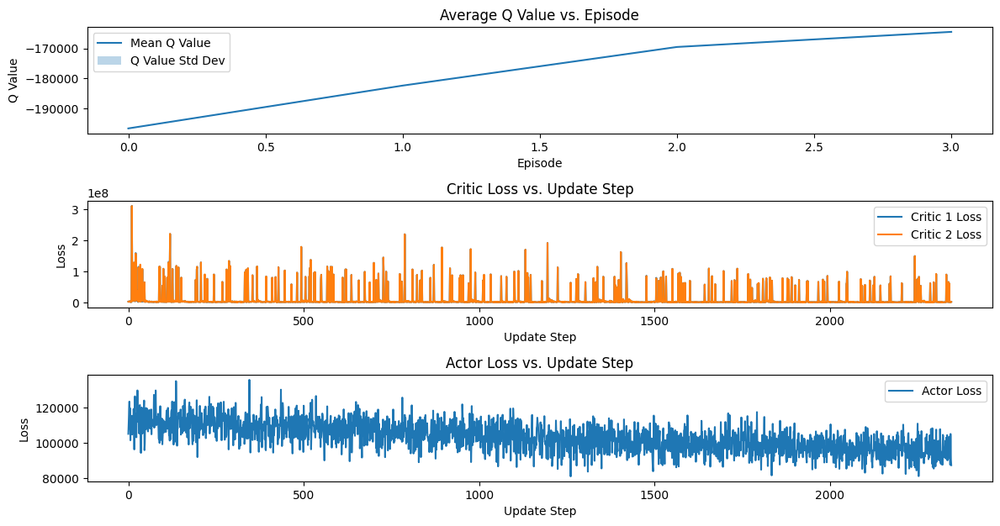

saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best mod

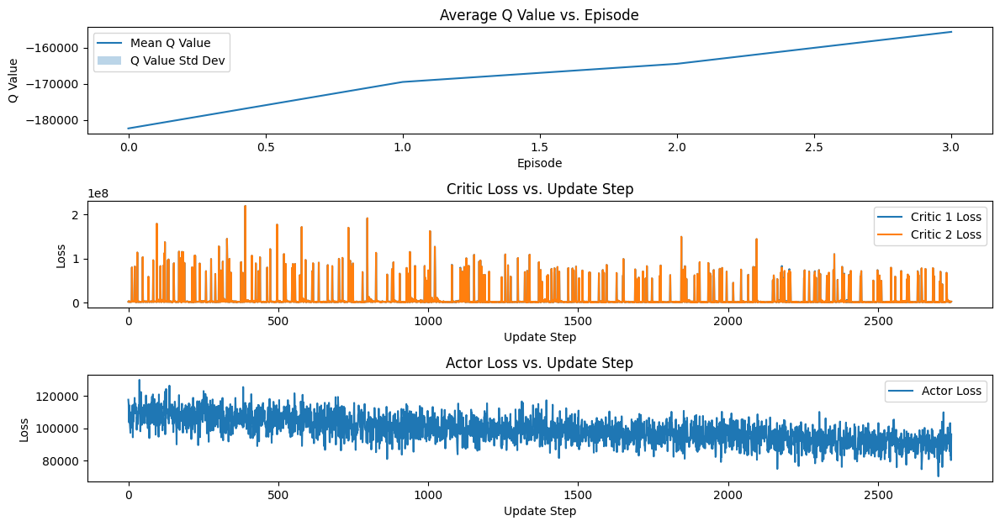

saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
20230718
하루 예약

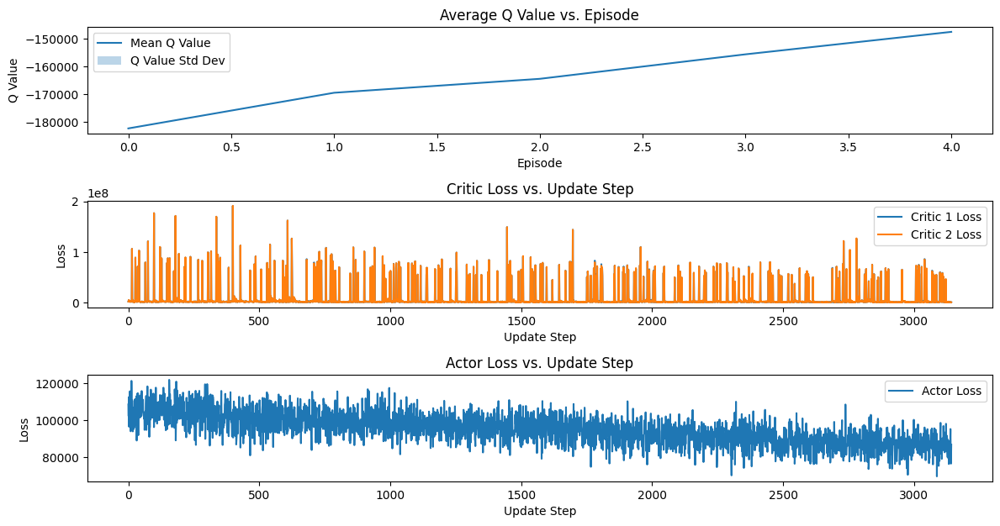

20230728
하루 예약자 수       :   47   total 예약자 수    :  3997 
하루 접속 고객 수     :   83   total 접속 고객 수  :  6372 
하루 예약자 비율      : 56.63  total 예약자 비율   : 62.73 
하루 수업 횟수       :   45   total 수업 횟수    :  3936 
하루 차량당 수업횟수    :  3.75  total 차량당 수업횟수 :  3.73 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   70   total 강화학습 거절 횟수:  6139 
하루 실행 시간       : 48.25  총 실행 시간        : 4158.64


20230729
하루 예약자 수       :   55   total 예약자 수    :  4052 
하루 접속 고객 수     :   88   total 접속 고객 수  :  6460 
하루 예약자 비율      :  62.5  total 예약자 비율   : 62.72 
하루 수업 횟수       :   55   total 수업 횟수    :  3991 
하루 차량당 수업횟수    :  4.58  total 차량당 수업횟수 :  3.74 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   88   total 강화학습 거절 횟수:  6227 
하루 실행 시간       : 67.88  총 실행 시간        : 4226.52


saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model


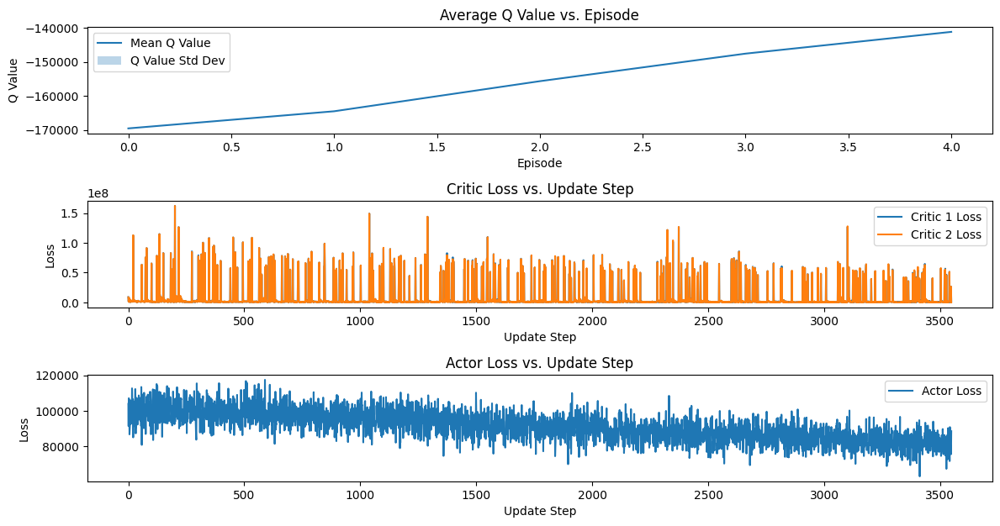

saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best mod

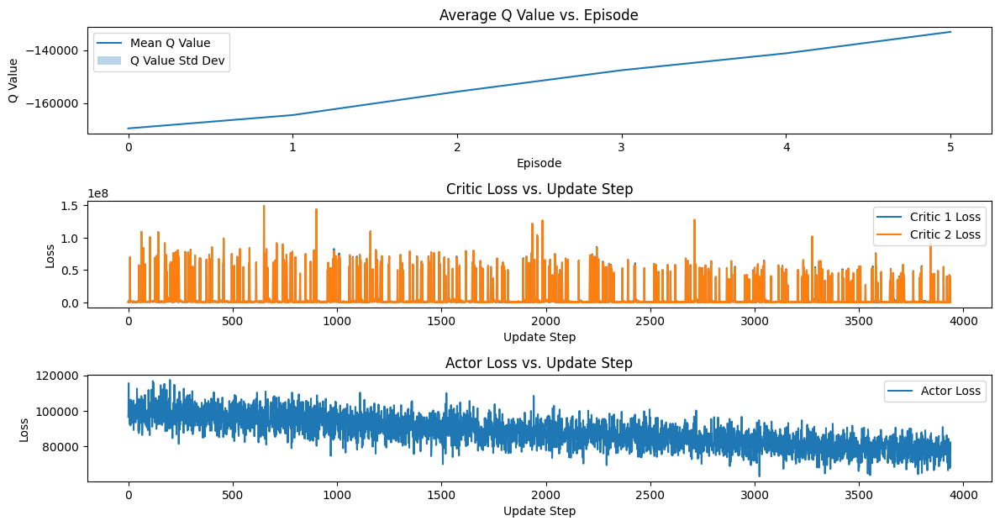

20230817
하루 예약자 수       :   42   total 예약자 수    :  4928 
하루 접속 고객 수     :   59   total 접속 고객 수  :  7940 
하루 예약자 비율      : 71.19  total 예약자 비율   : 62.07 
하루 수업 횟수       :   36   total 수업 횟수    :  4878 
하루 차량당 수업횟수    :  3.0   total 차량당 수업횟수 :  3.77 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   62   total 강화학습 거절 횟수:  7577 
하루 실행 시간       : 28.12  총 실행 시간        : 5256.14


20230818
하루 예약자 수       :   46   total 예약자 수    :  4974 
하루 접속 고객 수     :   66   total 접속 고객 수  :  8006 
하루 예약자 비율      :  69.7  total 예약자 비율   : 62.13 
하루 수업 횟수       :   46   total 수업 횟수    :  4924 
하루 차량당 수업횟수    :  3.83  total 차량당 수업횟수 :  3.77 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   46   total 강화학습 거절 횟수:  7623 
하루 실행 시간       :  38.3  총 실행 시간        : 5294.44


20230819
하루 예약자 수       :   39   total 예약자 수    :  5013 
하루 접속 고객 수     :   74   total 접속 고객 수  :  8080 
하루 예약자 비율      :  52.7  total 예약자 비율   : 62.04 
하루 수업 횟수       :   45   total 수업 횟수    :  4969 
하루 

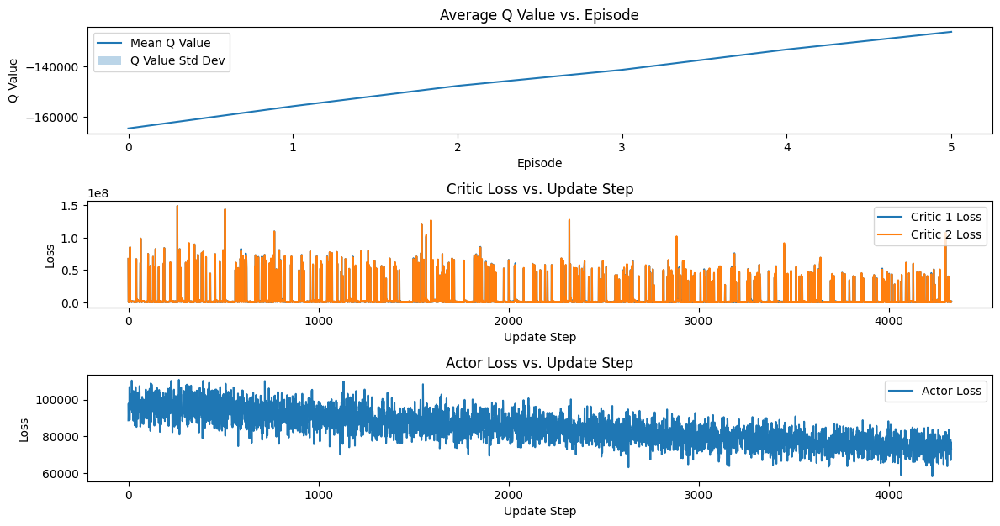

20230827
하루 예약자 수       :   35   total 예약자 수    :  5389 
하루 접속 고객 수     :   68   total 접속 고객 수  :  8732 
하루 예약자 비율      : 51.47  total 예약자 비율   : 61.72 
하루 수업 횟수       :   48   total 수업 횟수    :  5341 
하루 차량당 수업횟수    :  4.0   total 차량당 수업횟수 :  3.78 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   65   total 강화학습 거절 횟수:  8269 
하루 실행 시간       : 45.16  총 실행 시간        : 5728.92


20230828
하루 예약자 수       :   35   total 예약자 수    :  5424 
하루 접속 고객 수     :   64   total 접속 고객 수  :  8796 
하루 예약자 비율      : 54.69  total 예약자 비율   : 61.66 
하루 수업 횟수       :   41   total 수업 횟수    :  5382 
하루 차량당 수업횟수    :  3.42  total 차량당 수업횟수 :  3.77 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   60   total 강화학습 거절 횟수:  8329 
하루 실행 시간       : 42.88  총 실행 시간        : 5771.8


20230829
하루 예약자 수       :   41   total 예약자 수    :  5465 
하루 접속 고객 수     :   78   total 접속 고객 수  :  8874 
하루 예약자 비율      : 52.56  total 예약자 비율   : 61.58 
하루 수업 횟수       :   43   total 수업 횟수    :  5425 
하루 차

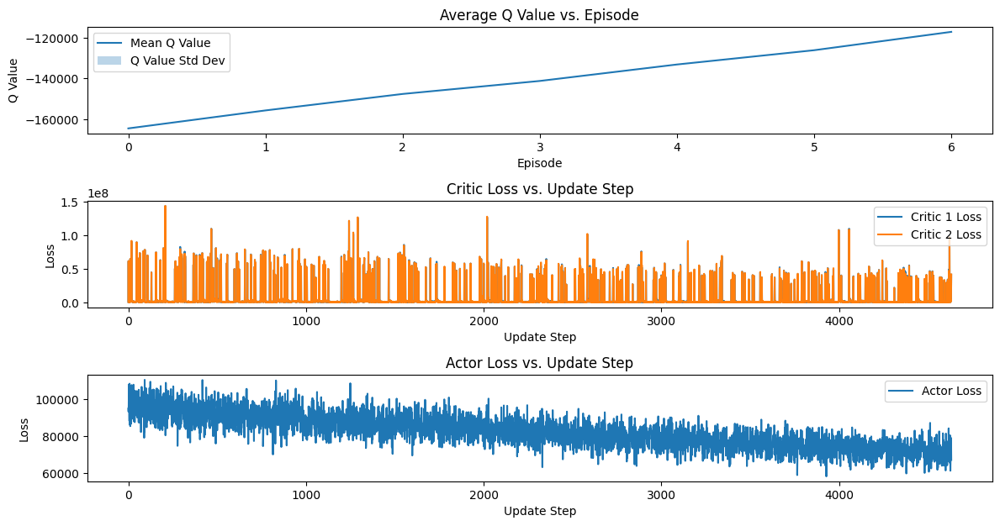

20230906
하루 예약자 수       :   31   total 예약자 수    :  5766 
하루 접속 고객 수     :   39   total 접속 고객 수  :  9306 
하루 예약자 비율      : 79.49  total 예약자 비율   : 61.96 
하루 수업 횟수       :   40   total 수업 횟수    :  5743 
하루 차량당 수업횟수    :  3.33  total 차량당 수업횟수 :  3.74 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   67   total 강화학습 거절 횟수:  8884 
하루 실행 시간       :  23.7  총 실행 시간        : 6064.46


20230907
하루 예약자 수       :   44   total 예약자 수    :  5810 
하루 접속 고객 수     :   57   total 접속 고객 수  :  9363 
하루 예약자 비율      : 77.19  total 예약자 비율   : 62.05 
하루 수업 횟수       :   41   total 수업 횟수    :  5784 
하루 차량당 수업횟수    :  3.42  total 차량당 수업횟수 :  3.74 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   93   total 강화학습 거절 횟수:  8977 
하루 실행 시간       : 34.35  총 실행 시간        : 6098.81


20230908
하루 예약자 수       :   45   total 예약자 수    :  5855 
하루 접속 고객 수     :   59   total 접속 고객 수  :  9422 
하루 예약자 비율      : 76.27  total 예약자 비율   : 62.14 
하루 수업 횟수       :   45   total 수업 횟수    :  5829 
하루 

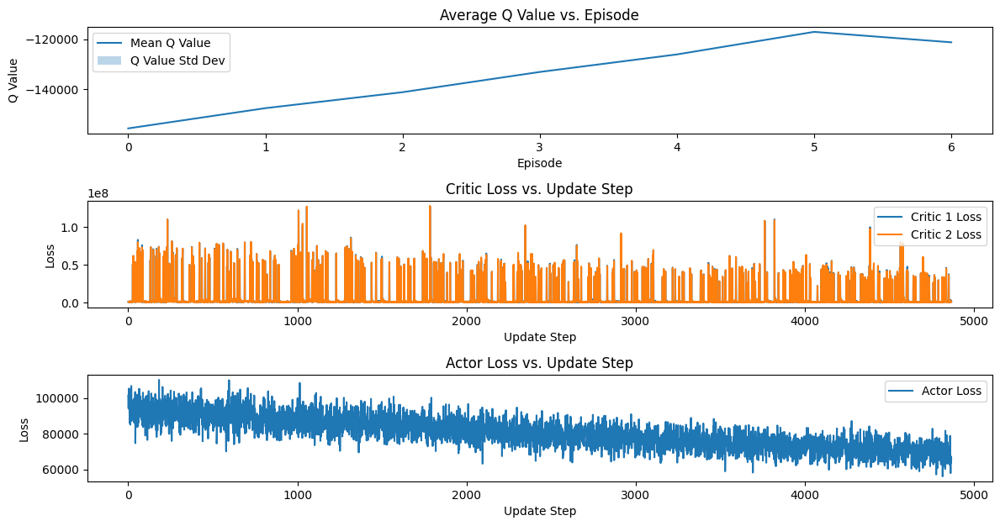

20230916
하루 예약자 수       :   37   total 예약자 수    :  6133 
하루 접속 고객 수     :   51   total 접속 고객 수  :  9788 
하루 예약자 비율      : 72.55  total 예약자 비율   : 62.66 
하루 수업 횟수       :   34   total 수업 횟수    :  6097 
하루 차량당 수업횟수    :  2.83  total 차량당 수업횟수 :  3.7  
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   78   total 강화학습 거절 횟수:  9605 
하루 실행 시간       : 25.42  총 실행 시간        : 6331.66


20230917
하루 예약자 수       :   43   total 예약자 수    :  6176 
하루 접속 고객 수     :   60   total 접속 고객 수  :  9848 
하루 예약자 비율      : 71.67  total 예약자 비율   : 62.71 
하루 수업 횟수       :   39   total 수업 횟수    :  6136 
하루 차량당 수업횟수    :  3.25  total 차량당 수업횟수 :  3.7  
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   77   total 강화학습 거절 횟수:  9682 
하루 실행 시간       : 37.33  총 실행 시간        : 6368.99


20230918
하루 예약자 수       :   28   total 예약자 수    :  6204 
하루 접속 고객 수     :   34   total 접속 고객 수  :  9882 
하루 예약자 비율      : 82.35  total 예약자 비율   : 62.78 
하루 수업 횟수       :   36   total 수업 횟수    :  6172 
하루 

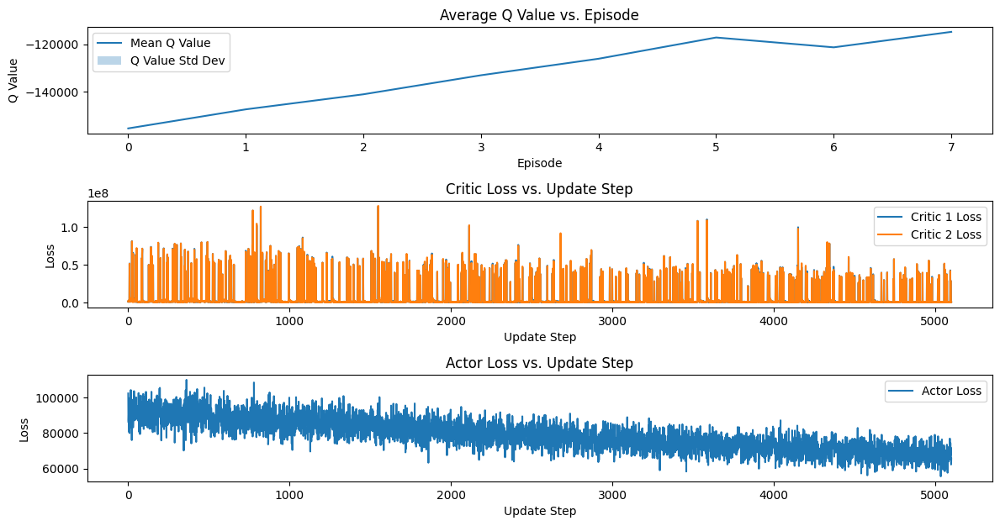

20230926
하루 예약자 수       :   38   total 예약자 수    :  6489 
하루 접속 고객 수     :   48   total 접속 고객 수  : 10254 
하루 예약자 비율      : 79.17  total 예약자 비율   : 63.28 
하루 수업 횟수       :   41   total 수업 횟수    :  6457 
하루 차량당 수업횟수    :  3.42  total 차량당 수업횟수 :  3.66 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   75   total 강화학습 거절 횟수: 10251 
하루 실행 시간       : 31.95  총 실행 시간        : 6594.86


20230927
하루 예약자 수       :   32   total 예약자 수    :  6521 
하루 접속 고객 수     :   39   total 접속 고객 수  : 10293 
하루 예약자 비율      : 82.05  total 예약자 비율   : 63.35 
하루 수업 횟수       :   29   total 수업 횟수    :  6486 
하루 차량당 수업횟수    :  2.42  total 차량당 수업횟수 :  3.65 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   66   total 강화학습 거절 횟수: 10317 
하루 실행 시간       :  20.4  총 실행 시간        : 6615.26


20230928
하루 예약자 수       :   40   total 예약자 수    :  6561 
하루 접속 고객 수     :   62   total 접속 고객 수  : 10355 
하루 예약자 비율      : 64.52  total 예약자 비율   : 63.36 
하루 수업 횟수       :   33   total 수업 횟수    :  6519 
하루 

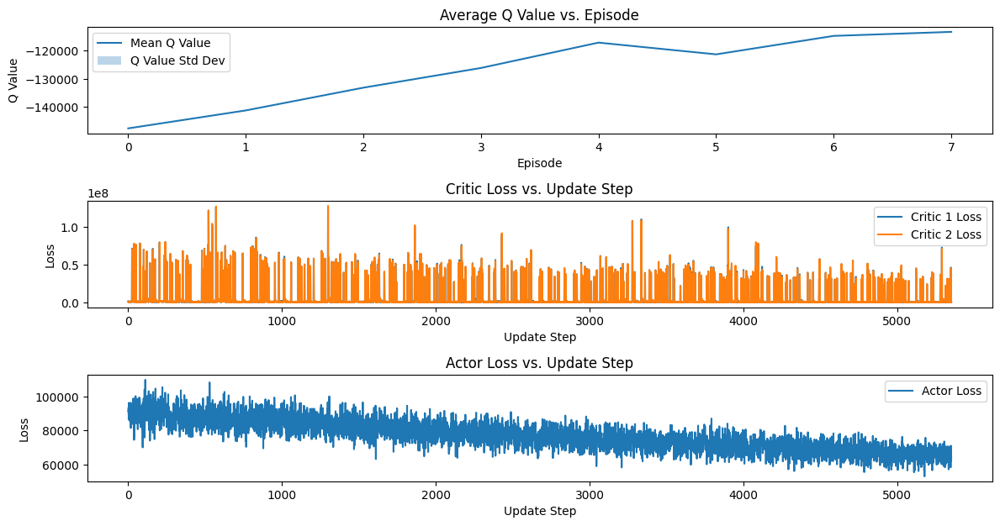

20231006
하루 예약자 수       :   32   total 예약자 수    :  6859 
하루 접속 고객 수     :   45   total 접속 고객 수  : 10752 
하루 예약자 비율      : 71.11  total 예약자 비율   : 63.79 
하루 수업 횟수       :   44   total 수업 횟수    :  6831 
하루 차량당 수업횟수    :  3.67  total 차량당 수업횟수 :  3.63 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   62   total 강화학습 거절 횟수: 10922 
하루 실행 시간       : 34.99  총 실행 시간        : 6876.16


20231007
하루 예약자 수       :   38   total 예약자 수    :  6897 
하루 접속 고객 수     :   49   total 접속 고객 수  : 10801 
하루 예약자 비율      : 77.55  total 예약자 비율   : 63.86 
하루 수업 횟수       :   36   total 수업 횟수    :  6867 
하루 차량당 수업횟수    :  3.0   total 차량당 수업횟수 :  3.63 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   69   total 강화학습 거절 횟수: 10991 
하루 실행 시간       : 25.89  총 실행 시간        : 6902.04


20231008
하루 예약자 수       :   42   total 예약자 수    :  6939 
하루 접속 고객 수     :   49   total 접속 고객 수  : 10850 
하루 예약자 비율      : 85.71  total 예약자 비율   : 63.95 
하루 수업 횟수       :   40   total 수업 횟수    :  6907 
하루 

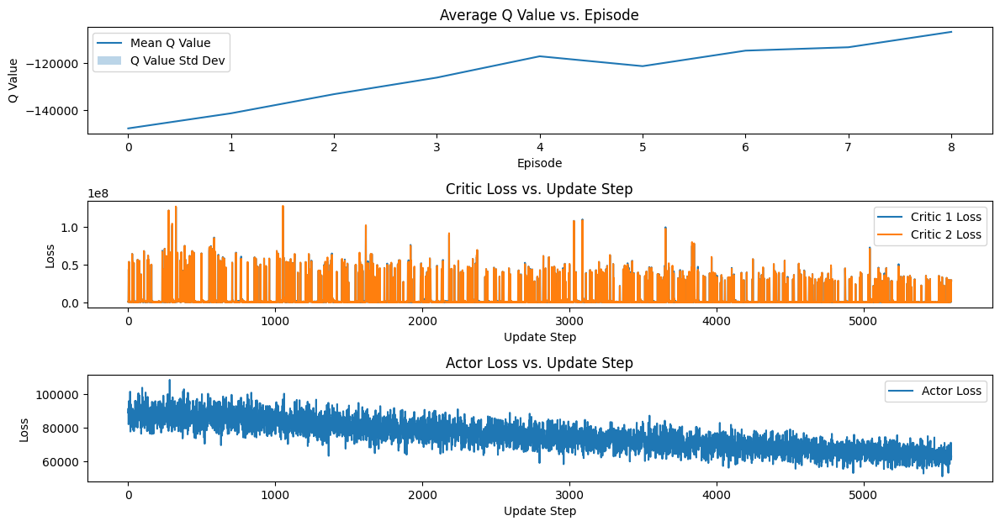

20231016
하루 예약자 수       :   49   total 예약자 수    :  7279 
하루 접속 고객 수     :   57   total 접속 고객 수  : 11257 
하루 예약자 비율      : 85.96  total 예약자 비율   : 64.66 
하루 수업 횟수       :   50   total 수업 횟수    :  7241 
하루 차량당 수업횟수    :  4.17  total 차량당 수업횟수 :  3.62 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   57   total 강화학습 거절 횟수: 11626 
하루 실행 시간       : 49.04  총 실행 시간        : 7176.62


20231017
하루 예약자 수       :   29   total 예약자 수    :  7308 
하루 접속 고객 수     :   42   total 접속 고객 수  : 11299 
하루 예약자 비율      : 69.05  total 예약자 비율   : 64.68 
하루 수업 횟수       :   29   total 수업 횟수    :  7270 
하루 차량당 수업횟수    :  2.42  total 차량당 수업횟수 :  3.61 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   67   total 강화학습 거절 횟수: 11693 
하루 실행 시간       : 21.23  총 실행 시간        : 7197.85


20231018
하루 예약자 수       :   48   total 예약자 수    :  7356 
하루 접속 고객 수     :   62   total 접속 고객 수  : 11361 
하루 예약자 비율      : 77.42  total 예약자 비율   : 64.75 
하루 수업 횟수       :   44   total 수업 횟수    :  7314 
하루 

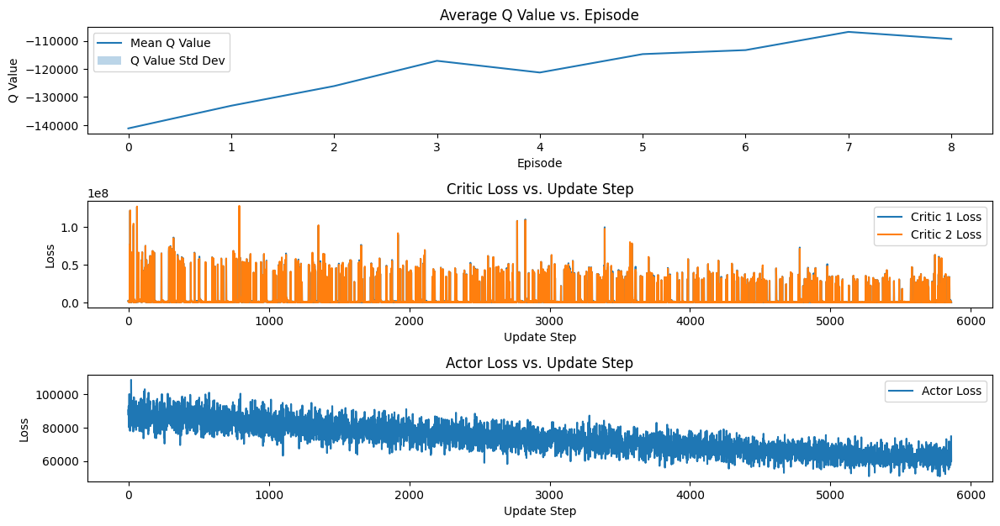

20231026
하루 예약자 수       :   43   total 예약자 수    :  7679 
하루 접속 고객 수     :   55   total 접속 고객 수  : 11780 
하루 예약자 비율      : 78.18  total 예약자 비율   : 65.19 
하루 수업 횟수       :   41   total 수업 횟수    :  7633 
하루 차량당 수업횟수    :  3.73  total 차량당 수업횟수 :  3.6  
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   93   total 강화학습 거절 횟수: 12394 
하루 실행 시간       : 31.58  총 실행 시간        : 7496.96


20231027
하루 예약자 수       :   44   total 예약자 수    :  7723 
하루 접속 고객 수     :   60   total 접속 고객 수  : 11840 
하루 예약자 비율      : 73.33  total 예약자 비율   : 65.23 
하루 수업 횟수       :   47   total 수업 횟수    :  7680 
하루 차량당 수업횟수    :  3.92  total 차량당 수업횟수 :  3.6  
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   80   total 강화학습 거절 횟수: 12474 
하루 실행 시간       : 41.33  총 실행 시간        : 7538.28


20231028
하루 예약자 수       :   32   total 예약자 수    :  7755 
하루 접속 고객 수     :   43   total 접속 고객 수  : 11883 
하루 예약자 비율      : 74.42  total 예약자 비율   : 65.26 
하루 수업 횟수       :   44   total 수업 횟수    :  7724 
하루 

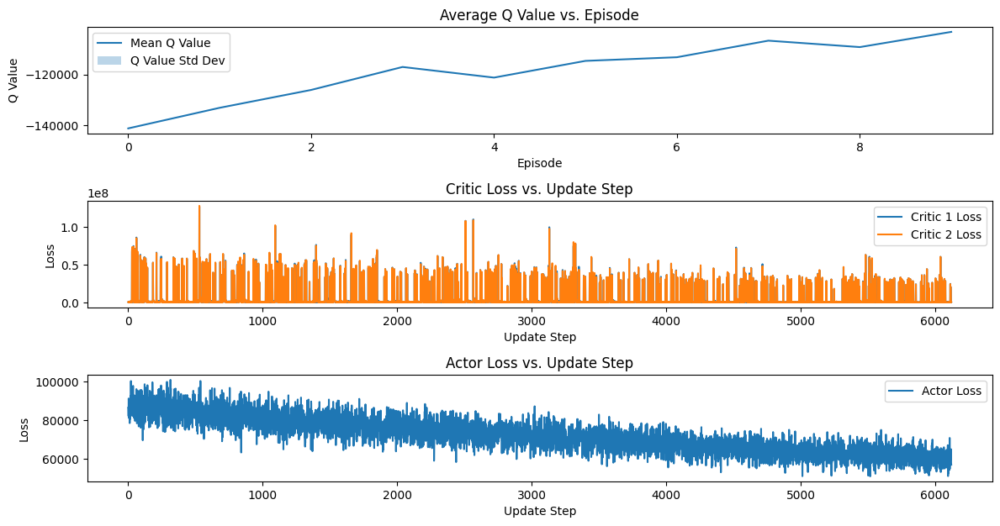

20231105
하루 예약자 수       :   40   total 예약자 수    :  8083 
하루 접속 고객 수     :   49   total 접속 고객 수  : 12295 
하루 예약자 비율      : 81.63  total 예약자 비율   : 65.74 
하루 수업 횟수       :   43   total 수업 횟수    :  8044 
하루 차량당 수업횟수    :  3.58  total 차량당 수업횟수 :  3.59 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   71   total 강화학습 거절 횟수: 13093 
하루 실행 시간       :  37.7  총 실행 시간        : 7807.48


20231106
하루 예약자 수       :   47   total 예약자 수    :  8130 
하루 접속 고객 수     :   57   total 접속 고객 수  : 12352 
하루 예약자 비율      : 82.46  total 예약자 비율   : 65.82 
하루 수업 횟수       :   40   total 수업 횟수    :  8084 
하루 차량당 수업횟수    :  3.33  total 차량당 수업횟수 :  3.59 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   87   total 강화학습 거절 횟수: 13180 
하루 실행 시간       : 38.31  총 실행 시간        : 7845.79


20231107
하루 예약자 수       :   44   total 예약자 수    :  8174 
하루 접속 고객 수     :   53   total 접속 고객 수  : 12405 
하루 예약자 비율      : 83.02  total 예약자 비율   : 65.89 
하루 수업 횟수       :   39   total 수업 횟수    :  8123 
하루 

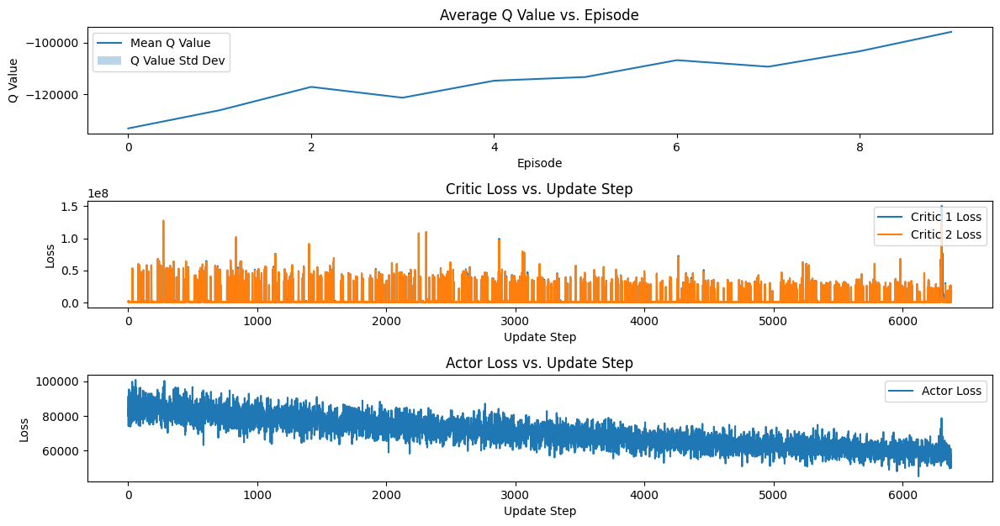

20231115
하루 예약자 수       :   43   total 예약자 수    :  8479 
하루 접속 고객 수     :   58   total 접속 고객 수  : 12818 
하루 예약자 비율      : 74.14  total 예약자 비율   : 66.15 
하루 수업 횟수       :   43   total 수업 횟수    :  8431 
하루 차량당 수업횟수    :  3.58  total 차량당 수업횟수 :  3.58 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   71   total 강화학습 거절 횟수: 13758 
하루 실행 시간       : 41.55  총 실행 시간        : 8114.61


20231116
하루 예약자 수       :   36   total 예약자 수    :  8515 
하루 접속 고객 수     :   50   total 접속 고객 수  : 12868 
하루 예약자 비율      :  72.0  total 예약자 비율   : 66.17 
하루 수업 횟수       :   34   total 수업 횟수    :  8465 
하루 차량당 수업횟수    :  2.83  total 차량당 수업횟수 :  3.57 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   78   total 강화학습 거절 횟수: 13836 
하루 실행 시간       : 24.32  총 실행 시간        : 8138.93


20231117
하루 예약자 수       :   41   total 예약자 수    :  8556 
하루 접속 고객 수     :   53   total 접속 고객 수  : 12921 
하루 예약자 비율      : 77.36  total 예약자 비율   : 66.22 
하루 수업 횟수       :   36   total 수업 횟수    :  8501 
하루 

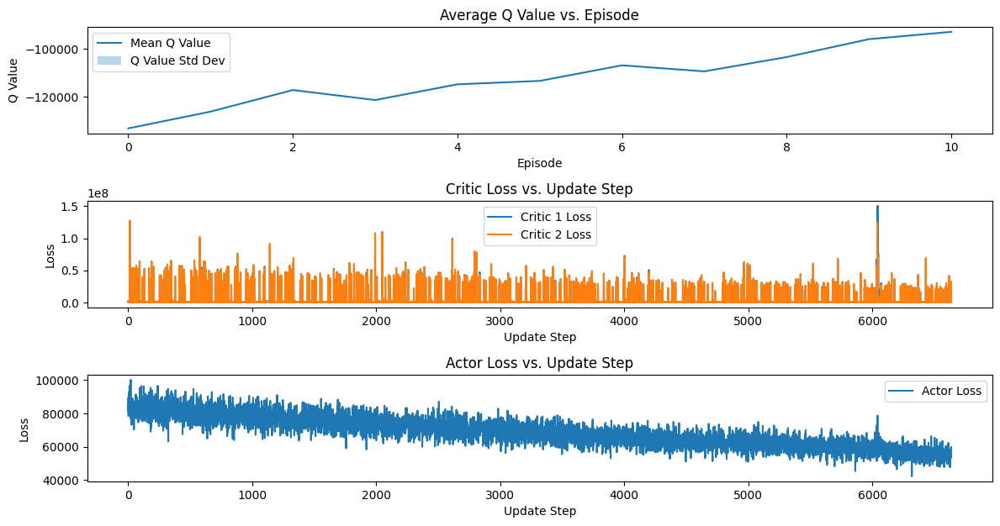

20231125
하루 예약자 수       :   38   total 예약자 수    :  8860 
하루 접속 고객 수     :   48   total 접속 고객 수  : 13328 
하루 예약자 비율      : 79.17  total 예약자 비율   : 66.48 
하루 수업 횟수       :   40   total 수업 횟수    :  8811 
하루 차량당 수업횟수    :  3.33  total 차량당 수업횟수 :  3.56 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   51   total 강화학습 거절 횟수: 14472 
하루 실행 시간       :  32.8  총 실행 시간        : 8390.96


20231126
하루 예약자 수       :   39   total 예약자 수    :  8899 
하루 접속 고객 수     :   55   total 접속 고객 수  : 13383 
하루 예약자 비율      : 70.91  total 예약자 비율   : 66.49 
하루 수업 횟수       :   42   total 수업 횟수    :  8853 
하루 차량당 수업횟수    :  3.5   total 차량당 수업횟수 :  3.56 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   71   total 강화학습 거절 횟수: 14543 
하루 실행 시간       : 32.42  총 실행 시간        : 8423.37


20231127
하루 예약자 수       :   36   total 예약자 수    :  8935 
하루 접속 고객 수     :   52   total 접속 고객 수  : 13435 
하루 예약자 비율      : 69.23  total 예약자 비율   : 66.51 
하루 수업 횟수       :   39   total 수업 횟수    :  8892 
하루 

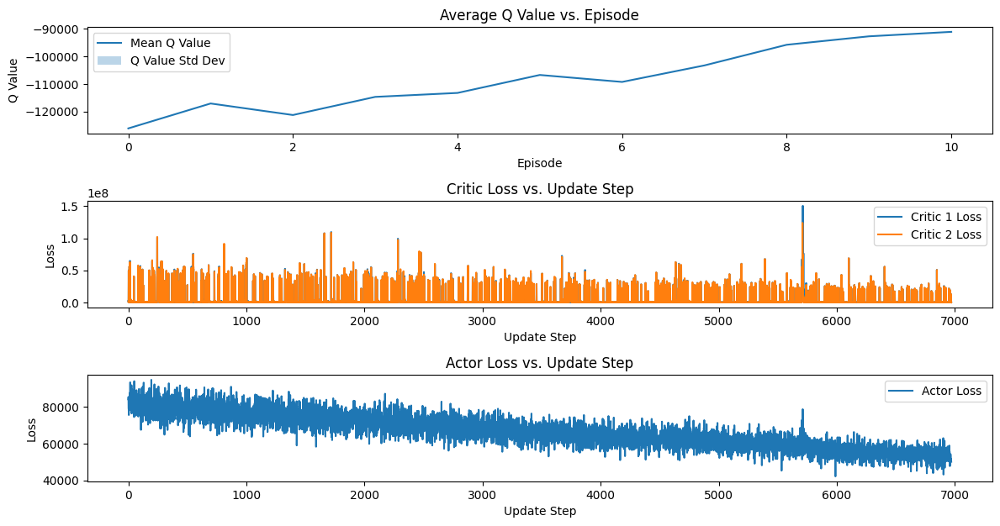

20231205
하루 예약자 수       :   31   total 예약자 수    :  9305 
하루 접속 고객 수     :   78   total 접속 고객 수  : 14021 
하루 예약자 비율      : 39.74  total 예약자 비율   : 66.36 
하루 수업 횟수       :   48   total 수업 횟수    :  9245 
하루 차량당 수업횟수    :  4.0   total 차량당 수업횟수 :  3.56 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   59   total 강화학습 거절 횟수: 15265 
하루 실행 시간       : 53.94  총 실행 시간        : 8818.19


20231206
하루 예약자 수       :   48   total 예약자 수    :  9353 
하루 접속 고객 수     :   84   total 접속 고객 수  : 14105 
하루 예약자 비율      : 57.14  total 예약자 비율   : 66.31 
하루 수업 횟수       :   35   total 수업 횟수    :  9280 
하루 차량당 수업횟수    :  2.92  total 차량당 수업횟수 :  3.56 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :  104   total 강화학습 거절 횟수: 15369 
하루 실행 시간       :  41.1  총 실행 시간        : 8859.29


20231207
하루 예약자 수       :   58   total 예약자 수    :  9411 
하루 접속 고객 수     :   79   total 접속 고객 수  : 14184 
하루 예약자 비율      : 73.42  total 예약자 비율   : 66.35 
하루 수업 횟수       :   54   total 수업 횟수    :  9334 
하루 

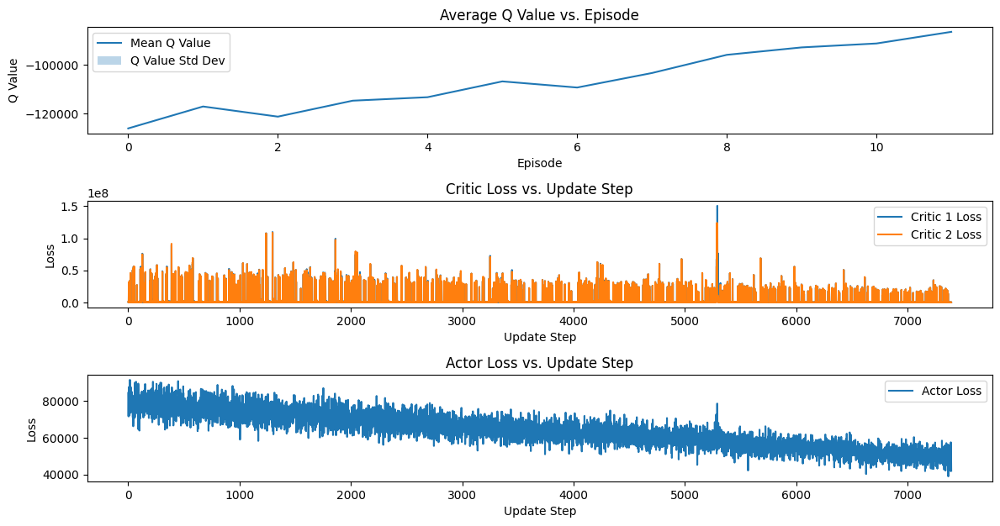

20231215
하루 예약자 수       :   36   total 예약자 수    :  9776 
하루 접속 고객 수     :   81   total 접속 고객 수  : 14868 
하루 예약자 비율      : 44.44  total 예약자 비율   : 65.75 
하루 수업 횟수       :   47   total 수업 횟수    :  9715 
하루 차량당 수업횟수    :  3.92  total 차량당 수업횟수 :  3.58 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   77   total 강화학습 거절 횟수: 16130 
하루 실행 시간       : 44.65  총 실행 시간        : 9361.58


20231216
하루 예약자 수       :   51   total 예약자 수    :  9827 
하루 접속 고객 수     :   90   total 접속 고객 수  : 14958 
하루 예약자 비율      : 56.67  total 예약자 비율   :  65.7 
하루 수업 횟수       :   44   total 수업 횟수    :  9759 
하루 차량당 수업횟수    :  3.67  total 차량당 수업횟수 :  3.58 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :  100   total 강화학습 거절 횟수: 16230 
하루 실행 시간       : 54.53  총 실행 시간        : 9416.12


20231217
하루 예약자 수       :   52   total 예약자 수    :  9879 
하루 접속 고객 수     :   89   total 접속 고객 수  : 15047 
하루 예약자 비율      : 58.43  total 예약자 비율   : 65.65 
하루 수업 횟수       :   52   total 수업 횟수    :  9811 
하루 

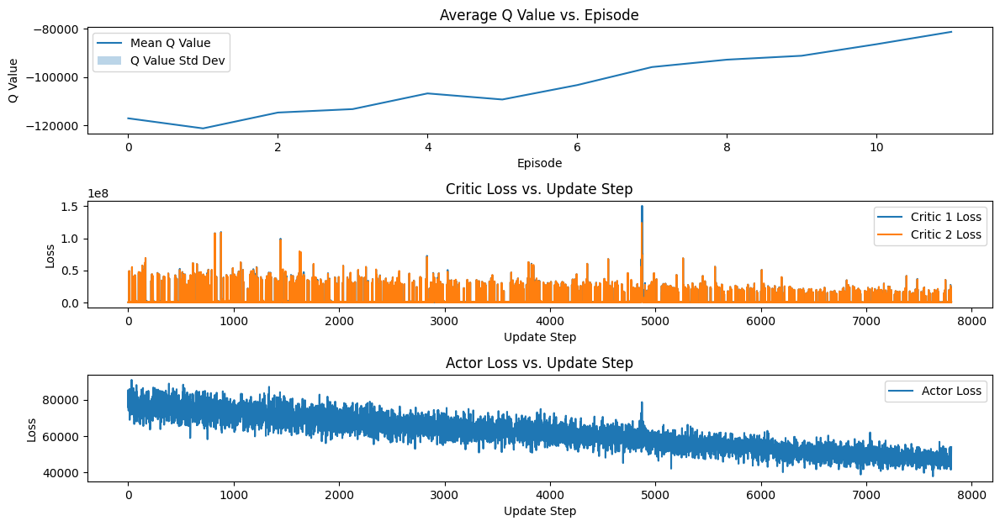

20231225
하루 예약자 수       :   36   total 예약자 수    : 10248 
하루 접속 고객 수     :   65   total 접속 고객 수  : 15684 
하루 예약자 비율      : 55.38  total 예약자 비율   : 65.34 
하루 수업 횟수       :   47   total 수업 횟수    : 10177 
하루 차량당 수업횟수    :  3.92  total 차량당 수업횟수 :  3.59 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   72   total 강화학습 거절 횟수: 17018 
하루 실행 시간       : 42.57  총 실행 시간        : 9850.72


20231226
하루 예약자 수       :   50   total 예약자 수    : 10298 
하루 접속 고객 수     :   80   total 접속 고객 수  : 15764 
하루 예약자 비율      :  62.5  total 예약자 비율   : 65.33 
하루 수업 횟수       :   43   total 수업 횟수    : 10220 
하루 차량당 수업횟수    :  3.58  total 차량당 수업횟수 :  3.59 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   71   total 강화학습 거절 횟수: 17089 
하루 실행 시간       : 46.88  총 실행 시간        : 9897.6


20231227
하루 예약자 수       :   32   total 예약자 수    : 10330 
하루 접속 고객 수     :   72   total 접속 고객 수  : 15836 
하루 예약자 비율      : 44.44  total 예약자 비율   : 65.23 
하루 수업 횟수       :   38   total 수업 횟수    : 10258 
하루 차

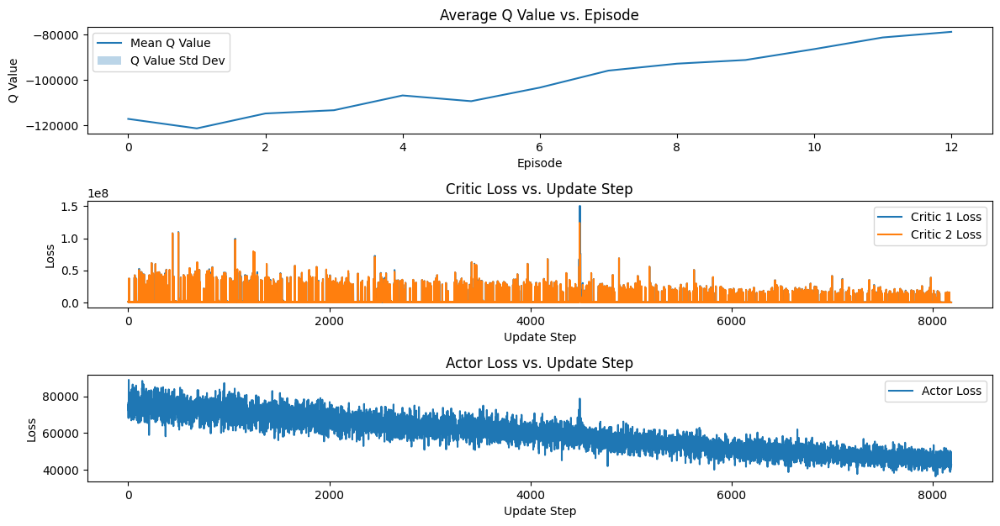

20240104
하루 예약자 수       :   54   total 예약자 수    : 10708 
하루 접속 고객 수     :   83   total 접속 고객 수  : 16463 
하루 예약자 비율      : 65.06  total 예약자 비율   : 65.04 
하루 수업 횟수       :   53   total 수업 횟수    : 10649 
하루 차량당 수업횟수    :  4.42  total 차량당 수업횟수 :  3.6  
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   91   total 강화학습 거절 횟수: 17869 
하루 실행 시간       : 67.05  총 실행 시간        : 10346.02


20240105
하루 예약자 수       :   34   total 예약자 수    : 10742 
하루 접속 고객 수     :   67   total 접속 고객 수  : 16530 
하루 예약자 비율      : 50.75  total 예약자 비율   : 64.98 
하루 수업 횟수       :   31   total 수업 횟수    : 10680 
하루 차량당 수업횟수    :  2.58  total 차량당 수업횟수 :  3.6  
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   62   total 강화학습 거절 횟수: 17931 
하루 실행 시간       : 31.25  총 실행 시간        : 10377.27


20240106
하루 예약자 수       :   52   total 예약자 수    : 10794 
하루 접속 고객 수     :   77   total 접속 고객 수  : 16607 
하루 예약자 비율      : 67.53  total 예약자 비율   :  65.0 
하루 수업 횟수       :   50   total 수업 횟수    : 10730 
하

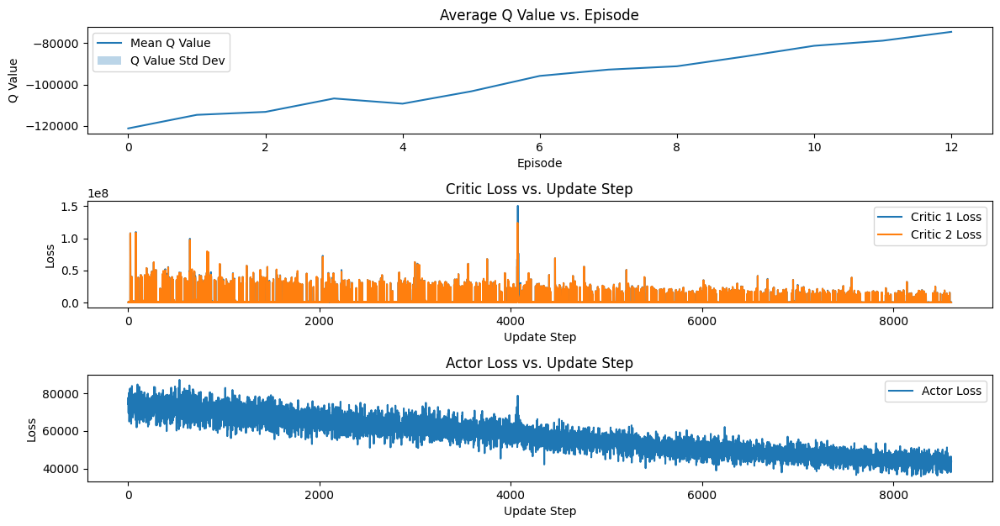

20240114
하루 예약자 수       :   48   total 예약자 수    : 11187 
하루 접속 고객 수     :   84   total 접속 고객 수  : 17302 
하루 예약자 비율      : 57.14  total 예약자 비율   : 64.66 
하루 수업 횟수       :   44   total 수업 횟수    : 11099 
하루 차량당 수업횟수    :  3.67  total 차량당 수업횟수 :  3.61 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   77   total 강화학습 거절 횟수: 18773 
하루 실행 시간       :  58.7  총 실행 시간        : 10880.07


20240115
하루 예약자 수       :   54   total 예약자 수    : 11241 
하루 접속 고객 수     :   93   total 접속 고객 수  : 17395 
하루 예약자 비율      : 58.06  total 예약자 비율   : 64.62 
하루 수업 횟수       :   51   total 수업 횟수    : 11150 
하루 차량당 수업횟수    :  4.25  total 차량당 수업횟수 :  3.61 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   95   total 강화학습 거절 횟수: 18868 
하루 실행 시간       : 72.15  총 실행 시간        : 10952.22


20240116
하루 예약자 수       :   46   total 예약자 수    : 11287 
하루 접속 고객 수     :   91   total 접속 고객 수  : 17486 
하루 예약자 비율      : 50.55  total 예약자 비율   : 64.55 
하루 수업 횟수       :   54   total 수업 횟수    : 11204 
하

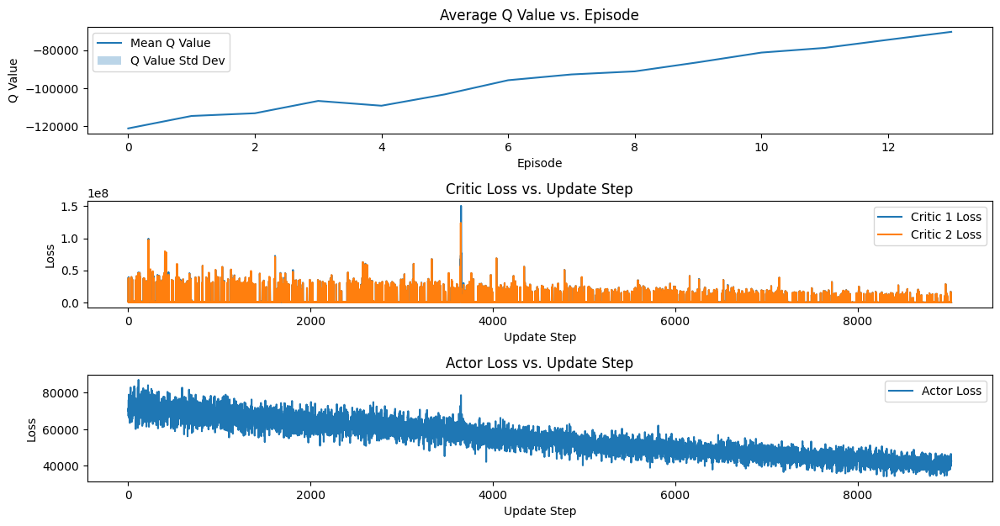

20240124
하루 예약자 수       :   54   total 예약자 수    : 11666 
하루 접속 고객 수     :   75   total 접속 고객 수  : 18139 
하루 예약자 비율      :  72.0  total 예약자 비율   : 64.31 
하루 수업 횟수       :   46   total 수업 횟수    : 11576 
하루 차량당 수업횟수    :  3.83  total 차량당 수업횟수 :  3.62 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   82   total 강화학습 거절 횟수: 19541 
하루 실행 시간       : 45.91  총 실행 시간        : 11454.45


20240125
하루 예약자 수       :   31   total 예약자 수    : 11697 
하루 접속 고객 수     :   72   total 접속 고객 수  : 18211 
하루 예약자 비율      : 43.06  total 예약자 비율   : 64.23 
하루 수업 횟수       :   52   total 수업 횟수    : 11628 
하루 차량당 수업횟수    :  4.33  total 차량당 수업횟수 :  3.63 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   63   total 강화학습 거절 횟수: 19604 
하루 실행 시간       : 53.29  총 실행 시간        : 11507.74


20240126
하루 예약자 수       :   54   total 예약자 수    : 11751 
하루 접속 고객 수     :   88   total 접속 고객 수  : 18299 
하루 예약자 비율      : 61.36  total 예약자 비율   : 64.22 
하루 수업 횟수       :   42   total 수업 횟수    : 11670 
하

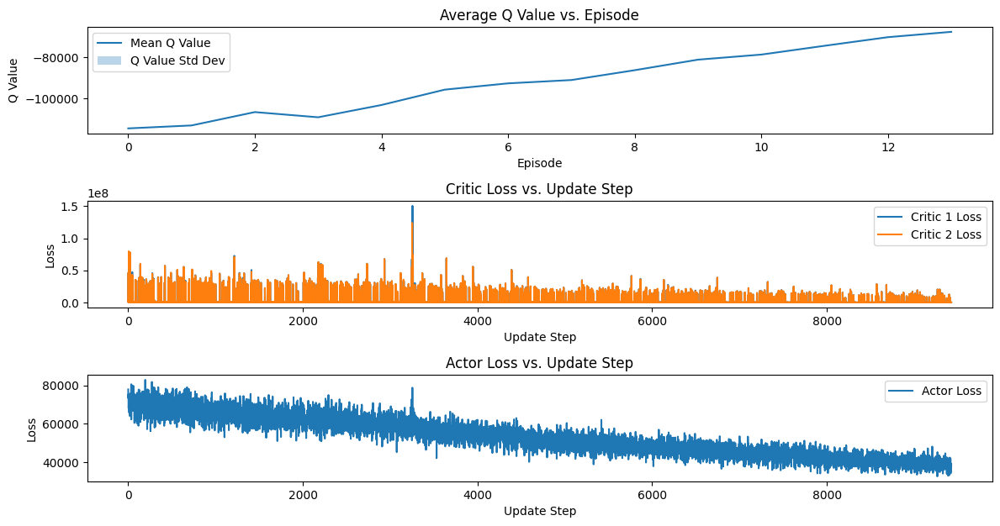

20240203
하루 예약자 수       :   56   total 예약자 수    : 12142 
하루 접속 고객 수     :   96   total 접속 고객 수  : 18952 
하루 예약자 비율      : 58.33  total 예약자 비율   : 64.07 
하루 수업 횟수       :   53   total 수업 횟수    : 12058 
하루 차량당 수업횟수    :  4.42  total 차량당 수업횟수 :  3.64 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :  108   total 강화학습 거절 횟수: 20406 
하루 실행 시간       : 81.82  총 실행 시간        : 11970.57


20240204
하루 예약자 수       :   33   total 예약자 수    : 12175 
하루 접속 고객 수     :   70   total 접속 고객 수  : 19022 
하루 예약자 비율      : 47.14  total 예약자 비율   :  64.0 
하루 수업 횟수       :   39   total 수업 횟수    : 12097 
하루 차량당 수업횟수    :  3.25  total 차량당 수업횟수 :  3.64 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   59   total 강화학습 거절 횟수: 20465 
하루 실행 시간       : 35.32  총 실행 시간        : 12005.89


20240205
하루 예약자 수       :   51   total 예약자 수    : 12226 
하루 접속 고객 수     :   83   total 접속 고객 수  : 19105 
하루 예약자 비율      : 61.45  total 예약자 비율   : 63.99 
하루 수업 횟수       :   45   total 수업 횟수    : 12142 
하

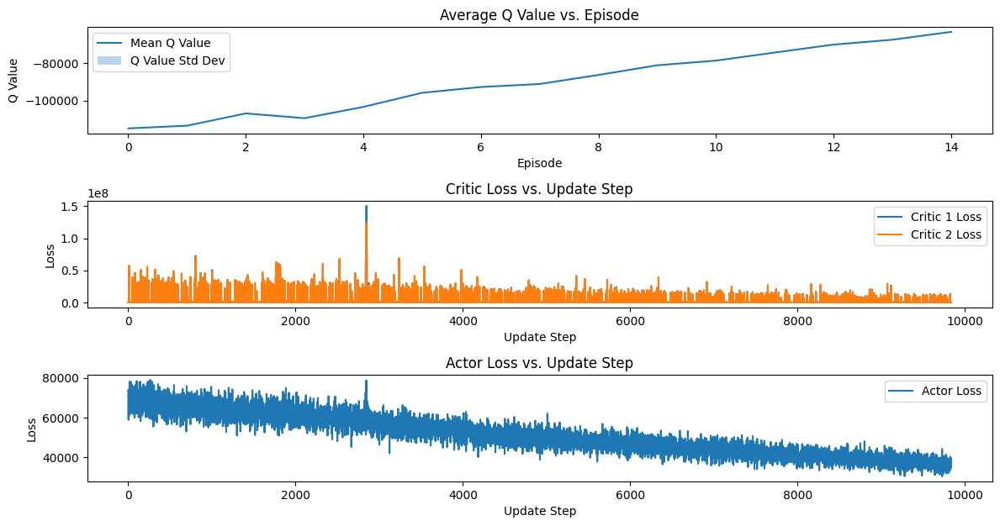

20240213
하루 예약자 수       :   51   total 예약자 수    : 12612 
하루 접속 고객 수     :   89   total 접속 고객 수  : 19764 
하루 예약자 비율      :  57.3  total 예약자 비율   : 63.81 
하루 수업 횟수       :   47   total 수업 횟수    : 12553 
하루 차량당 수업횟수    :  3.92  total 차량당 수업횟수 :  3.66 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   94   total 강화학습 거절 횟수: 21208 
하루 실행 시간       : 55.18  총 실행 시간        : 12530.49


20240214
하루 예약자 수       :   43   total 예약자 수    : 12655 
하루 접속 고객 수     :   70   total 접속 고객 수  : 19834 
하루 예약자 비율      : 61.43  total 예약자 비율   :  63.8 
하루 수업 횟수       :   40   total 수업 횟수    : 12593 
하루 차량당 수업횟수    :  3.33  total 차량당 수업횟수 :  3.65 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :  106   total 강화학습 거절 횟수: 21314 
하루 실행 시간       : 38.99  총 실행 시간        : 12569.47


20240215
하루 예약자 수       :   47   total 예약자 수    : 12702 
하루 접속 고객 수     :   72   total 접속 고객 수  : 19906 
하루 예약자 비율      : 65.28  total 예약자 비율   : 63.81 
하루 수업 횟수       :   59   total 수업 횟수    : 12652 
하

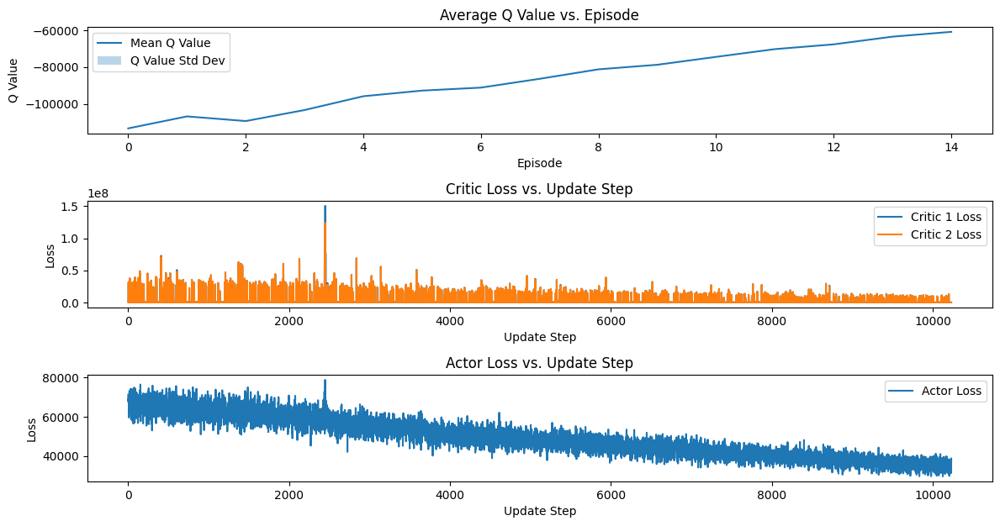

20240223
하루 예약자 수       :   57   total 예약자 수    : 13101 
하루 접속 고객 수     :   84   total 접속 고객 수  : 20553 
하루 예약자 비율      : 67.86  total 예약자 비율   : 63.74 
하루 수업 횟수       :   52   total 수업 횟수    : 13046 
하루 차량당 수업횟수    :  4.33  total 차량당 수업횟수 :  3.67 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :  102   total 강화학습 거절 횟수: 22180 
하루 실행 시간       : 58.78  총 실행 시간        : 13081.85


20240224
하루 예약자 수       :   42   total 예약자 수    : 13143 
하루 접속 고객 수     :   78   total 접속 고객 수  : 20631 
하루 예약자 비율      : 53.85  total 예약자 비율   : 63.71 
하루 수업 횟수       :   44   total 수업 횟수    : 13090 
하루 차량당 수업횟수    :  3.67  total 차량당 수업횟수 :  3.67 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   88   total 강화학습 거절 횟수: 22268 
하루 실행 시간       : 44.01  총 실행 시간        : 13125.86


20240225
하루 예약자 수       :   46   total 예약자 수    : 13189 
하루 접속 고객 수     :   91   total 접속 고객 수  : 20722 
하루 예약자 비율      : 50.55  total 예약자 비율   : 63.65 
하루 수업 횟수       :   39   total 수업 횟수    : 13129 
하

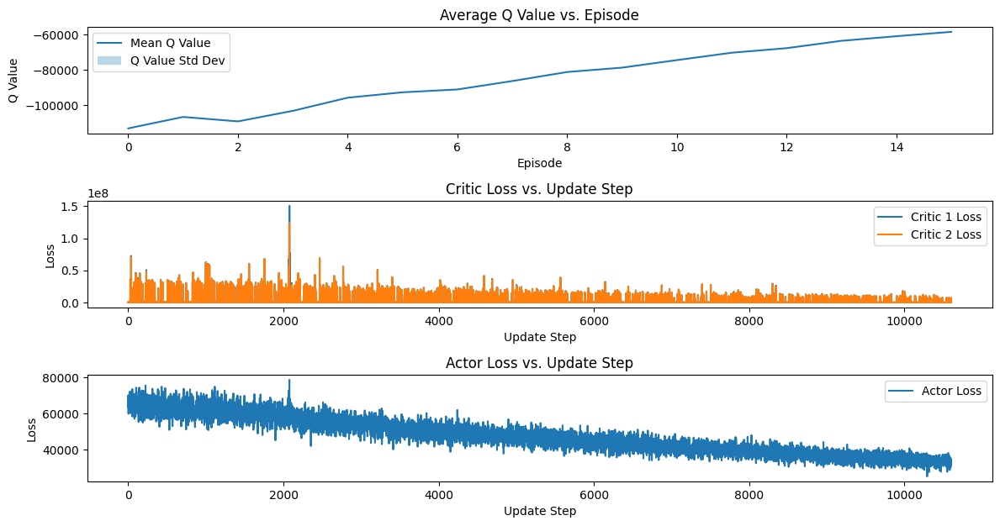

20240304
하루 예약자 수       :   48   total 예약자 수    : 13530 
하루 접속 고객 수     :   57   total 접속 고객 수  : 21269 
하루 예약자 비율      : 84.21  total 예약자 비율   : 63.61 
하루 수업 횟수       :   43   total 수업 횟수    : 13491 
하루 차량당 수업횟수    :  3.91  total 차량당 수업횟수 :  3.68 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :  100   total 강화학습 거절 횟수: 23034 
하루 실행 시간       : 26.86  총 실행 시간        : 13534.76


20240305
하루 예약자 수       :   30   total 예약자 수    : 13560 
하루 접속 고객 수     :   41   total 접속 고객 수  : 21310 
하루 예약자 비율      : 73.17  total 예약자 비율   : 63.63 
하루 수업 횟수       :   38   total 수업 횟수    : 13529 
하루 차량당 수업횟수    :  3.17  total 차량당 수업횟수 :  3.67 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   69   total 강화학습 거절 횟수: 23103 
하루 실행 시간       : 25.12  총 실행 시간        : 13559.88


20240306
하루 예약자 수       :   33   total 예약자 수    : 13593 
하루 접속 고객 수     :   40   total 접속 고객 수  : 21350 
하루 예약자 비율      :  82.5  total 예약자 비율   : 63.67 
하루 수업 횟수       :   29   total 수업 횟수    : 13558 
하

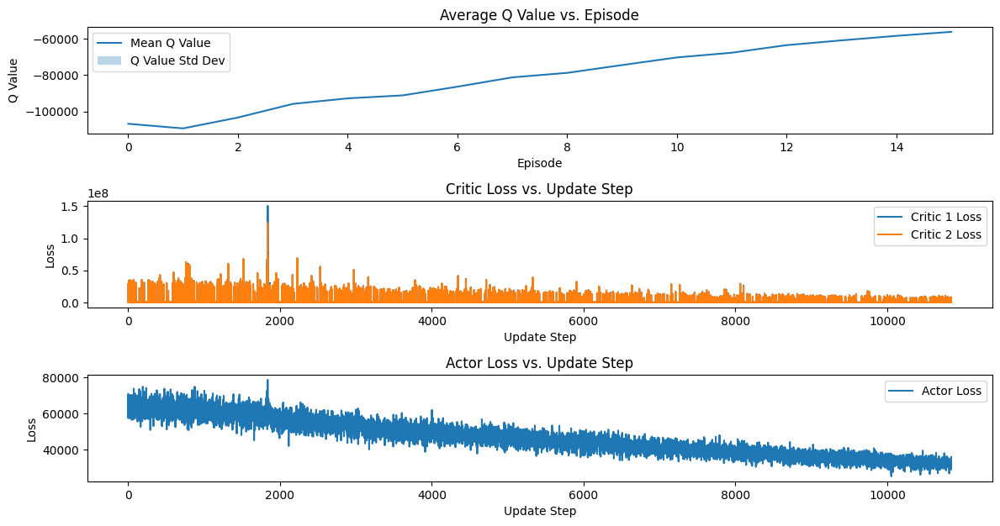

20240314
하루 예약자 수       :   36   total 예약자 수    : 13856 
하루 접속 고객 수     :   46   total 접속 고객 수  : 21737 
하루 예약자 비율      : 78.26  total 예약자 비율   : 63.74 
하루 수업 횟수       :   34   total 수업 횟수    : 13828 
하루 차량당 수업횟수    :  2.83  total 차량당 수업횟수 :  3.65 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   78   total 강화학습 거절 횟수: 23729 
하루 실행 시간       : 25.06  총 실행 시간        : 13791.06


20240315
하루 예약자 수       :   34   total 예약자 수    : 13890 
하루 접속 고객 수     :   49   total 접속 고객 수  : 21786 
하루 예약자 비율      : 69.39  total 예약자 비율   : 63.76 
하루 수업 횟수       :   31   total 수업 횟수    : 13859 
하루 차량당 수업횟수    :  2.58  total 차량당 수업횟수 :  3.64 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   80   total 강화학습 거절 횟수: 23809 
하루 실행 시간       : 24.52  총 실행 시간        : 13815.57


20240316
하루 예약자 수       :   33   total 예약자 수    : 13923 
하루 접속 고객 수     :   43   total 접속 고객 수  : 21829 
하루 예약자 비율      : 76.74  total 예약자 비율   : 63.78 
하루 수업 횟수       :   33   total 수업 횟수    : 13892 
하

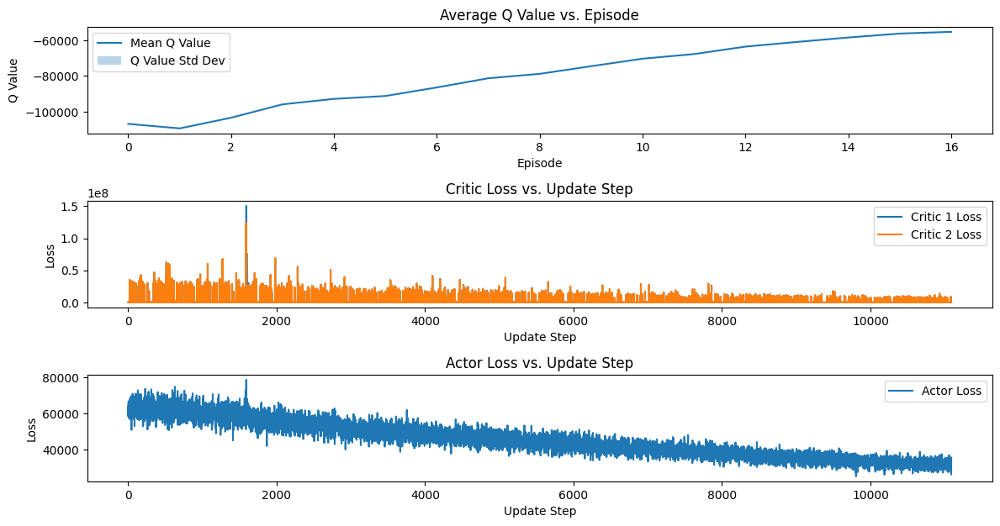

20240324
하루 예약자 수       :   46   total 예약자 수    : 14228 
하루 접속 고객 수     :   59   total 접속 고객 수  : 22243 
하루 예약자 비율      : 77.97  total 예약자 비율   : 63.97 
하루 수업 횟수       :   39   total 수업 횟수    : 14184 
하루 차량당 수업횟수    :  3.55  total 차량당 수업횟수 :  3.63 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   97   total 강화학습 거절 횟수: 24456 
하루 실행 시간       : 31.23  총 실행 시간        : 14068.32


20240325
하루 예약자 수       :   41   total 예약자 수    : 14269 
하루 접속 고객 수     :   63   total 접속 고객 수  : 22306 
하루 예약자 비율      : 65.08  total 예약자 비율   : 63.97 
하루 수업 횟수       :   47   total 수업 횟수    : 14231 
하루 차량당 수업횟수    :  3.92  total 차량당 수업횟수 :  3.63 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   83   total 강화학습 거절 횟수: 24539 
하루 실행 시간       : 34.06  총 실행 시간        : 14102.38


20240326
하루 예약자 수       :   33   total 예약자 수    : 14302 
하루 접속 고객 수     :   40   total 접속 고객 수  : 22346 
하루 예약자 비율      :  82.5  total 예약자 비율   :  64.0 
하루 수업 횟수       :   38   total 수업 횟수    : 14269 
하

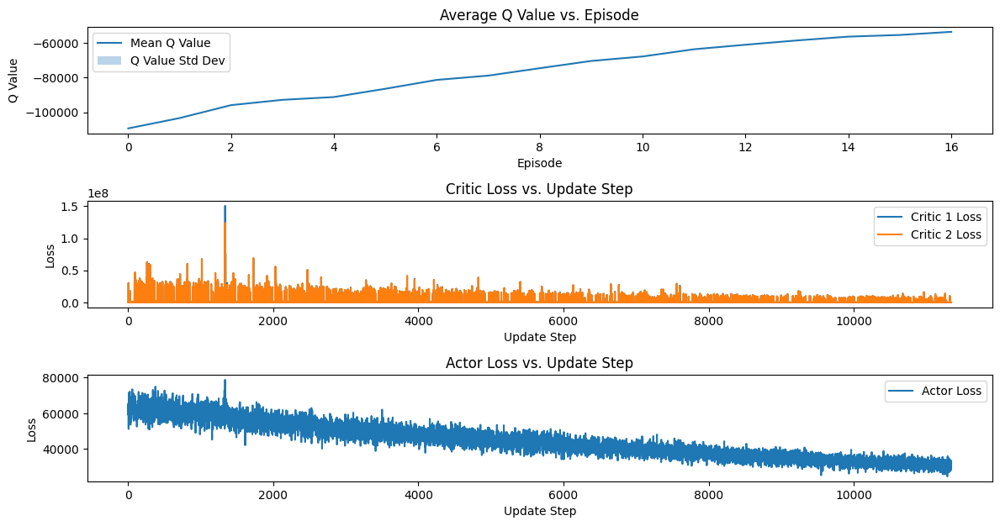

20240403
하루 예약자 수       :   31   total 예약자 수    : 14576 
하루 접속 고객 수     :   38   total 접속 고객 수  : 22733 
하루 예약자 비율      : 81.58  total 예약자 비율   : 64.12 
하루 수업 횟수       :   29   total 수업 횟수    : 14534 
하루 차량당 수업횟수    :  2.64  total 차량당 수업횟수 :  3.61 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   61   total 강화학습 거절 횟수: 25195 
하루 실행 시간       : 19.38  총 실행 시간        : 14328.86


20240404
하루 예약자 수       :   41   total 예약자 수    : 14617 
하루 접속 고객 수     :   62   total 접속 고객 수  : 22795 
하루 예약자 비율      : 66.13  total 예약자 비율   : 64.12 
하루 수업 횟수       :   45   total 수업 횟수    : 14579 
하루 차량당 수업횟수    :  3.75  total 차량당 수업횟수 :  3.61 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   72   total 강화학습 거절 횟수: 25267 
하루 실행 시간       : 36.73  총 실행 시간        : 14365.59


20240405
하루 예약자 수       :   37   total 예약자 수    : 14654 
하루 접속 고객 수     :   41   total 접속 고객 수  : 22836 
하루 예약자 비율      : 90.24  total 예약자 비율   : 64.17 
하루 수업 횟수       :   36   total 수업 횟수    : 14615 
하

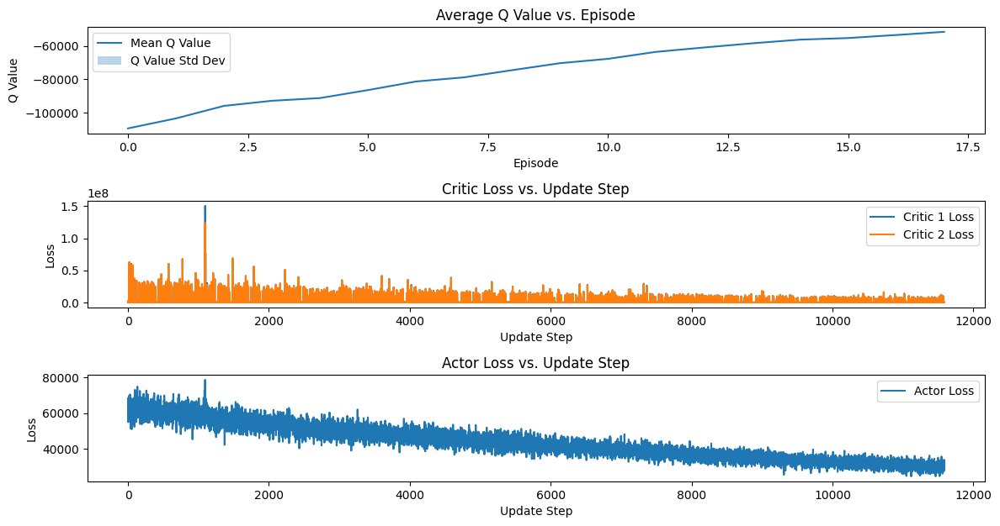

20240413
하루 예약자 수       :   39   total 예약자 수    : 14943 
하루 접속 고객 수     :   52   total 접속 고객 수  : 23227 
하루 예약자 비율      :  75.0  total 예약자 비율   : 64.33 
하루 수업 횟수       :   29   total 수업 횟수    : 14914 
하루 차량당 수업횟수    :  2.42  total 차량당 수업횟수 :  3.6  
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   85   total 강화학습 거절 횟수: 25899 
하루 실행 시간       : 29.48  총 실행 시간        : 14615.14


20240414
하루 예약자 수       :   29   total 예약자 수    : 14972 
하루 접속 고객 수     :   40   total 접속 고객 수  : 23267 
하루 예약자 비율      :  72.5  total 예약자 비율   : 64.35 
하루 수업 횟수       :   34   total 수업 횟수    : 14948 
하루 차량당 수업횟수    :  3.09  total 차량당 수업횟수 :  3.6  
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   72   total 강화학습 거절 횟수: 25971 
하루 실행 시간       : 20.92  총 실행 시간        : 14636.05


20240415
하루 예약자 수       :   30   total 예약자 수    : 15002 
하루 접속 고객 수     :   38   total 접속 고객 수  : 23305 
하루 예약자 비율      : 78.95  total 예약자 비율   : 64.37 
하루 수업 횟수       :   23   total 수업 횟수    : 14971 
하

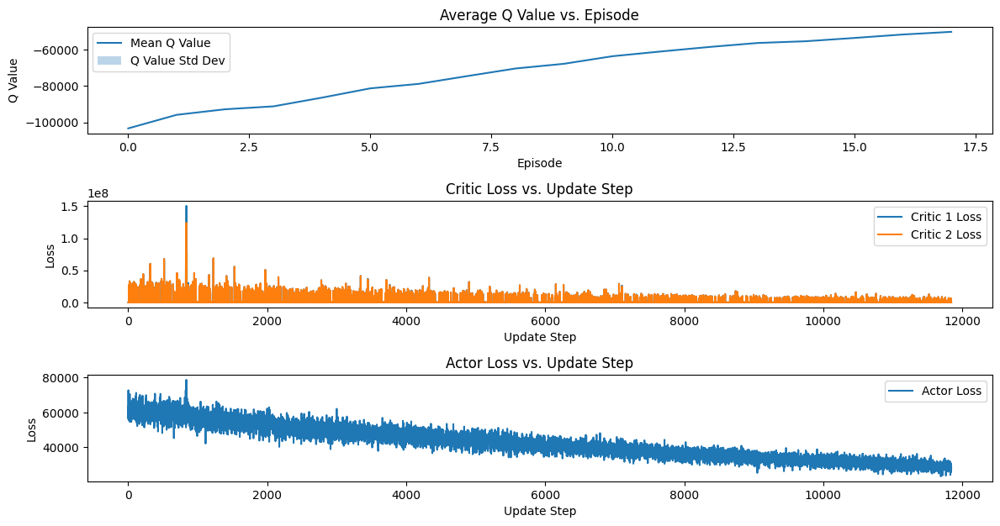

20240423
하루 예약자 수       :   43   total 예약자 수    : 15312 
하루 접속 고객 수     :   54   total 접속 고객 수  : 23746 
하루 예약자 비율      : 79.63  total 예약자 비율   : 64.48 
하루 수업 횟수       :   37   total 수업 횟수    : 15284 
하루 차량당 수업횟수    :  3.08  total 차량당 수업횟수 :  3.59 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   84   total 강화학습 거절 횟수: 26656 
하루 실행 시간       :  29.1  총 실행 시간        : 14928.76


20240424
하루 예약자 수       :   37   total 예약자 수    : 15349 
하루 접속 고객 수     :   52   total 접속 고객 수  : 23798 
하루 예약자 비율      : 71.15  total 예약자 비율   :  64.5 
하루 수업 횟수       :   35   total 수업 횟수    : 15319 
하루 차량당 수업횟수    :  2.92  total 차량당 수업횟수 :  3.58 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   84   total 강화학습 거절 횟수: 26740 
하루 실행 시간       : 25.04  총 실행 시간        : 14953.81


20240425
하루 예약자 수       :   32   total 예약자 수    : 15381 
하루 접속 고객 수     :   46   total 접속 고객 수  : 23844 
하루 예약자 비율      : 69.57  total 예약자 비율   : 64.51 
하루 수업 횟수       :   42   total 수업 횟수    : 15361 
하

In [3]:
from model_train_deploy.lib.sac_lstm import SACAgent
import os
import torch
# Hyperparameters
action_dim = 25
hidden_dim = 256
lr = 3e-4
batch_size = 64
num_episodes = 1000
working_dir = os.getcwd()

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device = 'cpu'

agent = SACAgent(action_dim = action_dim, hidden_dim = hidden_dim, lr = lr,  device = device, 
                 num_cars = len(simulator.차량데이터))
# agent.load_model(path = './model/model_'+str(len(simulator.차량데이터))+'.torch')

day_경과 = 0

best_score = 0
# for 단계 in range(2):
for _ in range(1):
    state = simulator.reset(선택최적 = 0, 선택rule = 'ruleX')
    done = False
    episode_reward = 0
    # agent.clear_memory()
    
    while simulator.simulation_done == False:
        actions = agent.select_action(state)
        next_state, reward, done = simulator.step(actions)
        
        if (done[0] == 1):
            day_경과 += 1
        if (done[0] == 1) & (simulator.simulation_done == False):
            next_state.insert(0, [next_state[0][0], [[] for _ in range(25)]])
            
            if day_경과 %10 == 0:
                agent.log_q_values(init_states)
                agent.plot_metrics()
            for i in range(30):
                agent.store_transition((state[i], actions[i], reward[i], next_state.copy()[i], done[i]))

            next_state.pop(0)
        elif simulator.simulation_done == False:
            for i in range(30):
                agent.store_transition((state[i], actions[i], reward[i], next_state.copy()[i], done[i]))

        state = next_state
        agent.update(batch_size, frame_idx = day_경과) 
        episode_reward += reward[0]


        if simulator.count_total_수업수 > 2000:
            if best_score <= simulator.count_total_수업수/simulator.count_total_차량수:
                best_score = simulator.count_total_수업수/simulator.count_total_차량수
                best_score = simulator.count_total_수업수/simulator.count_total_차량수
                path = './model_train_deploy/model/'+str(simulator.train_id)
                os.makedirs(path, exist_ok=True)
                agent.save_model(path = path + '/best_model.torch')
                print('saved best model')
    
    print(f" Reward: {episode_reward}")

In [4]:
# 2차년도 최적화 O

In [5]:
# 현실적인 dispatching rule 1개월 데이터

In [6]:
# offline optimal 1주일

20230404
20230405
하루 예약자 수       :   0    total 예약자 수    :   0   
하루 접속 고객 수     :   1    total 접속 고객 수  :   1   
하루 예약자 비율      :  0.0   total 예약자 비율   :  0.0  
하루 수업 횟수       :   0    total 수업 횟수    :   0   
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   1    total 강화학습 거절 횟수:   1   
하루 실행 시간       :  0.11  총 실행 시간        :  0.11 


20230406
하루 예약자 수       :   0    total 예약자 수    :   0   
하루 접속 고객 수     :   0    total 접속 고객 수  :   1   
하루 수업 횟수       :   0    total 수업 횟수    :   0   
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   0    total 강화학습 거절 횟수:   1   
하루 실행 시간       :  0.0   총 실행 시간        :  0.11 


20230407
하루 예약자 수       :   0    total 예약자 수    :   0   
하루 접속 고객 수     :   0    total 접속 고객 수  :   1   
하루 수업 횟수       :   0    total 수업 횟수    :   0   
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   0    total 강화학습 거절 횟수:   1   
하루 실행 시간       :  0.0   총 실행 시간        :  0.11 


20230408
하루 예약자 수       :   0    total 예

/home/yspark/driving-teacher-ai/dags/model_train_deploy/lib/sac_lstm.py:417: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:274.)
  actions2 = torch.tensor(actions, dtype=torch.float32).to(self.device).squeeze(1)


20230416
하루 예약자 수       :   1    total 예약자 수    :   2   
하루 접속 고객 수     :   1    total 접속 고객 수  :   4   
하루 예약자 비율      : 100.0  total 예약자 비율   :  50.0 
하루 수업 횟수       :   0    total 수업 횟수    :   0   
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   0    total 강화학습 거절 횟수:   2   
하루 실행 시간       :  0.4   총 실행 시간        :  1.0  


20230417
하루 예약자 수       :   2    total 예약자 수    :   4   
하루 접속 고객 수     :   2    total 접속 고객 수  :   6   
하루 예약자 비율      : 100.0  total 예약자 비율   : 66.67 
하루 수업 횟수       :   0    total 수업 횟수    :   0   
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   2    total 강화학습 거절 횟수:   4   
하루 실행 시간       :  0.79  총 실행 시간        :  1.79 


20230418
하루 예약자 수       :   1    total 예약자 수    :   5   
하루 접속 고객 수     :   2    total 접속 고객 수  :   8   
하루 예약자 비율      :  50.0  total 예약자 비율   :  62.5 
하루 수업 횟수       :   0    total 수업 횟수    :   0   
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   2    total 강화학습 거절 횟수:   6   
하루 

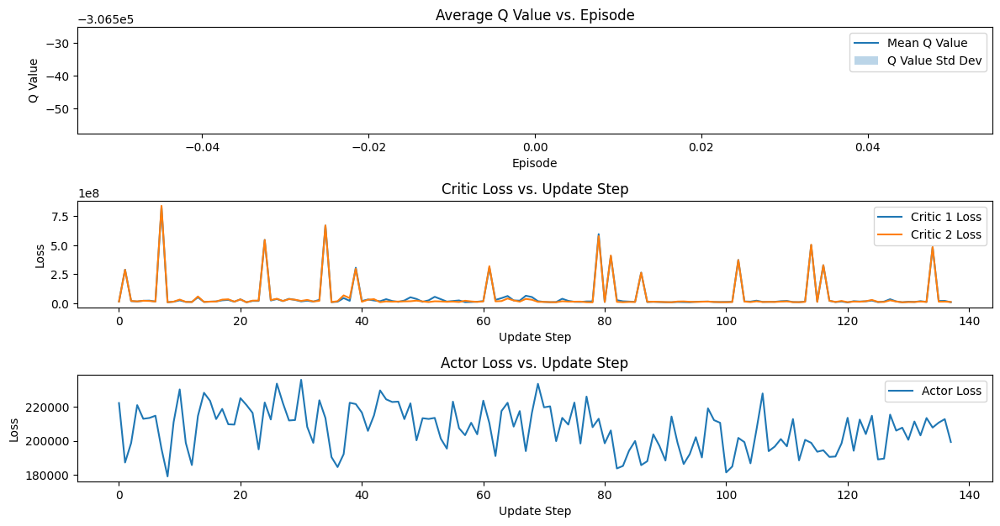

20230506
4
하루 예약자 수       :   30   total 예약자 수    :  258  
하루 접속 고객 수     :   40   total 접속 고객 수  :  319  
하루 예약자 비율      :  75.0  total 예약자 비율   : 80.88 
하루 수업 횟수       :   40   total 수업 횟수    :  231  
하루 차량당 수업횟수    :  3.33  total 차량당 수업횟수 :  3.21 
하루 최적 차량당 수업횟수 :  4.42  total 최적 차량당 수업횟수:  4.46 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   64   total 강화학습 거절 횟수:  410  
하루 실행 시간       : 27.92  총 실행 시간        : 187.51


20230507
4
하루 예약자 수       :   35   total 예약자 수    :  293  
하루 접속 고객 수     :   47   total 접속 고객 수  :  366  
하루 예약자 비율      : 74.47  total 예약자 비율   : 80.05 
하루 수업 횟수       :   34   total 수업 횟수    :  265  
하루 차량당 수업횟수    :  2.83  total 차량당 수업횟수 :  3.15 
하루 최적 차량당 수업횟수 :  4.83  total 최적 차량당 수업횟수:  4.51 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   86   total 강화학습 거절 횟수:  496  
하루 실행 시간       : 24.48  총 실행 시간        : 211.99


20230508
4
하루 예약자 수       :   40   total 예약자 수    :  333  
하루 접속 고객 수     :   51   total 접속 고객 수  :  4

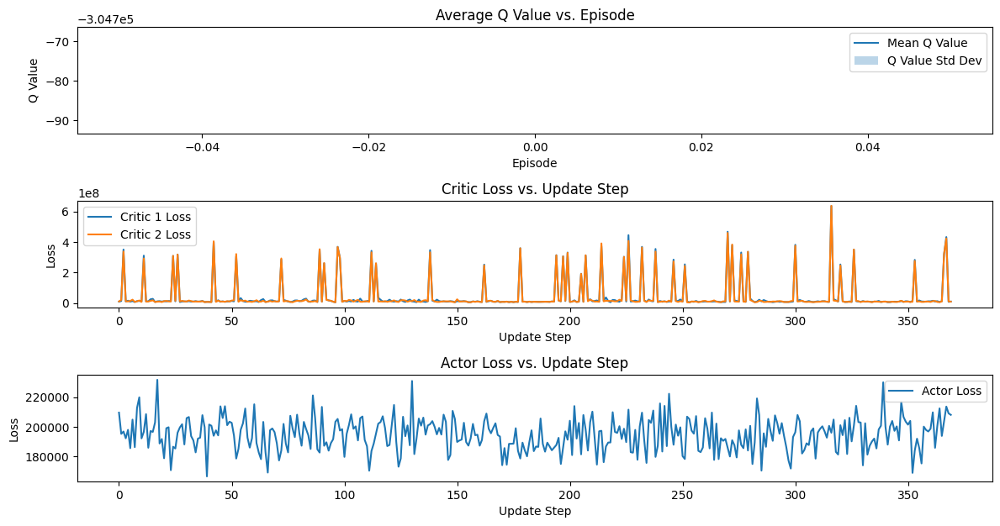

20230516
4
하루 예약자 수       :   41   total 예약자 수    :  629  
하루 접속 고객 수     :   51   total 접속 고객 수  :  794  
하루 예약자 비율      : 80.39  total 예약자 비율   : 79.22 
하루 수업 횟수       :   44   total 수업 횟수    :  593  
하루 차량당 수업횟수    :  3.67  total 차량당 수업횟수 :  3.09 
하루 최적 차량당 수업횟수 :  4.75  total 최적 차량당 수업횟수:  4.56 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   55   total 강화학습 거절 횟수:  1076 
하루 실행 시간       : 40.99  총 실행 시간        : 451.28


20230517
4
하루 예약자 수       :   51   total 예약자 수    :  680  
하루 접속 고객 수     :   73   total 접속 고객 수  :  867  
하루 예약자 비율      : 69.86  total 예약자 비율   : 78.43 
하루 수업 횟수       :   53   total 수업 횟수    :  646  
하루 차량당 수업횟수    :  4.42  total 차량당 수업횟수 :  3.17 
하루 최적 차량당 수업횟수 :  5.0   total 최적 차량당 수업횟수:  4.59 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   72   total 강화학습 거절 횟수:  1148 
하루 실행 시간       : 60.58  총 실행 시간        : 511.87


20230518
4
하루 예약자 수       :   41   total 예약자 수    :  721  
하루 접속 고객 수     :   49   total 접속 고객 수  :  9

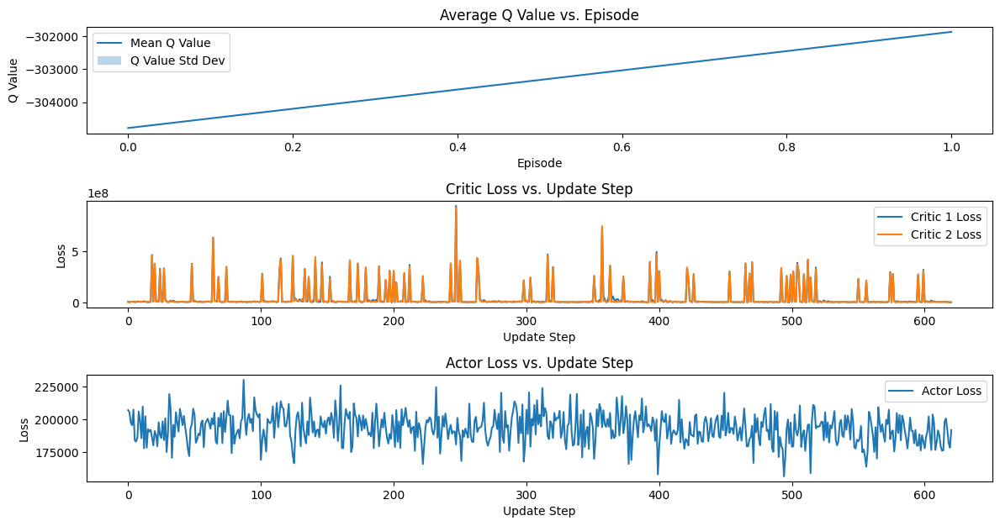

20230526
4
하루 예약자 수       :   36   total 예약자 수    :  1019 
하루 접속 고객 수     :   52   total 접속 고객 수  :  1298 
하루 예약자 비율      : 69.23  total 예약자 비율   : 78.51 
하루 수업 횟수       :   35   total 수업 횟수    :  985  
하루 차량당 수업횟수    :  2.92  total 차량당 수업횟수 :  3.16 
하루 최적 차량당 수업횟수 :  4.5   total 최적 차량당 수업횟수:  4.65 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   59   total 강화학습 거절 횟수:  1709 
하루 실행 시간       : 30.91  총 실행 시간        : 779.5 


20230527
4
하루 예약자 수       :   35   total 예약자 수    :  1054 
하루 접속 고객 수     :   55   total 접속 고객 수  :  1353 
하루 예약자 비율      : 63.64  total 예약자 비율   :  77.9 
하루 수업 횟수       :   32   total 수업 횟수    :  1017 
하루 차량당 수업횟수    :  2.67  total 차량당 수업횟수 :  3.14 
하루 최적 차량당 수업횟수 :  5.17  total 최적 차량당 수업횟수:  4.67 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   60   total 강화학습 거절 횟수:  1769 
하루 실행 시간       : 22.94  총 실행 시간        : 802.44


20230528
4
하루 예약자 수       :   44   total 예약자 수    :  1098 
하루 접속 고객 수     :   54   total 접속 고객 수  :  1

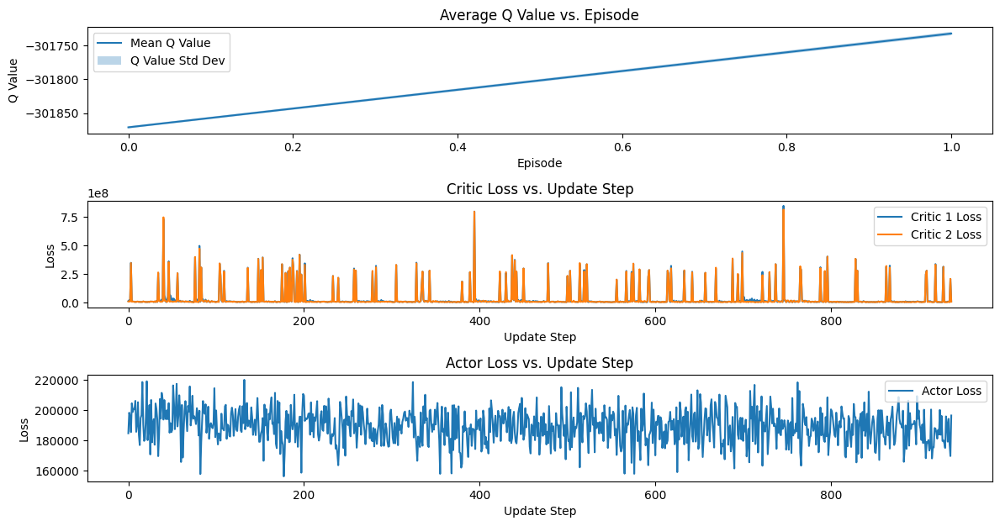

20230605
4
하루 예약자 수       :   38   total 예약자 수    :  1463 
하루 접속 고객 수     :   79   total 접속 고객 수  :  1959 
하루 예약자 비율      :  48.1  total 예약자 비율   : 74.68 
하루 수업 횟수       :   53   total 수업 횟수    :  1412 
하루 차량당 수업횟수    :  4.42  total 차량당 수업횟수 :  3.28 
하루 최적 차량당 수업횟수 :  5.17  total 최적 차량당 수업횟수:  4.72 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   57   total 강화학습 거절 횟수:  2444 
하루 실행 시간       :  52.0  총 실행 시간        : 1194.07


20230606
4
하루 예약자 수       :   48   total 예약자 수    :  1511 
하루 접속 고객 수     :   76   total 접속 고객 수  :  2035 
하루 예약자 비율      : 63.16  total 예약자 비율   : 74.25 
하루 수업 횟수       :   53   total 수업 횟수    :  1465 
하루 차량당 수업횟수    :  4.42  total 차량당 수업횟수 :  3.31 
하루 최적 차량당 수업횟수 :  5.0   total 최적 차량당 수업횟수:  4.73 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   63   total 강화학습 거절 횟수:  2507 
하루 실행 시간       :  58.7  총 실행 시간        : 1252.77


20230607
4
하루 예약자 수       :   44   total 예약자 수    :  1555 
하루 접속 고객 수     :   88   total 접속 고객 수  : 

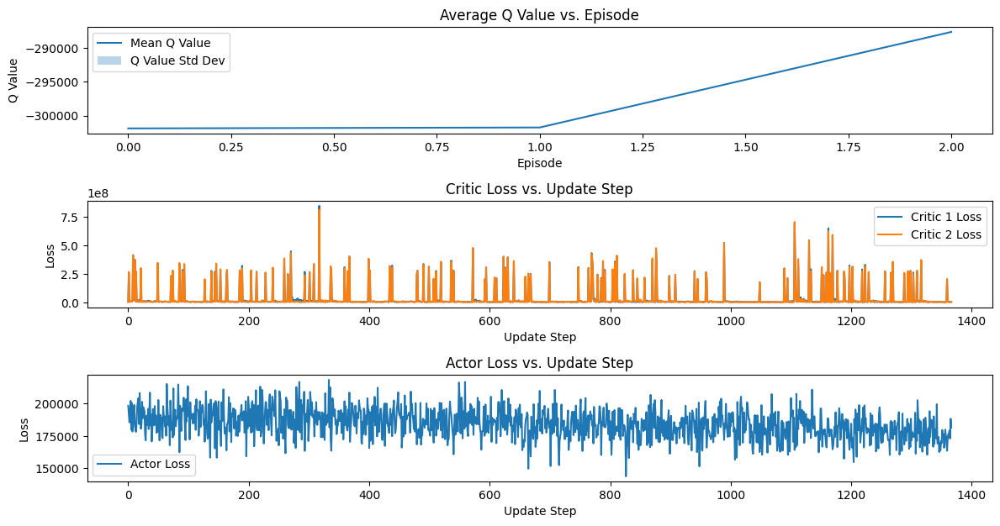

20230615
4
하루 예약자 수       :   42   total 예약자 수    :  1964 
하루 접속 고객 수     :   65   total 접속 고객 수  :  2803 
하루 예약자 비율      : 64.62  total 예약자 비율   : 70.07 
하루 수업 횟수       :   51   total 수업 횟수    :  1904 
하루 차량당 수업횟수    :  4.25  total 차량당 수업횟수 :  3.46 
하루 최적 차량당 수업횟수 :  5.0   total 최적 차량당 수업횟수:  4.78 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   64   total 강화학습 거절 횟수:  3166 
하루 실행 시간       : 65.03  총 실행 시간        : 1807.18


20230616
4
하루 예약자 수       :   56   total 예약자 수    :  2020 
하루 접속 고객 수     :   82   total 접속 고객 수  :  2885 
하루 예약자 비율      : 68.29  total 예약자 비율   : 70.02 
하루 수업 횟수       :   49   total 수업 횟수    :  1953 
하루 차량당 수업횟수    :  4.08  total 차량당 수업횟수 :  3.47 
하루 최적 차량당 수업횟수 :  5.33  total 최적 차량당 수업횟수:  4.79 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   80   total 강화학습 거절 횟수:  3246 
하루 실행 시간       : 55.35  총 실행 시간        : 1862.53


20230617
4
하루 예약자 수       :   60   total 예약자 수    :  2080 
하루 접속 고객 수     :  110   total 접속 고객 수  : 

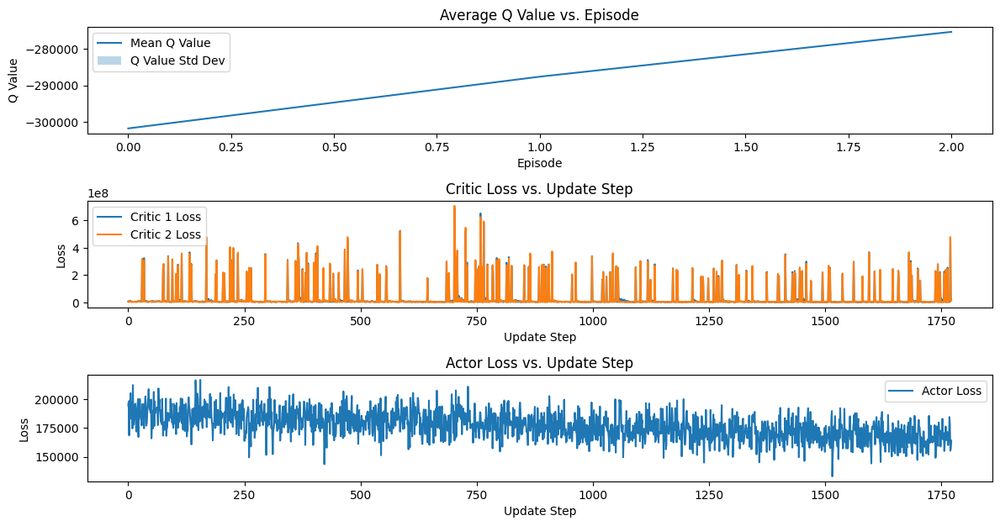

saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best mod

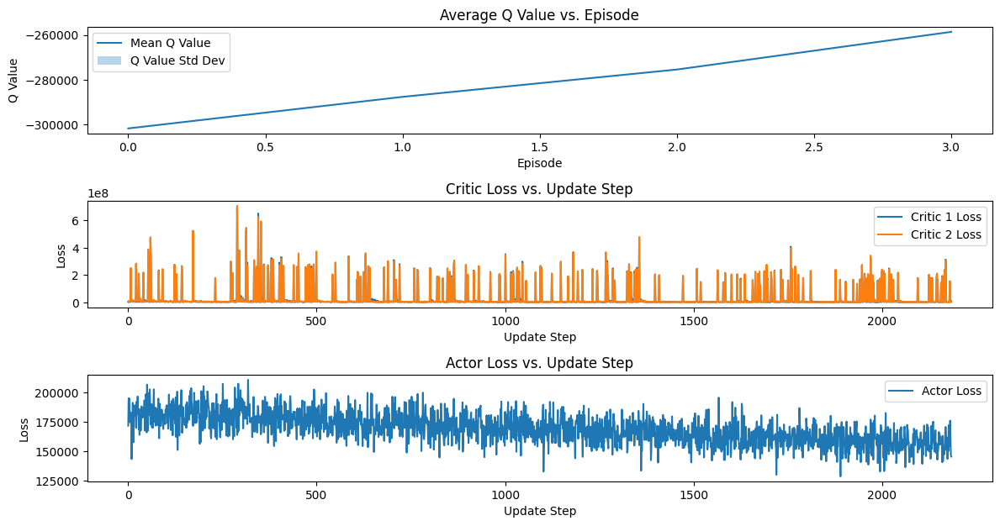

saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best mod

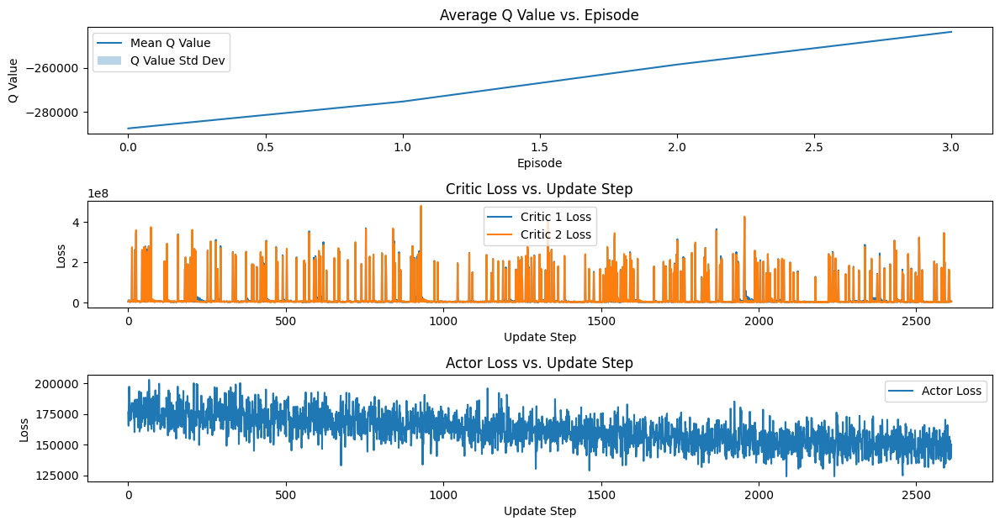

saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best mod

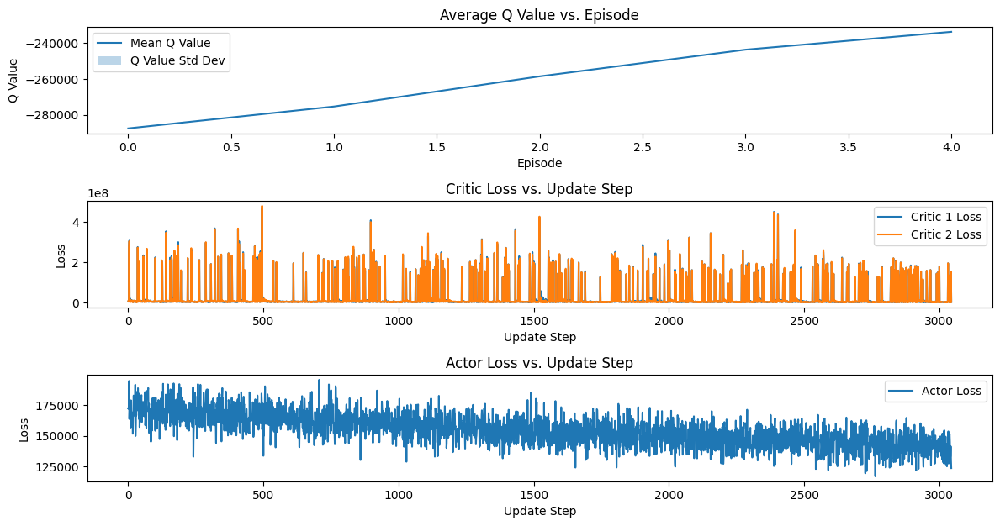

saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best mod

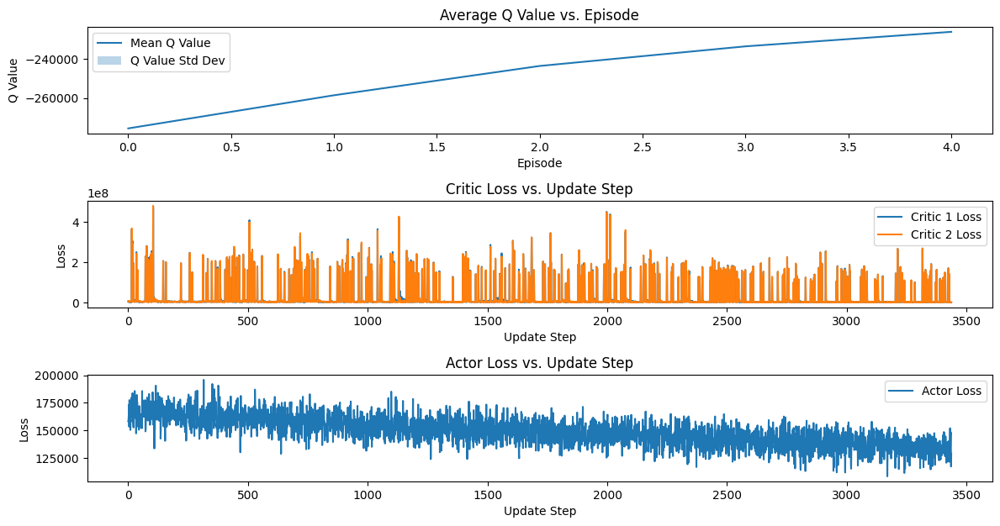

20230804
4
하루 예약자 수       :   52   total 예약자 수    :  4462 
하루 접속 고객 수     :   92   total 접속 고객 수  :  6969 
하루 예약자 비율      : 56.52  total 예약자 비율   : 64.03 
하루 수업 횟수       :   47   total 수업 횟수    :  4396 
하루 차량당 수업횟수    :  3.92  total 차량당 수업횟수 :  3.82 
하루 최적 차량당 수업횟수 :  5.0   total 최적 차량당 수업횟수:  4.94 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   82   total 강화학습 거절 횟수:  6862 
하루 실행 시간       : 57.34  총 실행 시간        : 4964.74


20230805
4
하루 예약자 수       :   49   total 예약자 수    :  4511 
하루 접속 고객 수     :   80   total 접속 고객 수  :  7049 
하루 예약자 비율      : 61.25  total 예약자 비율   : 63.99 
하루 수업 횟수       :   46   total 수업 횟수    :  4442 
하루 차량당 수업횟수    :  3.83  total 차량당 수업횟수 :  3.82 
하루 최적 차량당 수업횟수 :  4.92  total 최적 차량당 수업횟수:  4.94 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   78   total 강화학습 거절 횟수:  6940 
하루 실행 시간       : 45.38  총 실행 시간        : 5010.12


20230806
4
하루 예약자 수       :   53   total 예약자 수    :  4564 
하루 접속 고객 수     :   85   total 접속 고객 수  : 

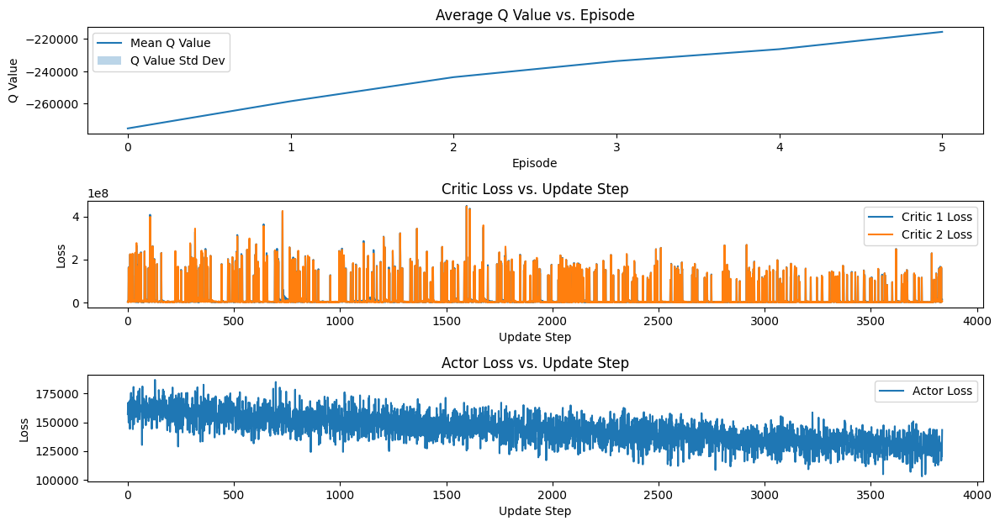

saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best mod

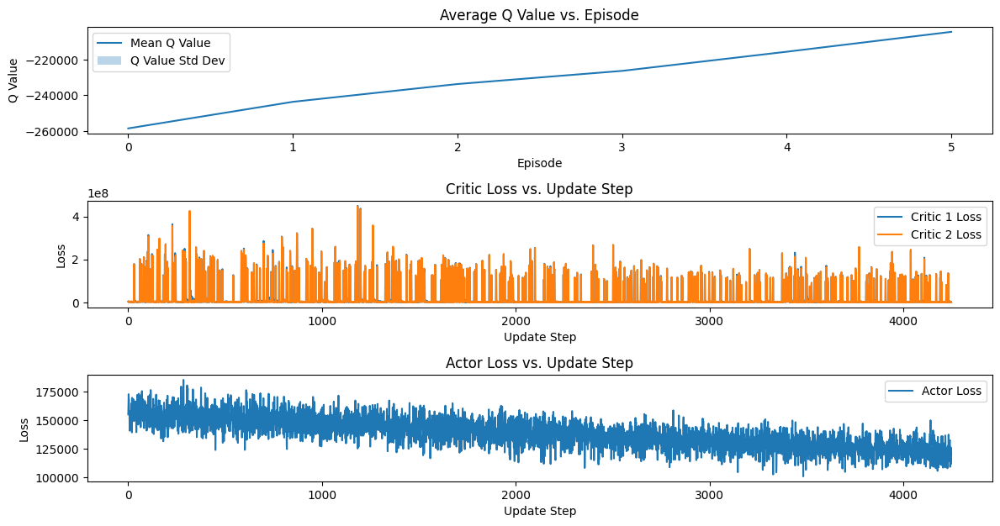

saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best model
saved best mod

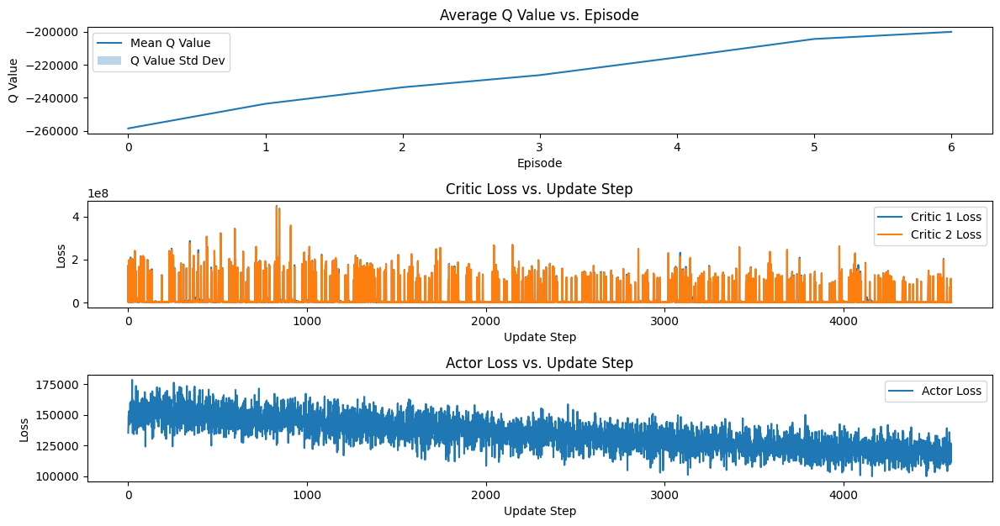

20230903
4
하루 예약자 수       :   30   total 예약자 수    :  5827 
하루 접속 고객 수     :   42   total 접속 고객 수  :  9253 
하루 예약자 비율      : 71.43  total 예약자 비율   : 62.97 
하루 수업 횟수       :   32   total 수업 횟수    :  5790 
하루 차량당 수업횟수    :  2.67  total 차량당 수업횟수 :  3.83 
하루 최적 차량당 수업횟수 :  4.33  total 최적 차량당 수업횟수:  4.94 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   34   total 강화학습 거절 횟수:  8834 
하루 실행 시간       : 23.22  총 실행 시간        : 6580.22


20230904
4
하루 예약자 수       :   38   total 예약자 수    :  5865 
하루 접속 고객 수     :   47   total 접속 고객 수  :  9300 
하루 예약자 비율      : 80.85  total 예약자 비율   : 63.06 
하루 수업 횟수       :   38   total 수업 횟수    :  5828 
하루 차량당 수업횟수    :  3.17  total 차량당 수업횟수 :  3.83 
하루 최적 차량당 수업횟수 :  4.83  total 최적 차량당 수업횟수:  4.94 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   53   total 강화학습 거절 횟수:  8887 
하루 실행 시간       : 36.08  총 실행 시간        : 6616.3


20230905
4
하루 예약자 수       :   41   total 예약자 수    :  5906 
하루 접속 고객 수     :   45   total 접속 고객 수  :  

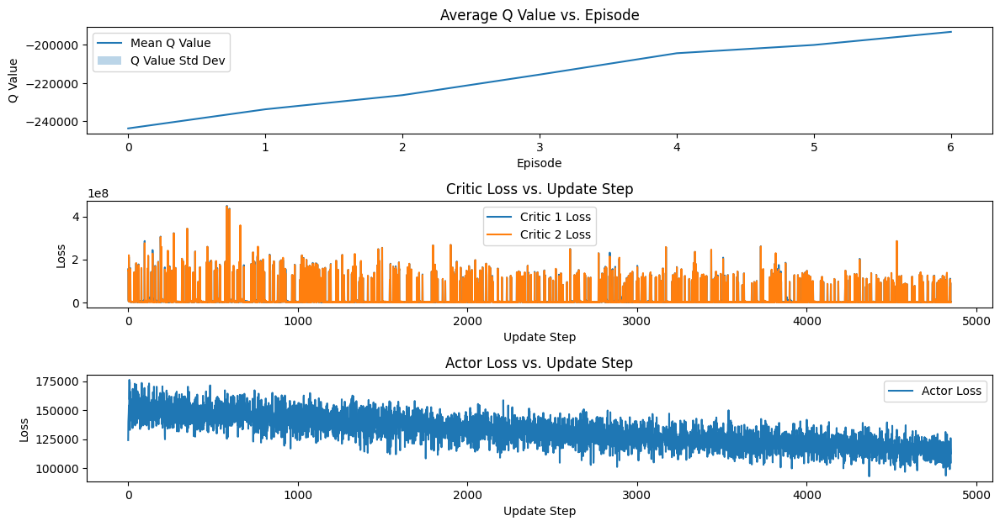

20230913
4
하루 예약자 수       :   32   total 예약자 수    :  6216 
하루 접속 고객 수     :   45   total 접속 고객 수  :  9751 
하루 예약자 비율      : 71.11  total 예약자 비율   : 63.75 
하루 수업 횟수       :   28   total 수업 횟수    :  6175 
하루 차량당 수업횟수    :  2.33  total 차량당 수업횟수 :  3.79 
하루 최적 차량당 수업횟수 :  4.58  total 최적 차량당 수업횟수:  4.93 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   73   total 강화학습 거절 횟수:  9500 
하루 실행 시간       : 24.86  총 실행 시간        : 6874.94


20230914
4
하루 예약자 수       :   40   total 예약자 수    :  6256 
하루 접속 고객 수     :   50   total 접속 고객 수  :  9801 
하루 예약자 비율      :  80.0  total 예약자 비율   : 63.83 
하루 수업 횟수       :   36   total 수업 횟수    :  6211 
하루 차량당 수업횟수    :  3.0   total 차량당 수업횟수 :  3.78 
하루 최적 차량당 수업횟수 :  5.17  total 최적 차량당 수업횟수:  4.94 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   61   total 강화학습 거절 횟수:  9561 
하루 실행 시간       : 25.99  총 실행 시간        : 6900.93


20230915
4
하루 예약자 수       :   30   total 예약자 수    :  6286 
하루 접속 고객 수     :   52   total 접속 고객 수  : 

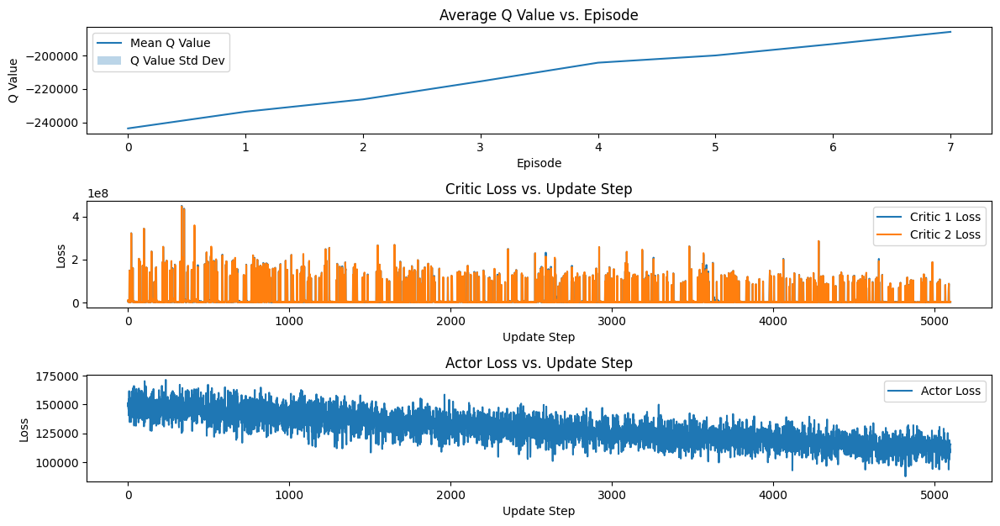

20230923
4
하루 예약자 수       :   43   total 예약자 수    :  6597 
하루 접속 고객 수     :   55   total 접속 고객 수  : 10259 
하루 예약자 비율      : 78.18  total 예약자 비율   :  64.3 
하루 수업 횟수       :   47   total 수업 횟수    :  6562 
하루 차량당 수업횟수    :  3.92  total 차량당 수업횟수 :  3.75 
하루 최적 차량당 수업횟수 :  5.08  total 최적 차량당 수업횟수:  4.92 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   73   total 강화학습 거절 횟수: 10057 
하루 실행 시간       : 40.79  총 실행 시간        : 7176.29


20230924
4
하루 예약자 수       :   27   total 예약자 수    :  6624 
하루 접속 고객 수     :   32   total 접속 고객 수  : 10291 
하루 예약자 비율      : 84.38  total 예약자 비율   : 64.37 
하루 수업 횟수       :   35   total 수업 횟수    :  6597 
하루 차량당 수업횟수    :  2.92  total 차량당 수업횟수 :  3.75 
하루 최적 차량당 수업횟수 :  4.25  total 최적 차량당 수업횟수:  4.91 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   28   total 강화학습 거절 횟수: 10085 
하루 실행 시간       :  18.9  총 실행 시간        : 7195.19


20230925
4
하루 예약자 수       :   39   total 예약자 수    :  6663 
하루 접속 고객 수     :   49   total 접속 고객 수  : 

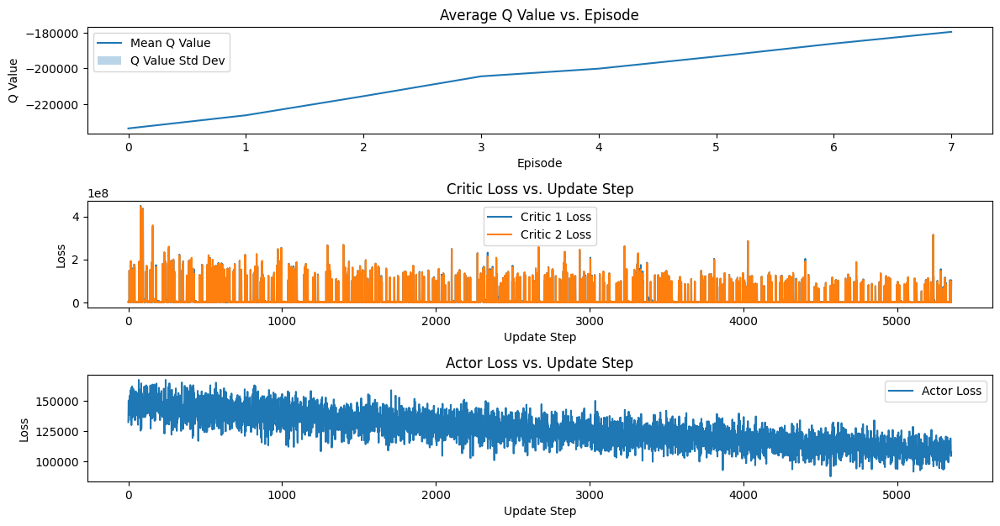

20231003
4
하루 예약자 수       :   32   total 예약자 수    :  6978 
하루 접속 고객 수     :   42   total 접속 고객 수  : 10752 
하루 예약자 비율      : 76.19  total 예약자 비율   :  64.9 
하루 수업 횟수       :   44   total 수업 횟수    :  6931 
하루 차량당 수업횟수    :  3.67  total 차량당 수업횟수 :  3.71 
하루 최적 차량당 수업횟수 :  5.0   total 최적 차량당 수업횟수:  4.9  
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   46   total 강화학습 거절 횟수: 10661 
하루 실행 시간       :  25.9  총 실행 시간        : 7442.63


20231004
4
하루 예약자 수       :   37   total 예약자 수    :  7015 
하루 접속 고객 수     :   48   total 접속 고객 수  : 10800 
하루 예약자 비율      : 77.08  total 예약자 비율   : 64.95 
하루 수업 횟수       :   35   total 수업 횟수    :  6966 
하루 차량당 수업횟수    :  2.92  total 차량당 수업횟수 :  3.71 
하루 최적 차량당 수업횟수 :  4.58  total 최적 차량당 수업횟수:  4.89 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   62   total 강화학습 거절 횟수: 10723 
하루 실행 시간       : 25.43  총 실행 시간        : 7468.06


20231005
4
하루 예약자 수       :   45   total 예약자 수    :  7060 
하루 접속 고객 수     :   66   total 접속 고객 수  : 

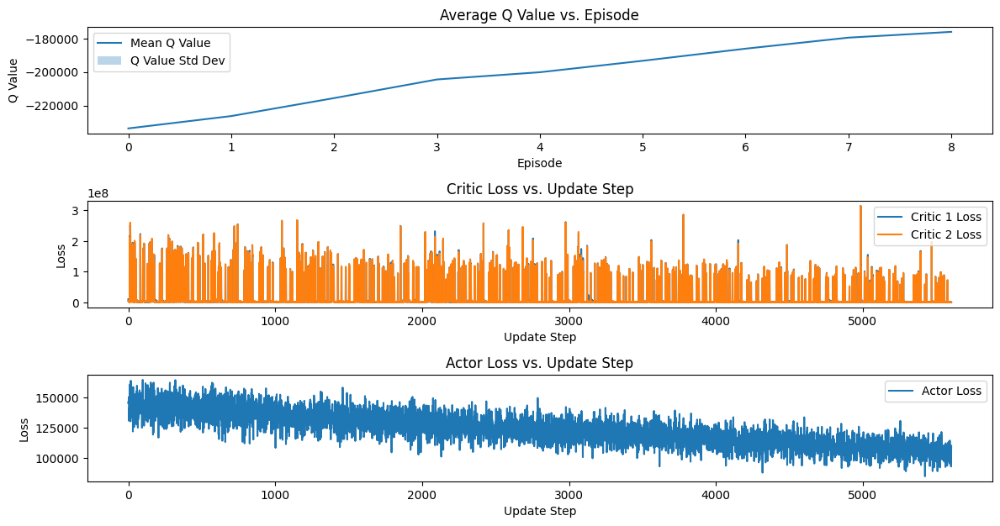

20231013
4
하루 예약자 수       :   39   total 예약자 수    :  7369 
하루 접속 고객 수     :   52   total 접속 고객 수  : 11262 
하루 예약자 비율      :  75.0  total 예약자 비율   : 65.43 
하루 수업 횟수       :   43   total 수업 횟수    :  7335 
하루 차량당 수업횟수    :  3.58  total 차량당 수업횟수 :  3.69 
하루 최적 차량당 수업횟수 :  5.0   total 최적 차량당 수업횟수:  4.88 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   81   total 강화학습 거절 횟수: 11281 
하루 실행 시간       : 37.96  총 실행 시간        : 7775.58


20231014
4
하루 예약자 수       :   42   total 예약자 수    :  7411 
하루 접속 고객 수     :   50   total 접속 고객 수  : 11312 
하루 예약자 비율      :  84.0  total 예약자 비율   : 65.51 
하루 수업 횟수       :   28   total 수업 횟수    :  7363 
하루 차량당 수업횟수    :  3.11  total 차량당 수업횟수 :  3.69 
하루 최적 차량당 수업횟수 :  5.0   total 최적 차량당 수업횟수:  4.88 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   72   total 강화학습 거절 횟수: 11353 
하루 실행 시간       :  21.9  총 실행 시간        : 7797.48


20231015
4
하루 예약자 수       :   43   total 예약자 수    :  7454 
하루 접속 고객 수     :   53   total 접속 고객 수  : 

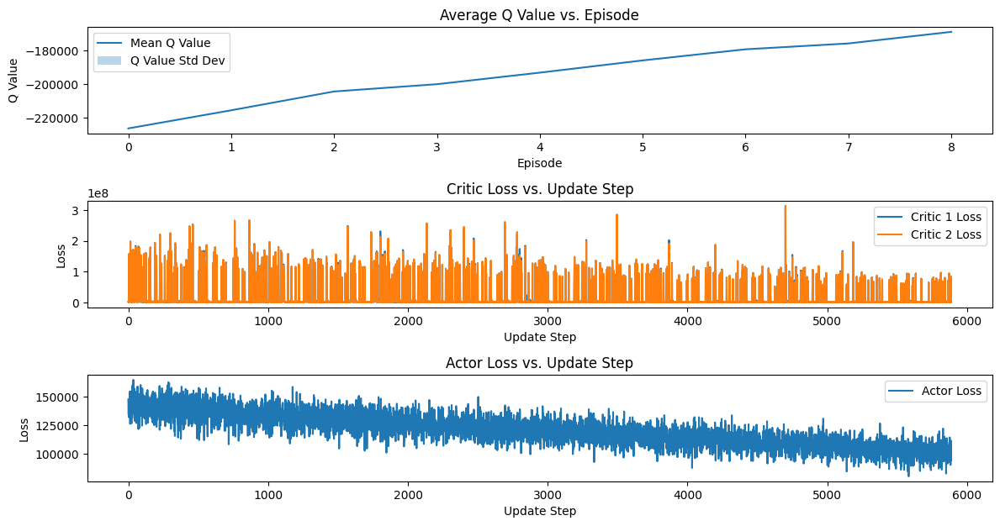

20231023
4
하루 예약자 수       :   39   total 예약자 수    :  7808 
하루 접속 고객 수     :   44   total 접속 고객 수  : 11823 
하루 예약자 비율      : 88.64  total 예약자 비율   : 66.04 
하루 수업 횟수       :   40   total 수업 횟수    :  7759 
하루 차량당 수업횟수    :  3.33  total 차량당 수업횟수 :  3.69 
하루 최적 차량당 수업횟수 :  4.17  total 최적 차량당 수업횟수:  4.88 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   61   total 강화학습 거절 횟수: 11948 
하루 실행 시간       : 30.89  총 실행 시간        : 8152.34


20231024
4
하루 예약자 수       :   38   total 예약자 수    :  7846 
하루 접속 고객 수     :   49   total 접속 고객 수  : 11872 
하루 예약자 비율      : 77.55  total 예약자 비율   : 66.09 
하루 수업 횟수       :   41   total 수업 횟수    :  7800 
하루 차량당 수업횟수    :  3.42  total 차량당 수업횟수 :  3.69 
하루 최적 차량당 수업횟수 :  4.42  total 최적 차량당 수업횟수:  4.88 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   64   total 강화학습 거절 횟수: 12012 
하루 실행 시간       : 36.21  총 실행 시간        : 8188.54


20231025
4
하루 예약자 수       :   37   total 예약자 수    :  7883 
하루 접속 고객 수     :   49   total 접속 고객 수  : 

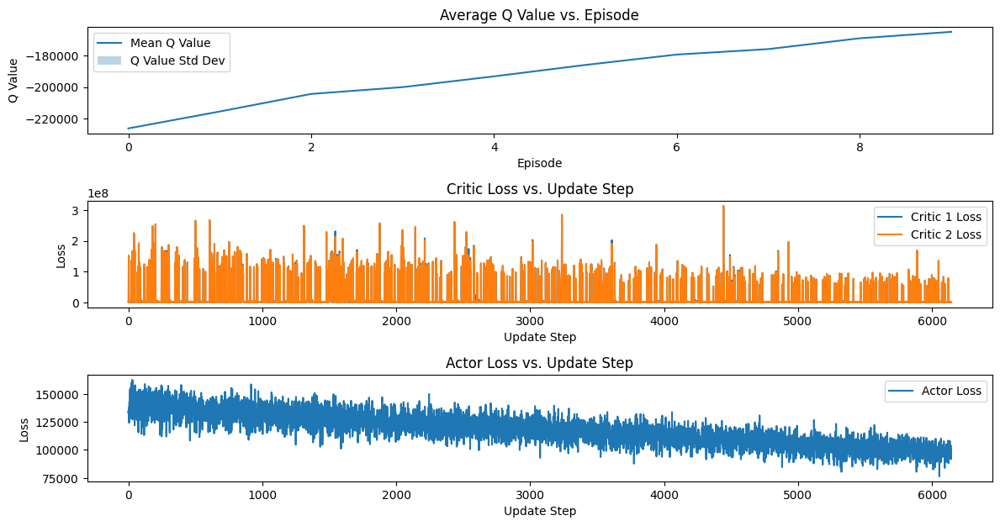

20231102
4
하루 예약자 수       :   40   total 예약자 수    :  8212 
하루 접속 고객 수     :   56   total 접속 고객 수  : 12350 
하루 예약자 비율      : 71.43  total 예약자 비율   : 66.49 
하루 수업 횟수       :   42   total 수업 횟수    :  8177 
하루 차량당 수업횟수    :  3.5   total 차량당 수업횟수 :  3.68 
하루 최적 차량당 수업횟수 :  5.25  total 최적 차량당 수업횟수:  4.88 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   65   total 강화학습 거절 횟수: 12620 
하루 실행 시간       : 31.42  총 실행 시간        : 8473.02


20231103
4
하루 예약자 수       :   53   total 예약자 수    :  8265 
하루 접속 고객 수     :   58   total 접속 고객 수  : 12408 
하루 예약자 비율      : 91.38  total 예약자 비율   : 66.61 
하루 수업 횟수       :   37   total 수업 횟수    :  8214 
하루 차량당 수업횟수    :  3.08  total 차량당 수업횟수 :  3.67 
하루 최적 차량당 수업횟수 :  5.25  total 최적 차량당 수업횟수:  4.88 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   87   total 강화학습 거절 횟수: 12707 
하루 실행 시간       : 30.88  총 실행 시간        : 8503.89


20231104
4
하루 예약자 수       :   34   total 예약자 수    :  8299 
하루 접속 고객 수     :   46   total 접속 고객 수  : 

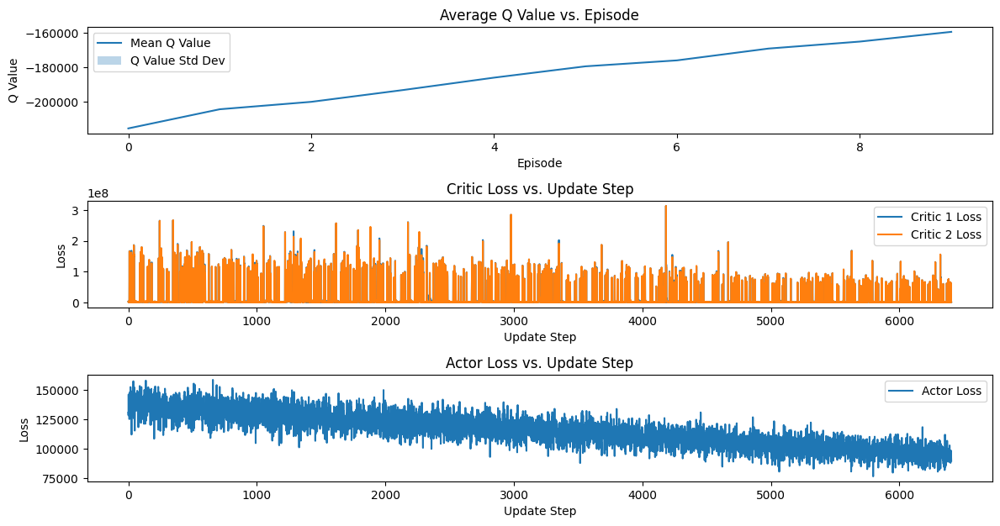

20231112
4
하루 예약자 수       :   40   total 예약자 수    :  8610 
하루 접속 고객 수     :   45   total 접속 고객 수  : 12858 
하루 예약자 비율      : 88.89  total 예약자 비율   : 66.96 
하루 수업 횟수       :   38   total 수업 횟수    :  8565 
하루 차량당 수업횟수    :  3.17  total 차량당 수업횟수 :  3.65 
하루 최적 차량당 수업횟수 :  4.25  total 최적 차량당 수업횟수:  4.87 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   60   total 강화학습 거절 횟수: 13237 
하루 실행 시간       : 26.06  총 실행 시간        : 8796.12


20231113
4
하루 예약자 수       :   44   total 예약자 수    :  8654 
하루 접속 고객 수     :   61   total 접속 고객 수  : 12919 
하루 예약자 비율      : 72.13  total 예약자 비율   : 66.99 
하루 수업 횟수       :   44   total 수업 횟수    :  8609 
하루 차량당 수업횟수    :  3.67  total 차량당 수업횟수 :  3.65 
하루 최적 차량당 수업횟수 :  4.58  total 최적 차량당 수업횟수:  4.87 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   70   total 강화학습 거절 횟수: 13307 
하루 실행 시간       : 51.99  총 실행 시간        : 8848.11


20231114
4
하루 예약자 수       :   52   total 예약자 수    :  8706 
하루 접속 고객 수     :   56   total 접속 고객 수  : 

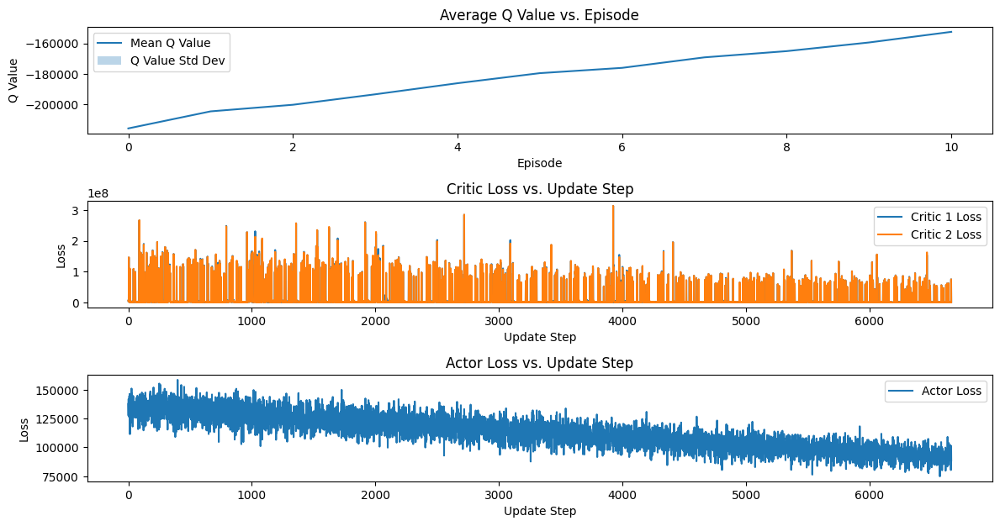

20231122
4
하루 예약자 수       :   35   total 예약자 수    :  9014 
하루 접속 고객 수     :   51   total 접속 고객 수  : 13381 
하루 예약자 비율      : 68.63  total 예약자 비율   : 67.36 
하루 수업 횟수       :   41   total 수업 횟수    :  8979 
하루 차량당 수업횟수    :  3.42  total 차량당 수업횟수 :  3.64 
하루 최적 차량당 수업횟수 :  4.92  total 최적 차량당 수업횟수:  4.86 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   89   total 강화학습 거절 횟수: 13859 
하루 실행 시간       : 35.55  총 실행 시간        : 9156.61


20231123
4
하루 예약자 수       :   39   total 예약자 수    :  9053 
하루 접속 고객 수     :   58   total 접속 고객 수  : 13439 
하루 예약자 비율      : 67.24  total 예약자 비율   : 67.36 
하루 수업 횟수       :   26   total 수업 횟수    :  9005 
하루 차량당 수업횟수    :  2.17  total 차량당 수업횟수 :  3.64 
하루 최적 차량당 수업횟수 :  4.5   total 최적 차량당 수업횟수:  4.86 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   79   total 강화학습 거절 횟수: 13938 
하루 실행 시간       : 27.67  총 실행 시간        : 9184.27


20231124
4
하루 예약자 수       :   44   total 예약자 수    :  9097 
하루 접속 고객 수     :   55   total 접속 고객 수  : 

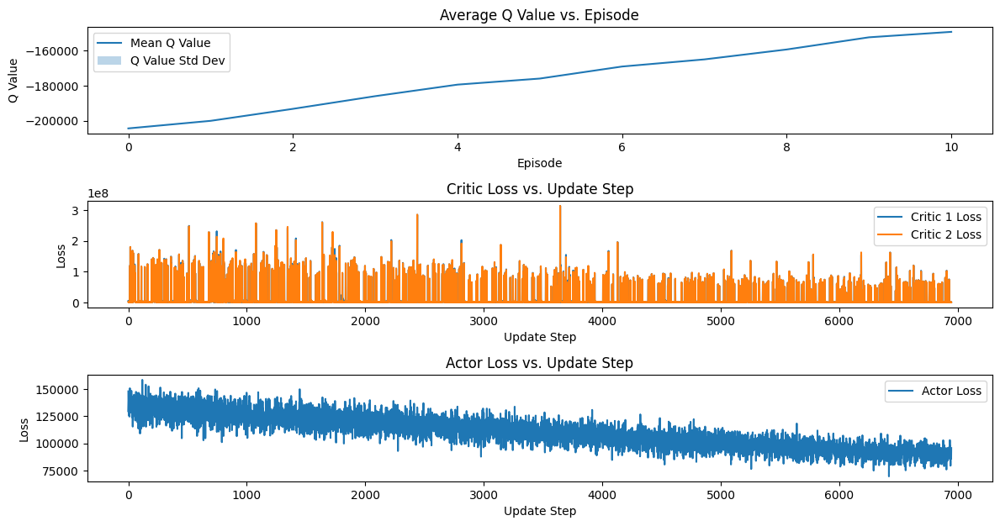

20231202
4
하루 예약자 수       :   47   total 예약자 수    :  9440 
하루 접속 고객 수     :   84   total 접속 고객 수  : 13977 
하루 예약자 비율      : 55.95  total 예약자 비율   : 67.54 
하루 수업 횟수       :   51   total 수업 횟수    :  9380 
하루 차량당 수업횟수    :  4.25  total 차량당 수업횟수 :  3.63 
하루 최적 차량당 수업횟수 :  4.67  total 최적 차량당 수업횟수:  4.85 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   59   total 강화학습 거절 횟수: 14485 
하루 실행 시간       :  64.3  총 실행 시간        : 9541.77


20231203
4
하루 예약자 수       :   47   total 예약자 수    :  9487 
하루 접속 고객 수     :   82   total 접속 고객 수  : 14059 
하루 예약자 비율      : 57.32  total 예약자 비율   : 67.48 
하루 수업 횟수       :   48   total 수업 횟수    :  9428 
하루 차량당 수업횟수    :  4.0   total 차량당 수업횟수 :  3.63 
하루 최적 차량당 수업횟수 :  4.58  total 최적 차량당 수업횟수:  4.85 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   81   total 강화학습 거절 횟수: 14566 
하루 실행 시간       : 49.03  총 실행 시간        : 9590.8


20231204
4
하루 예약자 수       :   54   total 예약자 수    :  9541 
하루 접속 고객 수     :   75   total 접속 고객 수  : 1

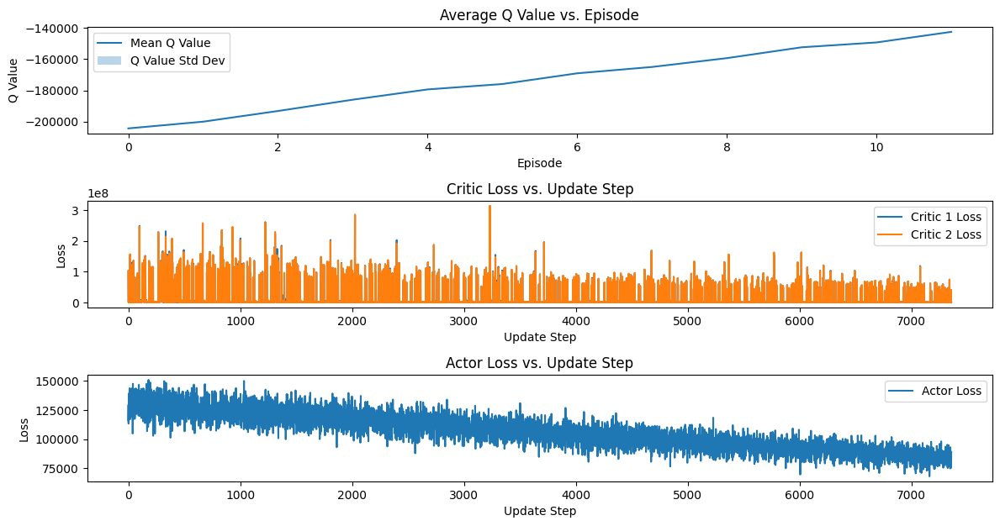

20231212
4
하루 예약자 수       :   40   total 예약자 수    :  9926 
하루 접속 고객 수     :   76   total 접속 고객 수  : 14793 
하루 예약자 비율      : 52.63  total 예약자 비율   :  67.1 
하루 수업 횟수       :   38   total 수업 횟수    :  9860 
하루 차량당 수업횟수    :  3.17  total 차량당 수업횟수 :  3.65 
하루 최적 차량당 수업횟수 :  4.67  total 최적 차량당 수업횟수:  4.86 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   54   total 강화학습 거절 횟수: 15219 
하루 실행 시간       : 44.09  총 실행 시간        : 10128.18


20231213
4
하루 예약자 수       :   36   total 예약자 수    :  9962 
하루 접속 고객 수     :   80   total 접속 고객 수  : 14873 
하루 예약자 비율      :  45.0  total 예약자 비율   : 66.98 
하루 수업 횟수       :   44   total 수업 횟수    :  9904 
하루 차량당 수업횟수    :  3.67  total 차량당 수업횟수 :  3.65 
하루 최적 차량당 수업횟수 :  5.25  total 최적 차량당 수업횟수:  4.86 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   41   total 강화학습 거절 횟수: 15260 
하루 실행 시간       : 44.06  총 실행 시간        : 10172.24


20231214
4
하루 예약자 수       :   51   total 예약자 수    : 10013 
하루 접속 고객 수     :   77   total 접속 고객 수  

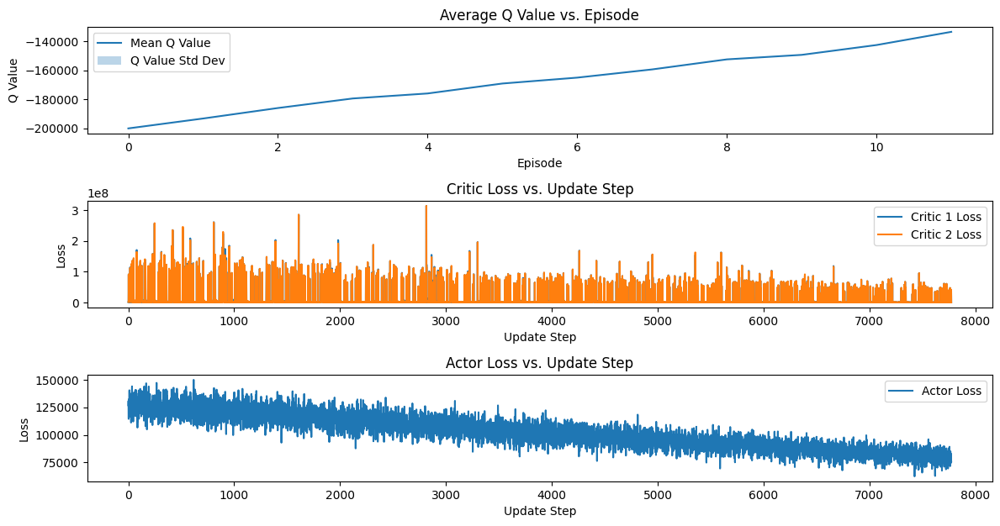

20231222
4
하루 예약자 수       :   39   total 예약자 수    : 10412 
하루 접속 고객 수     :   69   total 접속 고객 수  : 15620 
하루 예약자 비율      : 56.52  total 예약자 비율   : 66.66 
하루 수업 횟수       :   43   total 수업 횟수    : 10337 
하루 차량당 수업횟수    :  3.58  total 차량당 수업횟수 :  3.66 
하루 최적 차량당 수업횟수 :  5.0   total 최적 차량당 수업횟수:  4.86 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   73   total 강화학습 거절 횟수: 15923 
하루 실행 시간       : 42.65  총 실행 시간        : 10656.76


20231223
4
하루 예약자 수       :   52   total 예약자 수    : 10464 
하루 접속 고객 수     :   81   total 접속 고객 수  : 15701 
하루 예약자 비율      :  64.2  total 예약자 비율   : 66.65 
하루 수업 횟수       :   50   total 수업 횟수    : 10387 
하루 차량당 수업횟수    :  4.17  total 차량당 수업횟수 :  3.66 
하루 최적 차량당 수업횟수 :  5.25  total 최적 차량당 수업횟수:  4.87 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   96   total 강화학습 거절 횟수: 16019 
하루 실행 시간       : 55.59  총 실행 시간        : 10712.35


20231224
4
하루 예약자 수       :   49   total 예약자 수    : 10513 
하루 접속 고객 수     :   88   total 접속 고객 수  

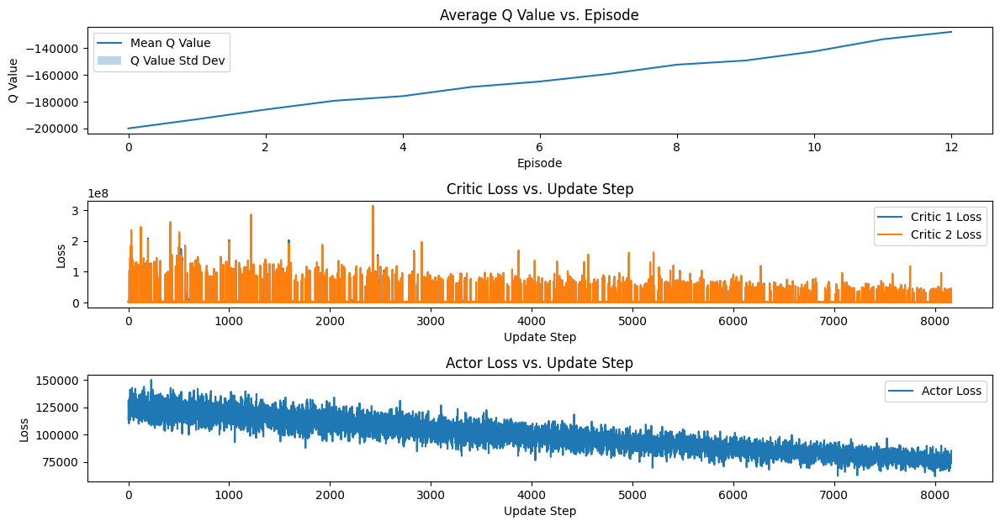

20240101
4
하루 예약자 수       :   34   total 예약자 수    : 10861 
하루 접속 고객 수     :   71   total 접속 고객 수  : 16401 
하루 예약자 비율      : 47.89  total 예약자 비율   : 66.22 
하루 수업 횟수       :   54   total 수업 횟수    : 10797 
하루 차량당 수업횟수    :  4.5   total 차량당 수업횟수 :  3.67 
하루 최적 차량당 수업횟수 :  5.0   total 최적 차량당 수업횟수:  4.87 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   78   total 강화학습 거절 횟수: 16618 
하루 실행 시간       :  59.0  총 실행 시간        : 11199.7


20240102
4
하루 예약자 수       :   68   total 예약자 수    : 10929 
하루 접속 고객 수     :   97   total 접속 고객 수  : 16498 
하루 예약자 비율      :  70.1  total 예약자 비율   : 66.24 
하루 수업 횟수       :   47   total 수업 횟수    : 10844 
하루 차량당 수업횟수    :  3.92  total 차량당 수업횟수 :  3.67 
하루 최적 차량당 수업횟수 :  5.25  total 최적 차량당 수업횟수:  4.87 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   78   total 강화학습 거절 횟수: 16696 
하루 실행 시간       : 57.59  총 실행 시간        : 11257.29


20240103
4
하루 예약자 수       :   40   total 예약자 수    : 10969 
하루 접속 고객 수     :   70   total 접속 고객 수  :

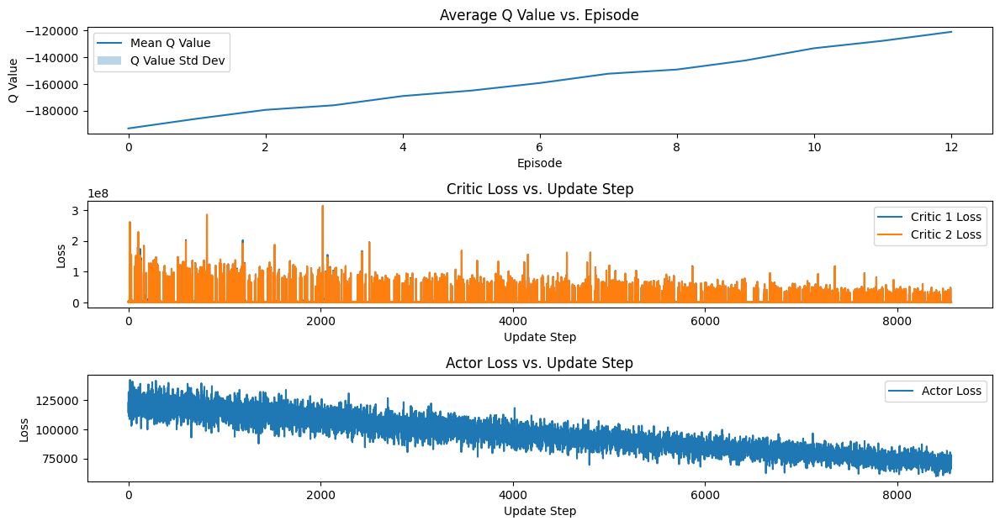

20240111
4
하루 예약자 수       :   46   total 예약자 수    : 11312 
하루 접속 고객 수     :   76   total 접속 고객 수  : 17209 
하루 예약자 비율      : 60.53  total 예약자 비율   : 65.73 
하루 수업 횟수       :   42   total 수업 횟수    : 11250 
하루 차량당 수업횟수    :  3.5   total 차량당 수업횟수 :  3.67 
하루 최적 차량당 수업횟수 :  4.58  total 최적 차량당 수업횟수:  4.87 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   44   total 강화학습 거절 횟수: 17292 
하루 실행 시간       : 53.77  총 실행 시간        : 11708.89


20240112
4
하루 예약자 수       :   45   total 예약자 수    : 11357 
하루 접속 고객 수     :   95   total 접속 고객 수  : 17304 
하루 예약자 비율      : 47.37  total 예약자 비율   : 65.63 
하루 수업 횟수       :   37   total 수업 횟수    : 11287 
하루 차량당 수업횟수    :  3.08  total 차량당 수업횟수 :  3.67 
하루 최적 차량당 수업횟수 :  5.0   total 최적 차량당 수업횟수:  4.87 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   63   total 강화학습 거절 횟수: 17355 
하루 실행 시간       : 36.54  총 실행 시간        : 11745.43


20240113
4
하루 예약자 수       :   45   total 예약자 수    : 11402 
하루 접속 고객 수     :   74   total 접속 고객 수  

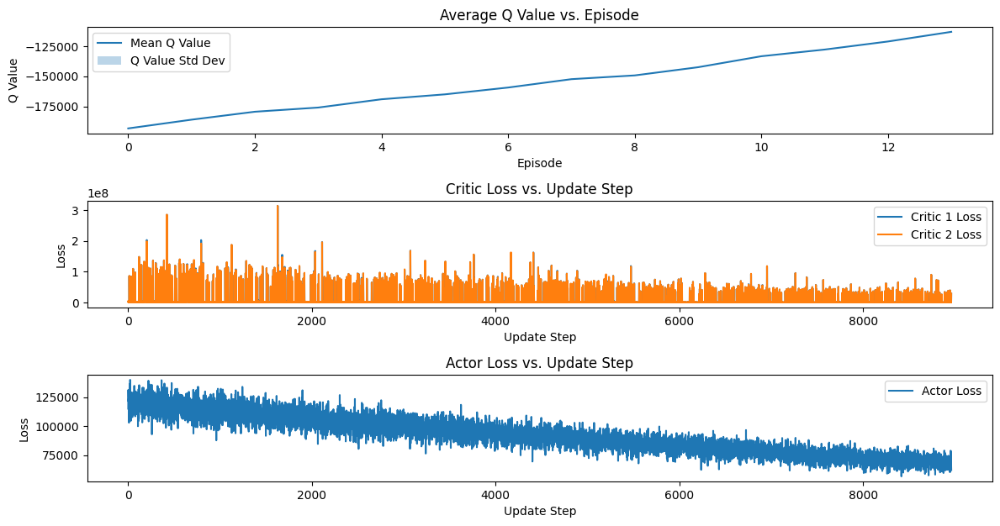

20240121
4
하루 예약자 수       :   45   total 예약자 수    : 11767 
하루 접속 고객 수     :   70   total 접속 고객 수  : 17997 
하루 예약자 비율      : 64.29  total 예약자 비율   : 65.38 
하루 수업 횟수       :   35   total 수업 횟수    : 11697 
하루 차량당 수업횟수    :  2.92  total 차량당 수업횟수 :  3.67 
하루 최적 차량당 수업횟수 :  5.0   total 최적 차량당 수업횟수:  4.88 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   89   total 강화학습 거절 횟수: 18014 
하루 실행 시간       :  41.7  총 실행 시간        : 12213.38


20240122
4
하루 예약자 수       :   41   total 예약자 수    : 11808 
하루 접속 고객 수     :   70   total 접속 고객 수  : 18067 
하루 예약자 비율      : 58.57  total 예약자 비율   : 65.36 
하루 수업 횟수       :   43   total 수업 횟수    : 11740 
하루 차량당 수업횟수    :  3.58  total 차량당 수업횟수 :  3.67 
하루 최적 차량당 수업횟수 :  4.83  total 최적 차량당 수업횟수:  4.88 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   69   total 강화학습 거절 횟수: 18083 
하루 실행 시간       : 42.38  총 실행 시간        : 12255.76


20240123
4
하루 예약자 수       :   59   total 예약자 수    : 11867 
하루 접속 고객 수     :   98   total 접속 고객 수  

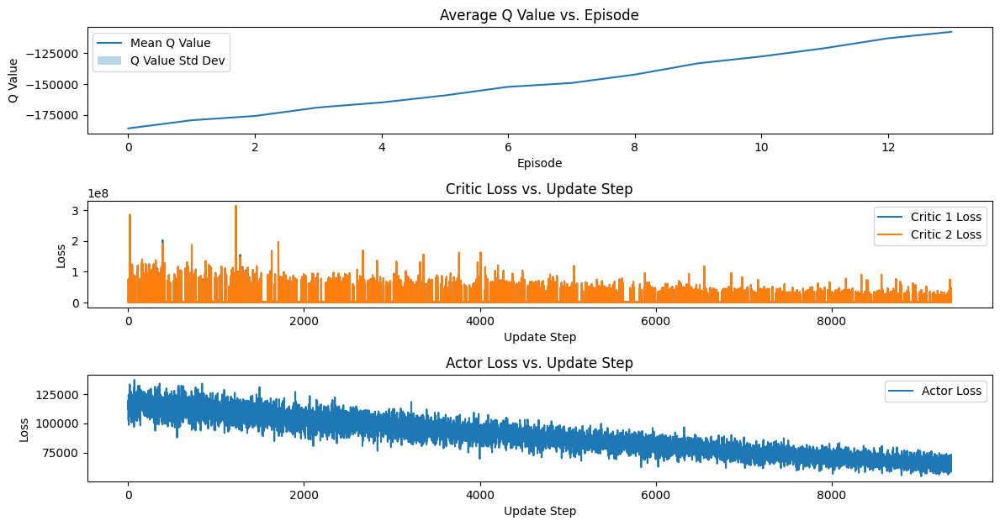

20240131
4
하루 예약자 수       :   48   total 예약자 수    : 12219 
하루 접속 고객 수     :   81   total 접속 고객 수  : 18813 
하루 예약자 비율      : 59.26  total 예약자 비율   : 64.95 
하루 수업 횟수       :   46   total 수업 횟수    : 12140 
하루 차량당 수업횟수    :  3.83  total 차량당 수업횟수 :  3.67 
하루 최적 차량당 수업횟수 :  5.33  total 최적 차량당 수업횟수:  4.88 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   72   total 강화학습 거절 횟수: 18671 
하루 실행 시간       : 65.34  총 실행 시간        : 12715.83


20240201
4
하루 예약자 수       :   43   total 예약자 수    : 12262 
하루 접속 고객 수     :   78   total 접속 고객 수  : 18891 
하루 예약자 비율      : 55.13  total 예약자 비율   : 64.91 
하루 수업 횟수       :   39   total 수업 횟수    : 12179 
하루 차량당 수업횟수    :  3.25  total 차량당 수업횟수 :  3.67 
하루 최적 차량당 수업횟수 :  4.33  total 최적 차량당 수업횟수:  4.88 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   27   total 강화학습 거절 횟수: 18698 
하루 실행 시간       : 39.46  총 실행 시간        : 12755.29


20240202
4
하루 예약자 수       :   55   total 예약자 수    : 12317 
하루 접속 고객 수     :   91   total 접속 고객 수  

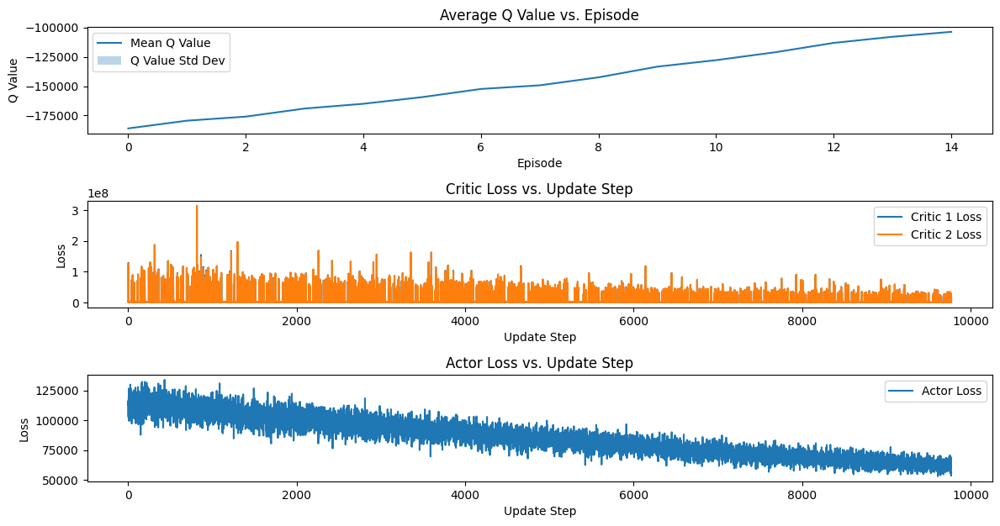

20240210
4
하루 예약자 수       :   50   total 예약자 수    : 12682 
하루 접속 고객 수     :   76   total 접속 고객 수  : 19626 
하루 예약자 비율      : 65.79  total 예약자 비율   : 64.62 
하루 수업 횟수       :   55   total 수업 횟수    : 12612 
하루 차량당 수업횟수    :  4.58  total 차량당 수업횟수 :  3.68 
하루 최적 차량당 수업횟수 :  5.17  total 최적 차량당 수업횟수:  4.89 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   83   total 강화학습 거절 횟수: 19335 
하루 실행 시간       : 69.24  총 실행 시간        : 13272.59


20240211
4
하루 예약자 수       :   48   total 예약자 수    : 12730 
하루 접속 고객 수     :   74   total 접속 고객 수  : 19700 
하루 예약자 비율      : 64.86  total 예약자 비율   : 64.62 
하루 수업 횟수       :   45   total 수업 횟수    : 12657 
하루 차량당 수업횟수    :  3.75  total 차량당 수업횟수 :  3.68 
하루 최적 차량당 수업횟수 :  5.08  total 최적 차량당 수업횟수:  4.89 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   81   total 강화학습 거절 횟수: 19416 
하루 실행 시간       : 45.46  총 실행 시간        : 13318.06


20240212
4
하루 예약자 수       :   36   total 예약자 수    : 12766 
하루 접속 고객 수     :   89   total 접속 고객 수  

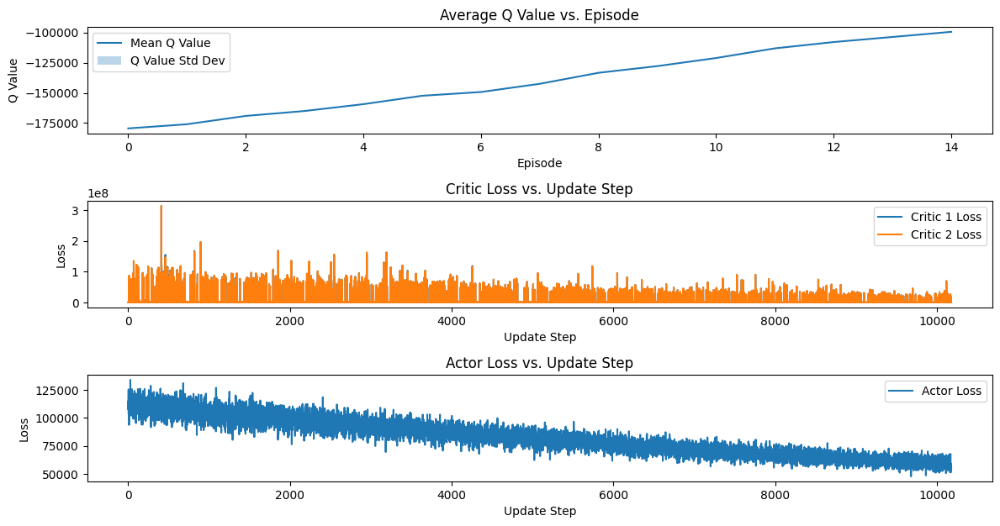

20240220
4
하루 예약자 수       :   51   total 예약자 수    : 13152 
하루 접속 고객 수     :   86   total 접속 고객 수  : 20446 
하루 예약자 비율      :  59.3  total 예약자 비율   : 64.33 
하루 수업 횟수       :   55   total 수업 횟수    : 13083 
하루 차량당 수업횟수    :  4.58  total 차량당 수업횟수 :  3.69 
하루 최적 차량당 수업횟수 :  4.92  total 최적 차량당 수업횟수:  4.89 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   54   total 강화학습 거절 횟수: 20052 
하루 실행 시간       :  70.4  총 실행 시간        : 13786.71


20240221
4
하루 예약자 수       :   57   total 예약자 수    : 13209 
하루 접속 고객 수     :   85   total 접속 고객 수  : 20531 
하루 예약자 비율      : 67.06  total 예약자 비율   : 64.34 
하루 수업 횟수       :   52   total 수업 횟수    : 13135 
하루 차량당 수업횟수    :  4.33  total 차량당 수업횟수 :  3.69 
하루 최적 차량당 수업횟수 :  5.0   total 최적 차량당 수업횟수:  4.9  
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   63   total 강화학습 거절 횟수: 20115 
하루 실행 시간       : 63.34  총 실행 시간        : 13850.04


20240222
4
하루 예약자 수       :   35   total 예약자 수    : 13244 
하루 접속 고객 수     :   72   total 접속 고객 수  

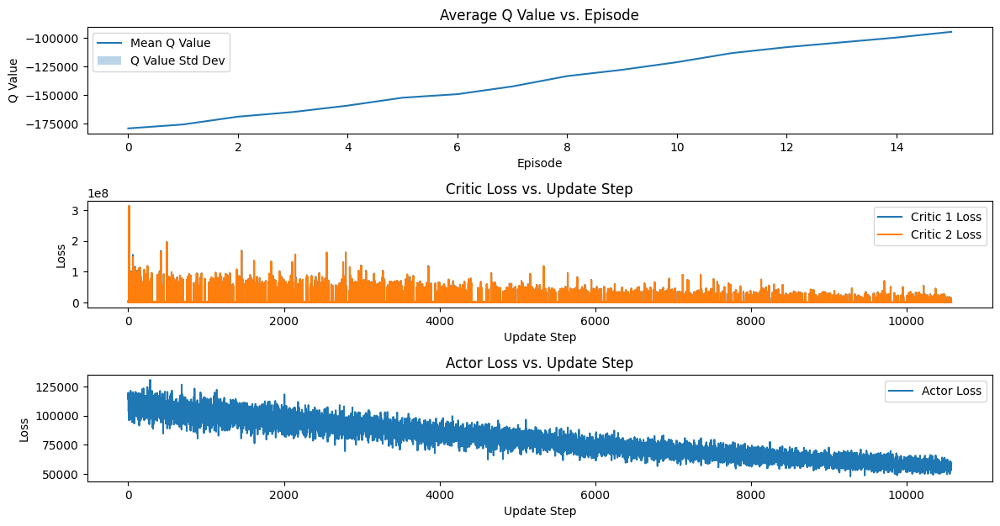

20240301
4
하루 예약자 수       :   37   total 예약자 수    : 13615 
하루 접속 고객 수     :   45   total 접속 고객 수  : 21204 
하루 예약자 비율      : 82.22  total 예약자 비율   : 64.21 
하루 수업 횟수       :   33   total 수업 횟수    : 13558 
하루 차량당 수업횟수    :  2.75  total 차량당 수업횟수 :  3.7  
하루 최적 차량당 수업횟수 :  4.67  total 최적 차량당 수업횟수:  4.9  
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   65   total 강화학습 거절 횟수: 20697 
하루 실행 시간       : 30.62  총 실행 시간        : 14319.91


20240302
4
하루 예약자 수       :   35   total 예약자 수    : 13650 
하루 접속 고객 수     :   49   total 접속 고객 수  : 21253 
하루 예약자 비율      : 71.43  total 예약자 비율   : 64.23 
하루 수업 횟수       :   38   total 수업 횟수    : 13596 
하루 차량당 수업횟수    :  3.17  total 차량당 수업횟수 :  3.7  
하루 최적 차량당 수업횟수 :  5.08  total 최적 차량당 수업횟수:  4.9  
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   56   total 강화학습 거절 횟수: 20753 
하루 실행 시간       :  29.4  총 실행 시간        : 14349.31


20240303
4
하루 예약자 수       :   39   total 예약자 수    : 13689 
하루 접속 고객 수     :   56   total 접속 고객 수  

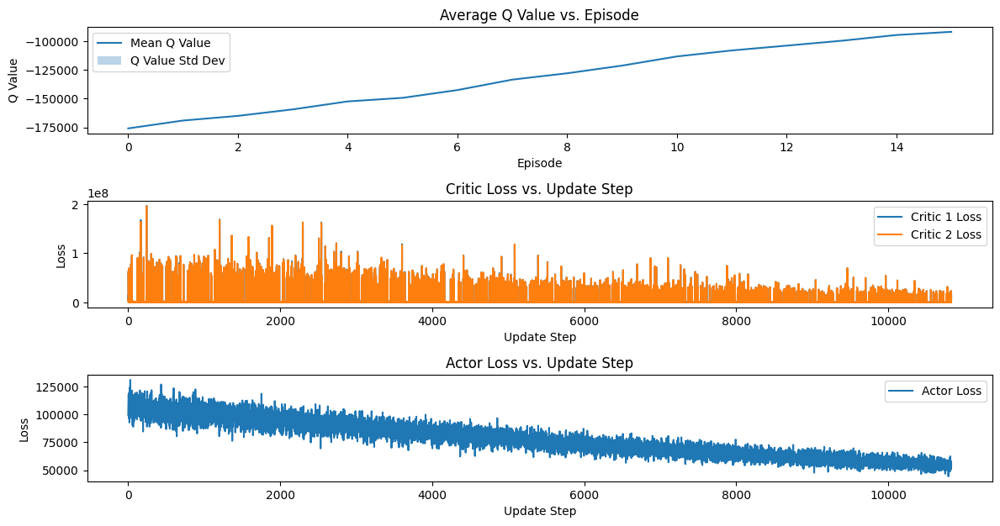

20240311
4
하루 예약자 수       :   33   total 예약자 수    : 13962 
하루 접속 고객 수     :   53   total 접속 고객 수  : 21719 
하루 예약자 비율      : 62.26  total 예약자 비율   : 64.28 
하루 수업 횟수       :   39   total 수업 횟수    : 13926 
하루 차량당 수업횟수    :  3.25  total 차량당 수업횟수 :  3.68 
하루 최적 차량당 수업횟수 :  5.17  total 최적 차량당 수업횟수:  4.89 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   43   total 강화학습 거절 횟수: 21196 
하루 실행 시간       : 32.76  총 실행 시간        : 14627.03


20240312
4
하루 예약자 수       :   31   total 예약자 수    : 13993 
하루 접속 고객 수     :   43   total 접속 고객 수  : 21762 
하루 예약자 비율      : 72.09  total 예약자 비율   :  64.3 
하루 수업 횟수       :   34   total 수업 횟수    : 13960 
하루 차량당 수업횟수    :  2.83  total 차량당 수업횟수 :  3.68 
하루 최적 차량당 수업횟수 :  3.92  total 최적 차량당 수업횟수:  4.88 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   38   total 강화학습 거절 횟수: 21234 
하루 실행 시간       : 27.28  총 실행 시간        : 14654.31


20240313
4
하루 예약자 수       :   31   total 예약자 수    : 14024 
하루 접속 고객 수     :   41   total 접속 고객 수  

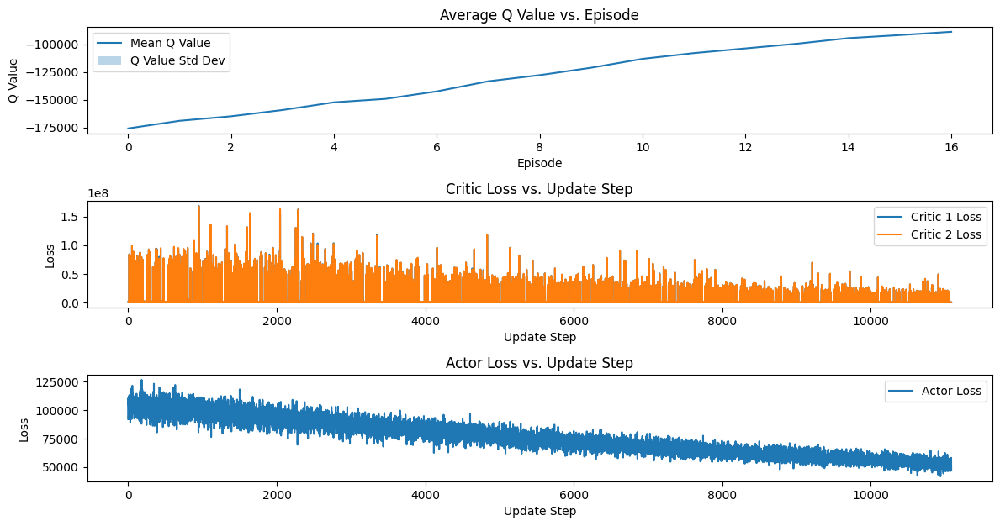

20240321
4
하루 예약자 수       :   40   total 예약자 수    : 14316 
하루 접속 고객 수     :   50   total 접속 고객 수  : 22221 
하루 예약자 비율      :  80.0  total 예약자 비율   : 64.43 
하루 수업 횟수       :   37   total 수업 횟수    : 14278 
하루 차량당 수업횟수    :  3.08  total 차량당 수업횟수 :  3.66 
하루 최적 차량당 수업횟수 :  4.75  total 최적 차량당 수업횟수:  4.88 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   73   total 강화학습 거절 횟수: 21763 
하루 실행 시간       : 33.64  총 실행 시간        : 14924.25


20240322
4
하루 예약자 수       :   41   total 예약자 수    : 14357 
하루 접속 고객 수     :   61   total 접속 고객 수  : 22282 
하루 예약자 비율      : 67.21  total 예약자 비율   : 64.43 
하루 수업 횟수       :   39   total 수업 횟수    : 14317 
하루 차량당 수업횟수    :  3.25  total 차량당 수업횟수 :  3.66 
하루 최적 차량당 수업횟수 :  4.92  total 최적 차량당 수업횟수:  4.88 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   89   total 강화학습 거절 횟수: 21852 
하루 실행 시간       : 32.77  총 실행 시간        : 14957.02


20240323
4
하루 예약자 수       :   39   total 예약자 수    : 14396 
하루 접속 고객 수     :   47   total 접속 고객 수  

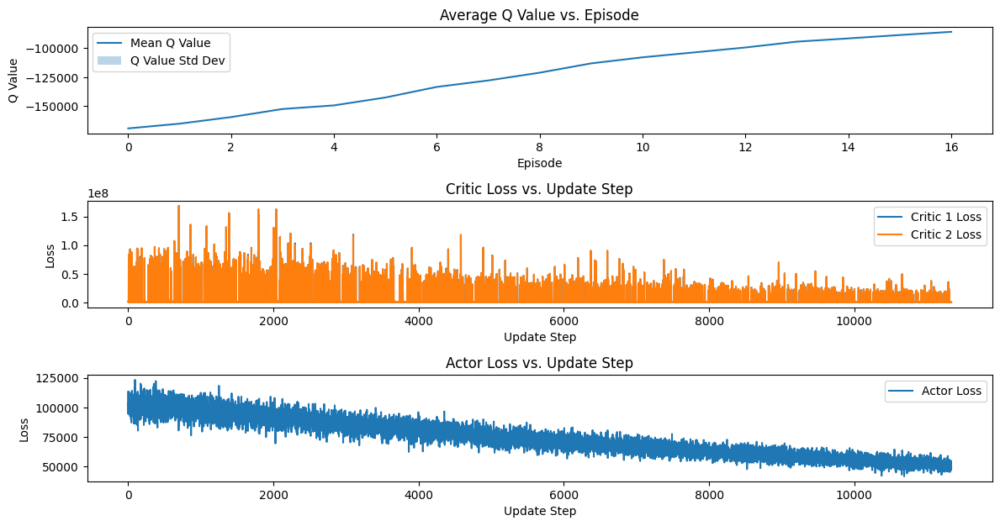

20240331
4
하루 예약자 수       :   36   total 예약자 수    : 14703 
하루 접속 고객 수     :   40   total 접속 고객 수  : 22715 
하루 예약자 비율      :  90.0  total 예약자 비율   : 64.73 
하루 수업 횟수       :   31   total 수업 횟수    : 14666 
하루 차량당 수업횟수    :  2.82  total 차량당 수업횟수 :  3.65 
하루 최적 차량당 수업횟수 :  4.5   total 최적 차량당 수업횟수:  4.87 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   54   total 강화학습 거절 횟수: 22358 
하루 실행 시간       : 23.33  총 실행 시간        : 15231.74


20240401
4
하루 예약자 수       :   45   total 예약자 수    : 14748 
하루 접속 고객 수     :   52   total 접속 고객 수  : 22767 
하루 예약자 비율      : 86.54  total 예약자 비율   : 64.78 
하루 수업 횟수       :   37   total 수업 횟수    : 14703 
하루 차량당 수업횟수    :  3.08  total 차량당 수업횟수 :  3.64 
하루 최적 차량당 수업횟수 :  4.25  total 최적 차량당 수업횟수:  4.87 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   56   total 강화학습 거절 횟수: 22414 
하루 실행 시간       : 28.47  총 실행 시간        : 15260.2


20240402
4
하루 예약자 수       :   35   total 예약자 수    : 14783 
하루 접속 고객 수     :   44   total 접속 고객 수  :

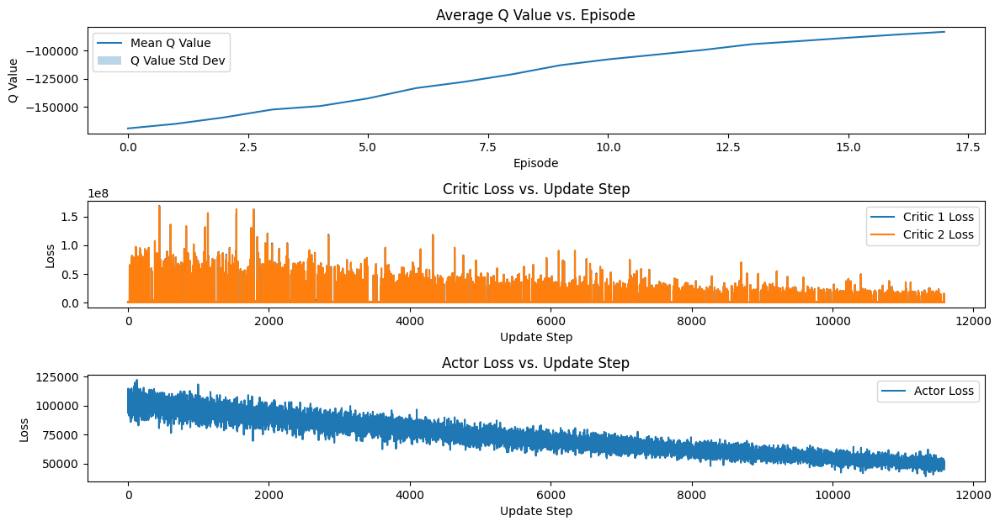

20240410
4
하루 예약자 수       :   44   total 예약자 수    : 15107 
하루 접속 고객 수     :   56   total 접속 고객 수  : 23236 
하루 예약자 비율      : 78.57  total 예약자 비율   : 65.02 
하루 수업 횟수       :   42   total 수업 횟수    : 15065 
하루 차량당 수업횟수    :  3.5   total 차량당 수업횟수 :  3.64 
하루 최적 차량당 수업횟수 :  4.75  total 최적 차량당 수업횟수:  4.87 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   55   total 강화학습 거절 횟수: 22926 
하루 실행 시간       : 39.88  총 실행 시간        : 15566.89


20240411
4
하루 예약자 수       :   32   total 예약자 수    : 15139 
하루 접속 고객 수     :   53   total 접속 고객 수  : 23289 
하루 예약자 비율      : 60.38  total 예약자 비율   :  65.0 
하루 수업 횟수       :   39   total 수업 횟수    : 15104 
하루 차량당 수업횟수    :  3.25  total 차량당 수업횟수 :  3.64 
하루 최적 차량당 수업횟수 :  4.67  total 최적 차량당 수업횟수:  4.87 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   46   total 강화학습 거절 횟수: 22972 
하루 실행 시간       : 34.96  총 실행 시간        : 15601.84


20240412
4
하루 예약자 수       :   41   total 예약자 수    : 15180 
하루 접속 고객 수     :   54   total 접속 고객 수  

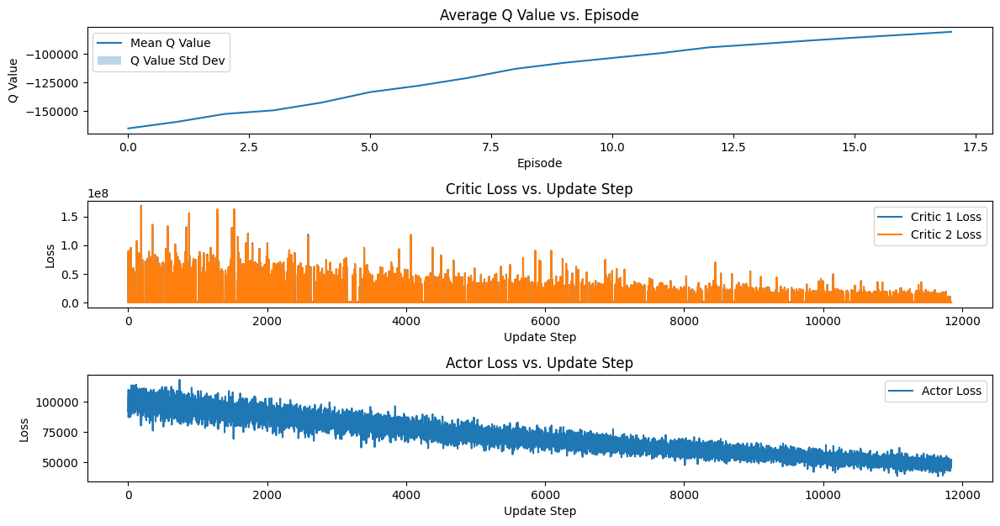

20240420
4
하루 예약자 수       :   39   total 예약자 수    : 15491 
하루 접속 고객 수     :   55   total 접속 고객 수  : 23751 
하루 예약자 비율      : 70.91  total 예약자 비율   : 65.22 
하루 수업 횟수       :   33   total 수업 횟수    : 15462 
하루 차량당 수업횟수    :  2.75  total 차량당 수업횟수 :  3.63 
하루 최적 차량당 수업횟수 :  4.75  total 최적 차량당 수업횟수:  4.86 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   74   total 강화학습 거절 횟수: 23531 
하루 실행 시간       : 28.96  총 실행 시간        : 15875.93


20240421
4
하루 예약자 수       :   44   total 예약자 수    : 15535 
하루 접속 고객 수     :   60   total 접속 고객 수  : 23811 
하루 예약자 비율      : 73.33  total 예약자 비율   : 65.24 
하루 수업 횟수       :   44   total 수업 횟수    : 15506 
하루 차량당 수업횟수    :  3.67  total 차량당 수업횟수 :  3.63 
하루 최적 차량당 수업횟수 :  5.25  total 최적 차량당 수업횟수:  4.87 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   59   total 강화학습 거절 횟수: 23590 
하루 실행 시간       :  40.2  총 실행 시간        : 15916.13


20240422
4
하루 예약자 수       :   44   total 예약자 수    : 15579 
하루 접속 고객 수     :   64   total 접속 고객 수  

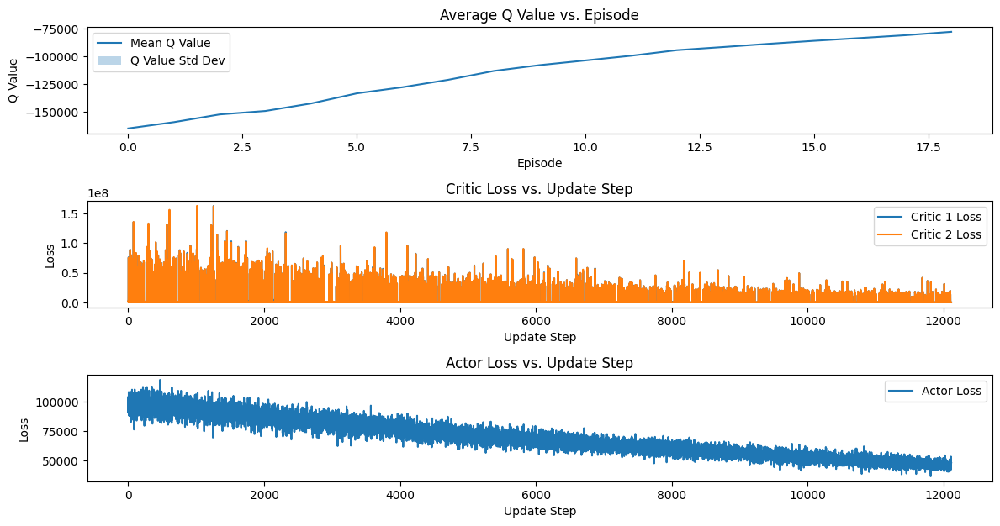

20240430
4
하루 예약자 수       :   25   total 예약자 수    : 15857 
하루 접속 고객 수     :   35   total 접속 고객 수  : 24271 
하루 예약자 비율      : 71.43  total 예약자 비율   : 65.33 
하루 수업 횟수       :   40   total 수업 횟수    : 15857 
하루 차량당 수업횟수    :  3.33  total 차량당 수업횟수 :  3.62 
하루 최적 차량당 수업횟수 :  4.42  total 최적 차량당 수업횟수:  4.86 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   37   total 강화학습 거절 횟수: 24087 
하루 실행 시간       : 24.73  총 실행 시간        : 16209.69


하루 예약자 수       :   0    total 예약자 수    : 15857 
하루 접속 고객 수     :   0    total 접속 고객 수  : 24271 
하루 수업 횟수       :   40   total 수업 횟수    : 15857 
하루 차량당 수업횟수    :  3.33  total 차량당 수업횟수 :  3.62 
하루 최적 차량당 수업횟수 :  4.42  total 최적 차량당 수업횟수:  4.86 
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   0   
하루 강화학습 거절 횟수  :   0    total 강화학습 거절 횟수: 24087 
 Reward: 1320.5126262626252


In [2]:
from model_train_deploy.lib.sac_lstm import SACAgent
import os
import torch
# Hyperparameters
action_dim = 25
hidden_dim = 256
lr = 3e-4
batch_size = 64
num_episodes = 1000
working_dir = os.getcwd()

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device = 'cpu'

agent = SACAgent(action_dim = action_dim, hidden_dim = hidden_dim, lr = lr,  device = device, 
                 num_cars = len(simulator.차량데이터))
path = './model_train_deploy/model/'+str(simulator.train_id)
# agent.load_model(path = path + '/best_model.torch')

day_경과 = 0

best_score = 0
# for 단계 in range(2):
for _ in range(1):
    state = simulator.reset(선택최적 = 0, 선택rule = 'ruleX', mode = 'offline_optimal')
    done = False
    episode_reward = 0
    # agent.clear_memory()
    
    while simulator.simulation_done == False:
        actions = agent.select_action(state)
        next_state, reward, done = simulator.step(actions)
        
        if (done[0] == 1):
            day_경과 += 1
        if (done[0] == 1) & (simulator.simulation_done == False):
            next_state.insert(0, [next_state[0][0], [[] for _ in range(25)]])
            
            if day_경과 %10 == 0:
                agent.log_q_values(init_states)
                agent.plot_metrics()
            for i in range(30):
                agent.store_transition((state[i], actions[i], reward[i], next_state.copy()[i], done[i]))

            next_state.pop(0)
        elif simulator.simulation_done == False:
            for i in range(30):
                agent.store_transition((state[i], actions[i], reward[i], next_state.copy()[i], done[i]))

        state = next_state
        agent.update(batch_size, frame_idx = day_경과) 
        episode_reward += reward[0]


        if simulator.count_total_수업수 > 2000:
            if best_score <= simulator.count_total_수업수/simulator.count_total_차량수:
                best_score = simulator.count_total_수업수/simulator.count_total_차량수
                best_score = simulator.count_total_수업수/simulator.count_total_차량수
                path = '.dags/model_train_deploy/model/'+str(simulator.train_id)
                os.makedirs(path, exist_ok=True)
                agent.save_model(path = path + '/best_model.torch')
                print('saved best model')
    
    print(f" Reward: {episode_reward}")

In [3]:
import time
st = time.time()
simulator.reset(선택최적 = 0, 선택rule = 'rule2')
while simulator.simulation_done == False:
    simulator.step(actions = 1, is_reinforce = False)
print(time.time() - st)

20230404
20230405
하루 예약자 수       :   0    total 예약자 수    :   0   
하루 접속 고객 수     :   1    total 접속 고객 수  :   1   
하루 예약자 비율      :  0.0   total 예약자 비율   :  0.0  
하루 수업 횟수       :   0    total 수업 횟수    :   0   
하루 Rule 거절 횟수  :   1    total Rule 거절 횟수:   1   
하루 강화학습 거절 횟수  :   0    total 강화학습 거절 횟수:   0   
하루 실행 시간       :  0.06  총 실행 시간        :  0.06 


20230406
하루 예약자 수       :   0    total 예약자 수    :   0   
하루 접속 고객 수     :   0    total 접속 고객 수  :   1   
하루 수업 횟수       :   0    total 수업 횟수    :   0   
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   1   
하루 강화학습 거절 횟수  :   0    total 강화학습 거절 횟수:   0   
하루 실행 시간       :  0.0   총 실행 시간        :  0.07 


20230407
하루 예약자 수       :   0    total 예약자 수    :   0   
하루 접속 고객 수     :   0    total 접속 고객 수  :   1   
하루 수업 횟수       :   0    total 수업 횟수    :   0   
하루 Rule 거절 횟수  :   0    total Rule 거절 횟수:   1   
하루 강화학습 거절 횟수  :   0    total 강화학습 거절 횟수:   0   
하루 실행 시간       :  0.0   총 실행 시간        :  0.07 


20230408
하루 예약자 수       :   1    total 예

In [9]:
tmp_모예 = pd.DataFrame(simulator.모든예약)
모예약s = tmp_모예[tmp_모예['연월일']==simulator.오늘.strftime('%Y%m%d')].reset_index(drop = True)

In [10]:
모예약s

,예약_일시,예약_point,예약_point_idx,예약_차종,연월일
0,2023-05-03 19:30:00+09:00,POINT (14149864.044485342 4511027.507219762),2343,2종보통,20230503
1,2023-05-03 20:00:00+09:00,POINT (14148972.857019695 4504481.812783964),1951,2종보통,20230503
2,2023-05-03 20:00:00+09:00,POINT (14138458.42682535 4510462.120284268),1169,2종보통,20230503
3,2023-05-03 15:30:00+09:00,POINT (14152148.051893987 4506731.070555617),2939,2종보통,20230503
4,2023-05-03 15:30:00+09:00,POINT (14146788.783275772 4506825.243062034),906,2종보통,20230503
...,...,...,...,...,...
108,2023-05-03 13:30:00+09:00,POINT (14141373.34819134 4507261.744515002),335,2종보통,20230503
109,2023-05-03 10:30:00+09:00,POINT (14143280.884749908 4507226.343410418),367,2종보통,20230503
110,2023-05-03 13:00:00+09:00,POINT (14154329.089243129 4509131.375043854),2327,2종보통,20230503
111,2023-05-03 14:00:00+09:00,POINT (14150027.38500965 4513580.684316376),1,2종보통,20230503


In [99]:
from ortools.sat.python import cp_model
from model_train_deploy.lib.utils import 구분데이터붙이기, generate_polygon_random_points, 공휴일출력, 예약가능시간출력, 이웃시간판단, time_to_minutes, which_시간대
tmp_모예 = pd.DataFrame(simulator.모든예약)
모예약s = tmp_모예[tmp_모예['연월일']==simulator.오늘.strftime('%Y%m%d')].reset_index(drop = True)
# self.count_오늘_모예_수업수 = len(모예약s)
# self.count_total_모예_수업수 += self.count_오늘_모예_수업수  

if len(모예약s) > 0 :
    # 탐색 대상 일시는 마지막에 append
    모예_customer_times = [time_to_minutes(x.strftime('%H_%M')) for x in 모예약s['예약_일시']]

    num_vehicles = len(simulator.차량데이터)
    num_customers = len(모예_customer_times)
    
    # 모델 생성
    모예_model = cp_model.CpModel()
    
    # 변수 생성: 각 고객을 어느 차량에 배정할지 결정
    모예_vehicle_assignments = [모예_model.NewIntVar(0, num_vehicles, f'customer_{i}') for i in range(num_customers)]
    모예_vehicle_used = [모예_model.NewIntVar(0, 1, f'vehicle_{j}') for j in range(num_vehicles+1)]
    모예_customer_assigned = [모예_model.NewBoolVar(f'customer_assigned_{i}') for i in range(num_customers)]

    for i in range(num_customers):
        모예_model.Add(모예_vehicle_assignments[i] < num_vehicles).OnlyEnforceIf(모예_customer_assigned[i])
        모예_model.Add(모예_vehicle_assignments[i] == num_vehicles).OnlyEnforceIf(모예_customer_assigned[i].Not())
    
    for i in range(num_customers):
        for j in range(i + 1, num_customers):
            if i in simulator.위치_5000이내[j]:
                if abs(모예_customer_times[i] - 모예_customer_times[j]) <= 120:
                    모예_model.Add(모예_vehicle_assignments[i] != 모예_vehicle_assignments[j]).OnlyEnforceIf(
                        [모예_customer_assigned[i], 모예_customer_assigned[j]]
                    )
                    # 모예_model.Add(모예_vehicle_assignments[i] != 모예_vehicle_assignments[j]).OnlyEnforceIf(
                    #     모예_customer_assigned[j]
                    # )
            else:
                if abs(모예_customer_times[i] - 모예_customer_times[j]) <= 150:
                    모예_model.Add(모예_vehicle_assignments[i] != 모예_vehicle_assignments[j]).OnlyEnforceIf(
                        [모예_customer_assigned[i], 모예_customer_assigned[j]]
                    )
                    # 모예_model.Add(모예_vehicle_assignments[i] != 모예_vehicle_assignments[j]).OnlyEnforceIf(
                    #     모예_customer_assigned[j]
                    # )

    # 각 고객이 배정된 차량이 실제로 사용되었는지 여부
    for i in range(num_customers):
        모예_model.AddElement(모예_vehicle_assignments[i], 모예_vehicle_used, 1)#.OnlyEnforceIf(모예_customer_assigned[i])
    
    # 목적식: 사용된 차량의 수를 최소화
    모예_model.Maximize(sum(모예_customer_assigned) - sum(모예_vehicle_used[j] for j in range(num_vehicles))*0.5)
    
    # 최적화: 모델을 해결
    모예_solver = cp_model.CpSolver()
    # solver.parameters.max_time_in_seconds = 10.0
    모예_status = 모예_solver.Solve(모예_model)
    print(모예_status)

4


In [100]:
if 모예_status == cp_model.OPTIMAL:
    print("Status is OPTIMAL")
elif 모예_status == cp_model.FEASIBLE:
    print("Status is FEASIBLE")
elif 모예_status == cp_model.INFEASIBLE:
    print("Status is INFEASIBLE")
elif 모예_status == cp_model.MODEL_INVALID:
    print("Status is MODEL_INVALID")
elif 모예_status == cp_model.UNKNOWN:
    print("Status is UNKNOWN")

Status is OPTIMAL


In [101]:
for i in range(num_vehicles):
    print(모예_solver.Value(모예_vehicle_assignments[i]))

0
15
15
0
1
15
15
15
15
12
15
15
9
15
13


In [102]:
for i in range(num_vehicles):
    print(모예_solver.Value(모예_customer_assigned[i]))

1
0
0
1
1
0
0
0
0
1
0
0
1
0
1


In [103]:
for i in range(num_vehicles+1):
    print(모예_solver.Value(모예_vehicle_used[i]))


1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1


In [16]:
모예_vehicle_assignments[0]

customer_0(-1..14)

In [14]:
모예_vehicle_assignments

[customer_0(-1..14),
 customer_1(-1..14),
 customer_2(-1..14),
 customer_3(-1..14),
 customer_4(-1..14),
 customer_5(-1..14),
 customer_6(-1..14),
 customer_7(-1..14),
 customer_8(-1..14),
 customer_9(-1..14),
 customer_10(-1..14),
 customer_11(-1..14),
 customer_12(-1..14),
 customer_13(-1..14),
 customer_14(-1..14),
 customer_15(-1..14),
 customer_16(-1..14),
 customer_17(-1..14),
 customer_18(-1..14),
 customer_19(-1..14),
 customer_20(-1..14),
 customer_21(-1..14),
 customer_22(-1..14),
 customer_23(-1..14),
 customer_24(-1..14),
 customer_25(-1..14),
 customer_26(-1..14),
 customer_27(-1..14),
 customer_28(-1..14),
 customer_29(-1..14),
 customer_30(-1..14),
 customer_31(-1..14),
 customer_32(-1..14),
 customer_33(-1..14),
 customer_34(-1..14),
 customer_35(-1..14),
 customer_36(-1..14),
 customer_37(-1..14),
 customer_38(-1..14),
 customer_39(-1..14),
 customer_40(-1..14),
 customer_41(-1..14),
 customer_42(-1..14),
 customer_43(-1..14),
 customer_44(-1..14),
 customer_45(-1..14)

In [44]:
xagent.memory[2][0]

([[82179.0,
   np.int64(2923),
   np.float64(123.0),
   np.False_,
   np.float64(12.64914709276355),
   np.float64(2.1679025771549885),
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0],
  [[],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   []]],
 array([[ 2.0577495e+02,  9.9712654e+01, -4.1473026e+02,  1.5963312e+02,
         -2.0563344e+02,  2.9434302e+02,  2.3904345e+01, -4.3022358e-01,
         -5.1242975e+02,  7.8075024e+02, -4.2231601e+02, -2.2456381e+02,
          1.7154501e+02, -8.5872272e+02,  2.1067911e+02, -9.3237907e+01,
          2.3458916e+02,  4.9009000e+02,  6.0597314e+02, -9.5589439e+01,
         -2.2870427e+02, -6.7467932e+02, -5.2658301e+02,  4.9866113e+02,
         -5.2723456e+02]], dtype=float32),
 0,
 [[21001.0,
   652,
   88.0,
   False,
   13.126091

In [53]:
len(agent.memory)

1

In [54]:
agent.memory

[[]]

In [4]:
agent.value_losses

[251.99972534179688]

In [3]:
agent.policy_losses

[1.240050196647644]

In [52]:
for _ in range(29):
    states, actions, rewards, next_states, dones, log_probs = zip(*agent.memory.pop(0))
    from model_train_deploy.lib.ppo import state_to_tensor
    states = [state_to_tensor(state, agent.device, agent.num_cars) for state in states]
    next_states = [state_to_tensor(state, agent.device, agent.num_cars) for state in next_states]
    import torch
    continuous_vars = torch.cat([s[0] for s in states], dim=0).to(agent.device)
    variable_length_tensors = torch.cat([s[1] for s in states], dim=0).to(agent.device)
    next_continuous_vars = torch.cat([s[0] for s in next_states], dim=0).to(agent.device)
    next_variable_length_tensors = torch.cat([s[1] for s in next_states], dim=0).to(agent.device)
    
    
    rewards = torch.tensor(rewards, dtype=torch.float32).to(agent.device)
    dones = torch.tensor(dones, dtype=torch.float32).to(agent.device)
    actions = torch.tensor(actions, dtype=torch.float32).to(agent.device).squeeze(1)
    old_log_probs = torch.tensor(log_probs, dtype=torch.float32).to(agent.device).squeeze(1)
    import torch.nn.functional as F
    with torch.no_grad():
        next_values = agent.value_net(next_continuous_vars, next_variable_length_tensors).squeeze(1)
        target_values = rewards + (1 - dones) * next_values
    values = agent.value_net(continuous_vars, variable_length_tensors).squeeze(1)
    value_loss = F.mse_loss(values, target_values)
    from model_train_deploy.lib.ppo import Normal
    mu, std = agent.policy_net(continuous_vars, variable_length_tensors)
    dist = Normal(mu, std)
    log_probs = dist.log_prob(actions).sum(-1)
    advantages = target_values - values
    ratio = torch.exp(log_probs - old_log_probs)
    surr1 = ratio * advantages
    surr2 = torch.clamp(ratio, 1.0 - agent.clip_param, 1.0 + agent.clip_param) * advantages
    policy_loss = -torch.min(surr1, surr2).mean()
    agent.policy_optimizer.zero_grad()
    policy_loss.backward()
    agent.policy_optimizer.step()

In [47]:
print(surr2)

tensor([ -582.4698, -1060.2405, -1060.1882, -1060.2460, -1060.3873, -1060.4193,
        -1060.4348, -1060.4359, -1060.4375, -1060.4332, -1060.4348, -1060.4316,
        -1060.4344, -1060.4329, -1060.4384, -1060.4329, -1060.4368, -1060.4344,
        -1060.4384, -1060.4368, -1060.4375, -1060.4384, -1060.4407, -1060.4329,
        -1060.4391, -1060.4313, -1060.4391, -1060.4375, -1061.1234, -1060.4375],
       grad_fn=<MulBackward0>)


tensor(1716169.6250, grad_fn=<MseLossBackward0>)

In [26]:
policy_loss

tensor(1044.5034, grad_fn=<NegBackward0>)

In [33]:
advantages = target_values - values
surr1 = ratio * advantages
surr1

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0.], grad_fn=<MulBackward0>)

In [26]:
states[0]

(tensor([[9.9480e+03, 1.1080e+03, 2.0300e+02, 1.0000e+00, 1.1727e+01, 2.4006e+00,
          0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
          0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
          0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
          0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
          0.0000e+00]]),
 tensor([[[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

In [6]:
len(states)

30

In [19]:
states[0][0]

[9948.0,
 np.int64(1108),
 np.float64(203.0),
 np.True_,
 np.float64(11.727115842763551),
 np.float64(2.400581604644428),
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0]

In [10]:
states[1]

[[96348.0,
  np.int64(1108),
  np.float64(203.0),
  np.True_,
  np.float64(13.20732027078566),
  np.float64(2.4972011429142658),
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 [[],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  []]]

In [9]:
states[0]

[[9948.0,
  np.int64(1108),
  np.float64(203.0),
  np.True_,
  np.float64(11.727115842763551),
  np.float64(2.400581604644428),
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 [[],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  [],
  []]]

In [3]:
agent.policy_losses

[-0.0]

In [3]:
state

[[[79602.0,
   np.int64(2848),
   np.float64(61.0),
   np.False_,
   np.float64(13.267536203219594),
   np.float64(2.181639161358441),
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0],
  [[],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   []]],
 [[166002.0,
   np.int64(2848),
   np.float64(61.0),
   np.False_,
   np.float64(13.047392841361026),
   np.float64(2.249830768023899),
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0,
   0],
  [[],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   [],
   []]],
 [[252402.0,
   np.int64(2848),
   np.float64(61.0),
   np.True_,
   np.f

In [9]:
next_state[0][0][3].item()

False

In [ ]:
15

In [6]:
simulator.차량데이터

,시군구_id,차량코드,차종,주차_point,주차권역,기록일시
0,11220,0,2종 보통,POINT (14140079.842 4504752.82),None,2024-05-02 14:16:08.713397+09:00
1,11220,1,2종 보통,POINT (14139781.054 4508883.643),None,2024-05-02 14:16:08.714078+09:00
2,11230,5,2종 보통,POINT (14142573.091 4508818.642),None,2024-05-02 14:16:08.716154+09:00
3,11240,11,2종 보통,POINT (14149628.192 4508356.224),None,2024-05-02 14:16:08.718540+09:00
4,11220,3,2종 보통,POINT (14139812.932 4507198.507),None,2024-05-02 14:16:08.715333+09:00
5,11220,2,2종 보통,POINT (14137158.985 4506909.562),None,2024-05-02 14:16:08.714630+09:00
6,11230,4,2종 보통,POINT (14141527.085 4509149.93),None,2024-05-02 14:16:08.715765+09:00
7,11230,6,2종 보통,POINT (14148723.234 4507196.342),None,2024-05-02 14:16:08.716566+09:00
8,11230,7,2종 보통,POINT (14141395.121 4513206.895),None,2024-05-02 14:16:08.716956+09:00
9,11240,10,2종 보통,POINT (14153367.481 4508295.244),None,2024-05-02 14:16:08.718131+09:00


In [8]:
import pandas as pd
남예 = pd.DataFrame(simulator.남은예약)
남예

,예약_일시,예약_point,예약_point_idx,예약_차종,연월일,임시배정차량코드
0,2024-05-01 16:00:00+09:00,POINT (14152706.634895839 4509731.549233416),2439,2종보통,20240501,11220
1,2024-05-03 11:30:00+09:00,POINT (14139411.724782627 4510807.422145303),1087,2종보통,20240503,10
2,2024-05-03 11:30:00+09:00,POINT (14152639.252543284 4508843.92160569),2476,2종보통,20240503,9
3,2024-05-01 10:30:00+09:00,POINT (14141937.301141093 4511969.893709017),1572,2종보통,20240501,11240
4,2024-05-19 21:00:00+09:00,POINT (14138132.246431049 4510552.885364526),653,2종보통,20240519,10
...,...,...,...,...,...,...
62,2024-05-02 14:00:00+09:00,POINT (14140728.28765587 4510560.382477382),1543,2종보통,20240502,8
63,2024-05-01 17:00:00+09:00,POINT (14143730.9019002 4508287.168210239),792,2종보통,20240501,11240
64,2024-05-01 09:30:00+09:00,POINT (14150979.825790446 4513813.327036772),2141,2종보통,20240501,11240
65,2024-05-02 09:30:00+09:00,POINT (14151220.334250223 4509201.469851597),2670,2종보통,20240502,7


In [5]:
simulator.차량데이터['차량코드'].to_list()

['0', '1', '5', '11', '3', '2', '4', '6', '7', '10', '8', '9']

In [19]:
import pickle
위치데이터_path = 'daily_push/data/Gangnam3Districts_Boundary_Center.pickle'
with open(위치데이터_path, 'rb') as f:
    강남3구_집계구_경계_중심 = pickle.load(f)
강남3구_집계구_경계_중심

,gu,TOT_REG_CD,geometry,count,centroid
0,11220,11220520010107,"POLYGON ((127.02654 37.48948, 127.02601 37.489...",53.0,POINT (127.02621 37.48978)
1,11220,11220590020102,"POLYGON ((127.00201 37.5079, 127.00223 37.5074...",54.0,POINT (127.00173 37.50763)
2,11220,11220670020002,"POLYGON ((127.03551 37.46515, 127.03539 37.464...",114.0,POINT (127.0478 37.44425)
3,11220,11220680030001,"POLYGON ((127.07618 37.45624, 127.07639 37.456...",116.0,POINT (127.06819 37.44481)
4,11220,11220540010106,"POLYGON ((127.02177 37.50081, 127.02166 37.500...",60.0,POINT (127.02117 37.50097)
...,...,...,...,...,...
3067,11240,11240540010801,"POLYGON ((127.14493 37.48965, 127.14463 37.488...",146.0,POINT (127.14401 37.48973)
3068,11240,11240590030105,"POLYGON ((127.14341 37.51721, 127.14356 37.517...",63.0,POINT (127.14088 37.51645)
3069,11240,11240590040102,"POLYGON ((127.13568 37.51516, 127.13544 37.514...",51.0,POINT (127.13466 37.51537)
3070,11240,11240820010202,"POLYGON ((127.14042 37.48346, 127.14018 37.482...",66.0,POINT (127.13148 37.47358)


In [20]:
강남3구_집계구_경계_중심.columns = ['행정구_id', '집계구_id', '경계', '수요인구', '중심']

강남3구_집계구_경계_중심['경계'] = 강남3구_집계구_경계_중심['경계'].to_crs(epsg = 4326)
강남3구_집계구_경계_중심['중심'] = 강남3구_집계구_경계_중심['중심'].to_crs(epsg = 4326)
강남3구_집계구_경계_중심 = 강남3구_집계구_경계_중심.set_geometry("중심")
강남3구_집계구_경계_중심

,행정구_id,집계구_id,경계,수요인구,중심
0,11220,11220520010107,"POLYGON ((127.02654 37.48948, 127.02601 37.489...",53.0,POINT (127.02621 37.48978)
1,11220,11220590020102,"POLYGON ((127.00201 37.5079, 127.00223 37.5074...",54.0,POINT (127.00173 37.50763)
2,11220,11220670020002,"POLYGON ((127.03551 37.46515, 127.03539 37.464...",114.0,POINT (127.0478 37.44425)
3,11220,11220680030001,"POLYGON ((127.07618 37.45624, 127.07639 37.456...",116.0,POINT (127.06819 37.44481)
4,11220,11220540010106,"POLYGON ((127.02177 37.50081, 127.02166 37.500...",60.0,POINT (127.02117 37.50097)
...,...,...,...,...,...
3067,11240,11240540010801,"POLYGON ((127.14493 37.48965, 127.14463 37.488...",146.0,POINT (127.14401 37.48973)
3068,11240,11240590030105,"POLYGON ((127.14341 37.51721, 127.14356 37.517...",63.0,POINT (127.14088 37.51645)
3069,11240,11240590040102,"POLYGON ((127.13568 37.51516, 127.13544 37.514...",51.0,POINT (127.13466 37.51537)
3070,11240,11240820010202,"POLYGON ((127.14042 37.48346, 127.14018 37.482...",66.0,POINT (127.13148 37.47358)


In [21]:
강남3구_집계구_경계_중심.to_postgis('관리_info_집계구', simulator.db_handler.engine, if_exists='replace', schema='datamart')

In [7]:
simulator.data.sort_values('예약희망일시').reset_index(drop=True).loc[0, '예약희망일시']

Timestamp('2022-06-28 10:00:00+0900', tz='Asia/Seoul')

In [4]:
simulator.cluster.군집s

{"[('01', '0', False, '심야'), ('01', '0', True, '심야'), ('01', '1', False, '심야'), ('01', '1', True, '심야'), ('01', '2', False, '심야'), ('01', '2', True, '심야'), ('01', '3', False, '심야'), ('01', '3', True, '심야'), ('01', '4', False, '심야'), ('01', '4', True, '심야'), ('01', '5', False, '심야'), ('01', '5', True, '심야'), ('01', '6', False, '심야'), ('01', '6', True, '심야'), ('02', '0', False, '심야'), ('02', '0', True, '심야'), ('02', '1', False, '심야'), ('02', '1', True, '심야'), ('02', '2', False, '심야'), ('02', '2', True, '심야'), ('02', '3', False, '심야'), ('02', '3', True, '심야'), ('02', '4', False, '심야'), ('02', '4', True, '심야'), ('02', '5', False, '심야'), ('02', '5', True, '심야'), ('02', '6', False, '심야'), ('02', '6', True, '심야'), ('03', '0', False, '심야'), ('03', '0', True, '심야'), ('03', '1', False, '심야'), ('03', '1', True, '심야'), ('03', '2', False, '심야'), ('03', '2', True, '심야'), ('03', '3', False, '심야'), ('03', '3', True, '심야'), ('03', '4', False, '심야'), ('03', '4', True, '심야'), ('03', '5', False, '심야'), ('

In [40]:
import pandas as pd
path = 'daily_push/data/2023년기준_2022년_성연령별인구.txt'
data = pd.read_table(path, sep = '^', header = None)
data
data[1] = data[1].astype(str)

In [41]:
data2 = data[data[2].isin(['in_age_006', 'in_age_007', 'in_age_008'])].groupby(1)[3].sum().reset_index()

# 열 이름 변경
data2.columns = ['집계구_id', 'count']
data2

,집계구_id,count
0,11010530010001,115.0
1,11010530020001,89.0
2,11010530020002,124.0
3,11010530020003,80.0
4,11010530020004,107.0
...,...,...
101524,39020620020002,58.0
101525,39020620020003,39.0
101526,39020620020004,89.0
101527,39020620020007,75.0


In [27]:
import geopandas as gpd
tmp_path = 'daily_push/data/bnd_oa_00_2023_2023_2Q.shp'
tmp_df = gpd.read_file(tmp_path)
tmp_df['centroid'] = tmp_df['geometry'].centroid
tmp_df

,BASE_DATE,ADM_CD,TOT_REG_CD,geometry,centroid
0,20230701,11080650,11080650020002,"POLYGON ((954470.101 1959788.502, 954491.157 1...",POINT (955074.313 1958698.487)
1,20230701,11150700,11150700010802,"POLYGON ((943692.549 1945825.335, 943604.782 1...",POINT (943634.339 1945834.977)
2,20230701,11150710,11150710010802,"POLYGON ((945291.653 1948668.427, 945235.074 1...",POINT (945253.552 1948680.377)
3,20230701,11190760,11190760020402,"POLYGON ((945527.027 1946910.978, 945526.144 1...",POINT (945461.137 1946902.806)
4,20230701,11190760,11190760021801,"POLYGON ((946299.867 1946589.521, 946412.131 1...",POINT (946338.452 1946557.797)
...,...,...,...,...,...
103913,20230701,39020600,39020600080001,"MULTIPOLYGON (((903881.311 1471193.078, 903882...",POINT (903479.374 1471772.267)
103914,20230701,39020620,39020620020012,"MULTIPOLYGON (((895003.222 1471426.973, 895001...",POINT (895106.63 1471575.196)
103915,20230701,39010320,39010320020006,"MULTIPOLYGON (((891952.441 1548918.26, 891951....",POINT (891648.137 1552190.52)
103916,20230701,39010660,39010660070205,"POLYGON ((904457.966 1499987.377, 904490.698 1...",POINT (904356.728 1499878.242)


In [52]:
tmp = pd.merge(data2, tmp_df, how = 'left', left_on = '집계구_id', right_on = 'TOT_REG_CD')
tmp2 = tmp.loc[:, ['집계구_id', 'geometry', 'count', 'centroid']]
tmp2.columns = ['집계구_id', '경계', '수요인구', '중심']
tmp3 = gpd.GeoDataFrame(tmp2)
tmp3['경계'] = tmp3['경계'].to_crs(epsg=4326)
tmp3['중심'] = tmp3['중심'].to_crs(epsg=4326)
tmp3 = tmp3.set_geometry("중심")
tmp3

,집계구_id,경계,수요인구,중심
0,11010530010001,"POLYGON ((126.97407 37.57749, 126.97407 37.577...",115.0,POINT (126.97301 37.57778)
1,11010530020001,"POLYGON ((126.97112 37.57832, 126.97118 37.578...",89.0,POINT (126.97103 37.57679)
2,11010530020002,"POLYGON ((126.97033 37.57912, 126.97039 37.579...",124.0,POINT (126.9701 37.57792)
3,11010530020003,"POLYGON ((126.96645 37.57883, 126.96647 37.578...",80.0,POINT (126.96516 37.57704)
4,11010530020004,"POLYGON ((126.96903 37.57626, 126.9693 37.5760...",107.0,POINT (126.96654 37.57528)
...,...,...,...,...
101524,39020620020002,"POLYGON ((126.3824 33.24134, 126.38298 33.2413...",58.0,POINT (126.3803 33.2378)
101525,39020620020003,"POLYGON ((126.39204 33.25017, 126.3921 33.2500...",39.0,POINT (126.39161 33.24866)
101526,39020620020004,"POLYGON ((126.40383 33.25076, 126.40395 33.250...",89.0,POINT (126.39731 33.25328)
101527,39020620020007,"POLYGON ((126.3723 33.26516, 126.3723 33.26514...",75.0,POINT (126.38201 33.25476)


In [53]:
tmp3.to_postgis('관리_info_집계구', simulator.db_handler.engine, if_exists='replace', schema='datamart')

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
num_구s = ['11220', '11230', '11240']
data_frontiers = []
data_frontier = pd.DataFrame()
data_인구 = pd.DataFrame()
# pd.read_table('./raw_data/stat/11220_2022년_성연령별인구.txt', sep = '^', header = None)
for num_구 in num_구s:
    data_frontiers.append(gpd.read_file('./raw_data/frontier'+num_구+'/bnd_oa_'+num_구+'_2023_2023_2Q.shp'))
    data_frontiers[-1]['gu'] = str(num_구)
    data_frontier = pd.concat([data_frontier, data_frontiers[-1][['gu', 'TOT_REG_CD', 'geometry']]]).reset_index(drop = True)

    data_인구 = pd.concat([data_인구, pd.read_table('./raw_data/stat/'+num_구+'_2022년_성연령별인구.txt', sep = '^', header = None, names = ['year', 'TOT_REG_CD', 'sex_age_code', 'count'])]).reset_index(drop = True)
data_인구 = data_인구.loc[(data_인구['sex_age_code'] == 'in_age_006')|(data_인구['sex_age_code'] == 'in_age_007')|(data_인구['sex_age_code'] == 'in_age_008'), :]
data_인구 = data_인구.groupby('TOT_REG_CD').agg({'count': 'sum'}).reset_index()
data_인구['TOT_REG_CD'] = data_인구['TOT_REG_CD'].astype(str)
종합데이터 = data_frontier.merge(data_인구, how = 'left', on = 'TOT_REG_CD')
종합데이터['centroid'] = 종합데이터['geometry'].centroid
종합데이터['centroid'] = 종합데이터['centroid'].to_crs(epsg=4326)
종합데이터['geometry'] = 종합데이터['geometry'].to_crs(epsg=4326)

data_frontiers[-1]
